In [208]:
install.packages("lmtest")
install.packages("forecast")
install.packages("DIMORA")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [209]:
library(readxl)
library(lmtest)
library(forecast)
library(DIMORA)
library(dplyr)

In [210]:
library(ggplot2)
options(repr.plot.width=20, repr.plot.height=10)

In [4]:
sail_total <- read.csv("TOTALSA.csv")
sail_total <- data.frame(sail_total)
head(sail_total,10)

,DATE,TOTALSA
,<chr>,<dbl>
1,1976-01-01,12.814
2,1976-02-01,13.340
3,1976-03-01,13.378
4,1976-04-01,13.223
5,1976-05-01,12.962
6,1976-06-01,13.051
7,1976-07-01,13.466
8,1976-08-01,12.953
9,1976-09-01,13.610


In [211]:
time_sail<- 1:NROW(sail_total)
sail <- sail_total$TOTALSA

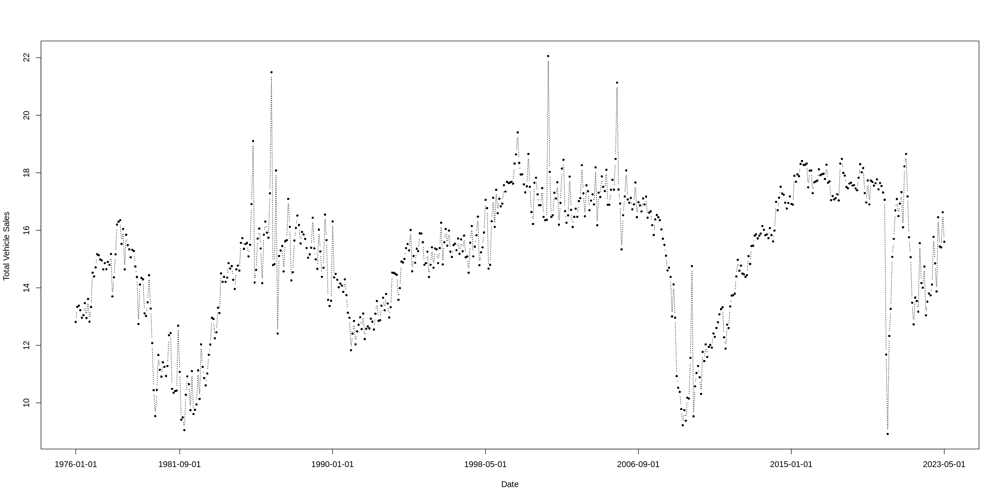

In [212]:
plot(sail, type= "b",xlab="Date", ylab="Total Vehicle Sales ",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1,69,169,269,369,469,569), labels=sail_total$DATE[c(1,69,169,269,369,469,569)])

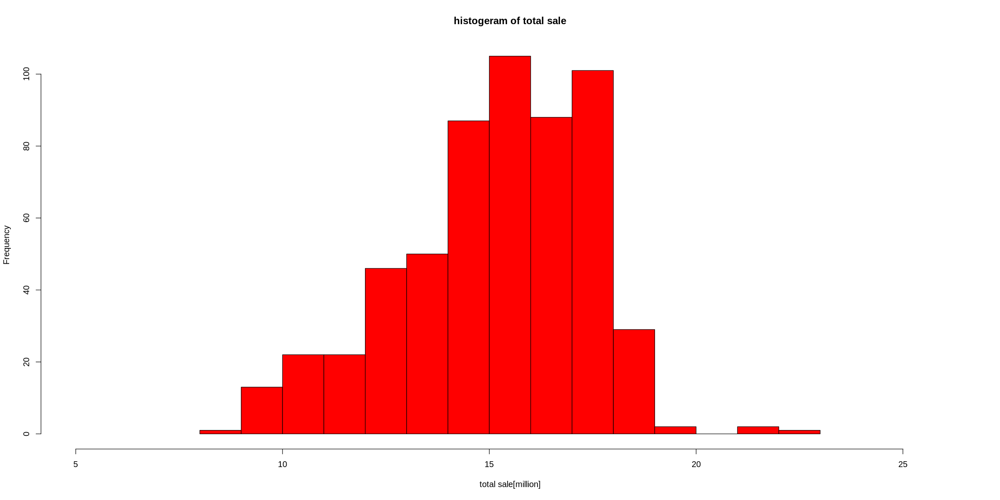

In [237]:
hist(sail,breaks=15,main = 'histogeram of total sale',
xlab="total sale[million]",
xlim=c(5,26),
col="red",
border="black")


In [244]:
#### filtering for year
sail_total$date<-as.Date(sail_total$DATE, "%Y-%m-%d")
sail_total$year <- format(sail_total$date, '%Y')


s81 <-sail_total %>% filter(date>='1976-01-01' & date<='1981-12-01' )
s90 <-sail_total %>% filter(date>='1982-01-01' & date<='1990-12-01' )
s09 <-sail_total %>% filter(date>='1991-01-01' & date<='2009-02-01' )
s21 <-sail_total %>% filter(date>='2009-03-01' & date<='2021-09-01' )
s23 <-sail_total %>% filter(date>='2021-10-01' & date<= '2023-05-01')

In [245]:
head(sail_total)

,DATE,TOTALSA,date,year
,<chr>,<dbl>,<date>,<chr>
1,1976-01-01,12.814,1976-01-01,1976
2,1976-02-01,13.340,1976-02-01,1976
3,1976-03-01,13.378,1976-03-01,1976
4,1976-04-01,13.223,1976-04-01,1976
5,1976-05-01,12.962,1976-05-01,1976
6,1976-06-01,13.051,1976-06-01,1976


In [8]:
train <- sail_total %>% filter(date>='1976-01-01' & date<='2023-05-01' )

t_train <- 1:NROW(train)
n_train <- train$TOTALSA

test <- sail_total %>% filter(date>='2021-06-01' & date<='2023-05-01' )
t_test <- 1:NROW(test)
n_test <- test$TOTALSA

In [246]:
i <-sail_total %>% group_by(year) %>% summarise(sum_y = sum(TOTALSA),.groups = 'drop')

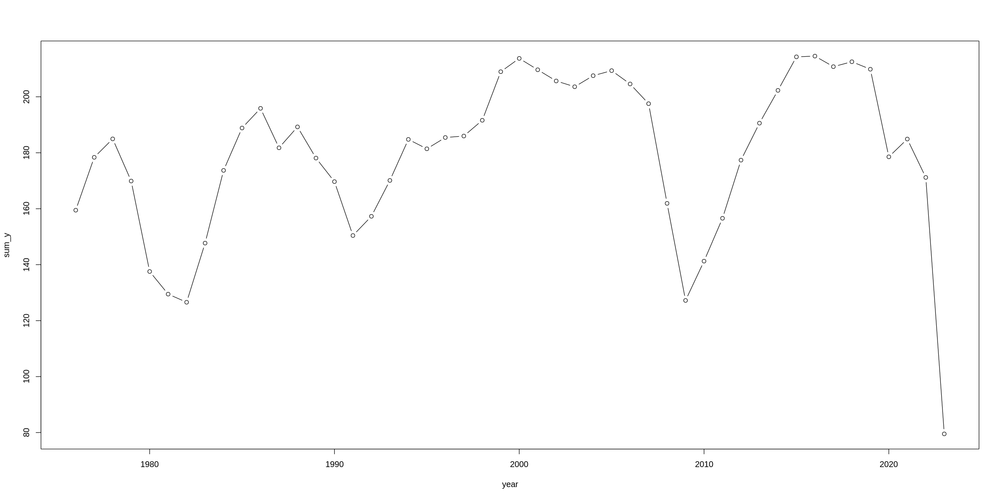

In [253]:
plot(i, type='b')

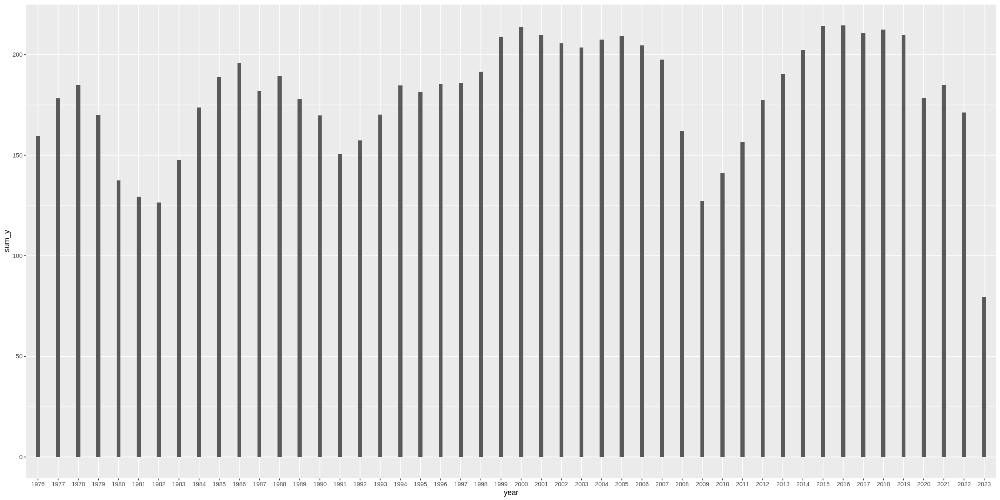

In [250]:
ggplot(i, aes(x=year, y=sum_y)) +
  geom_bar(stat = "identity", width=0.2)

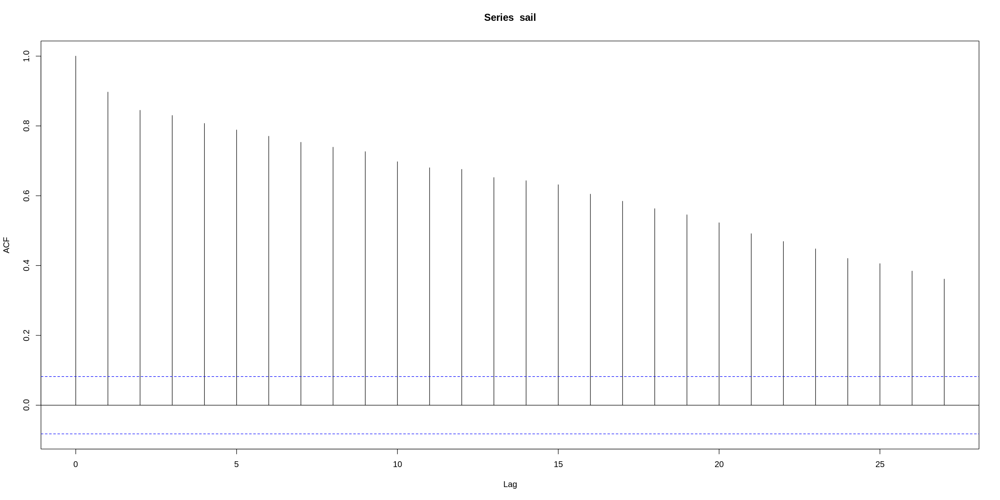

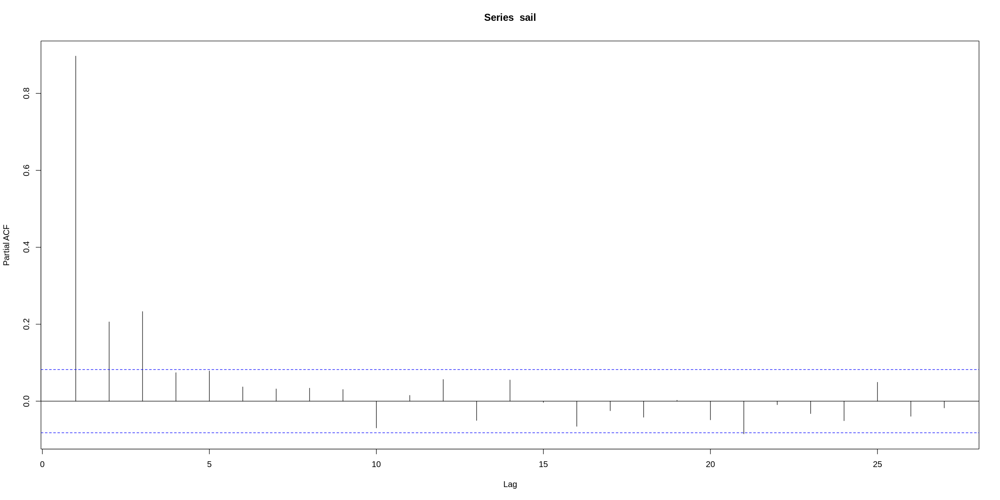

In [257]:
acf(sail)
pacf(sail)

In [12]:
train_partial <- sail_total %>% filter(date>='1999-01-01' & date<='2006-12-01' )
train_partial2 <- sail_total %>% filter(date>='2014-01-01' & date<='2020-02-01' )

t_train_p <- 1:NROW(train_partial)
n_train_p <- train_partial$TOTALSA

t_train_p2 <- 1:NROW(train_partial2)
n_train_p2 <- train_partial2$TOTALSA

In [10]:
t81<- 1:NROW(s81)
n81 <- s81$TOTALSA

t90<- 1:NROW(s90)
n90 <- s90$TOTALSA

t09<- 1:NROW(s09)
n09 <- s09$TOTALSA

t21<- 1:NROW(s21)
n21 <- s21$TOTALSA

t23<- 1:NROW(s23)
n23 <- s23$TOTALSA

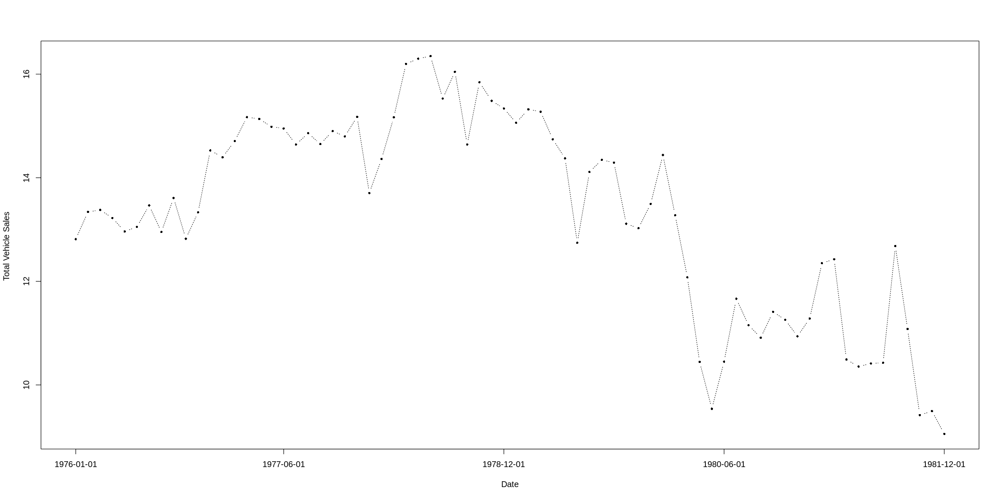

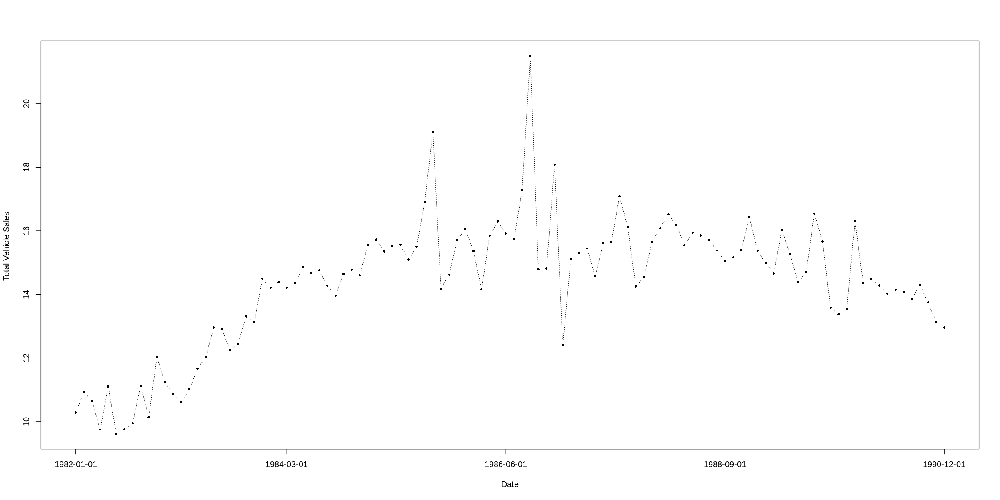

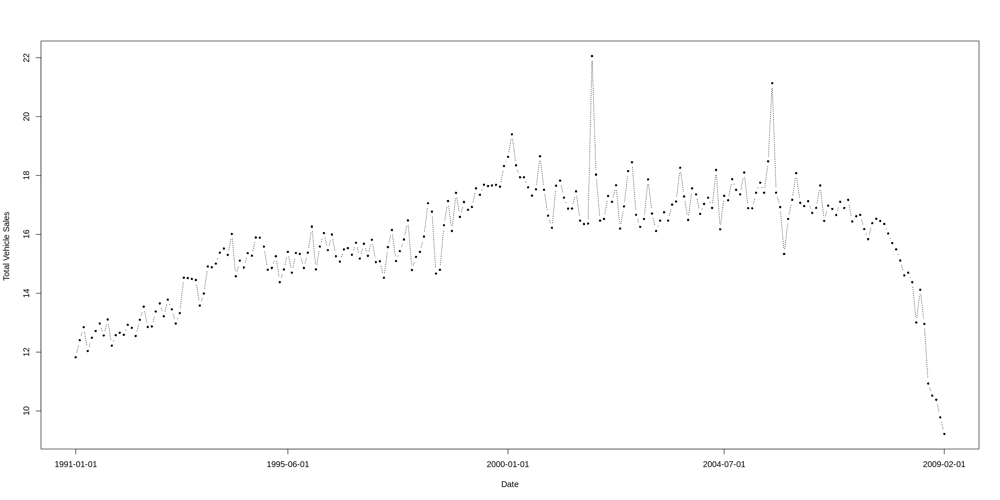

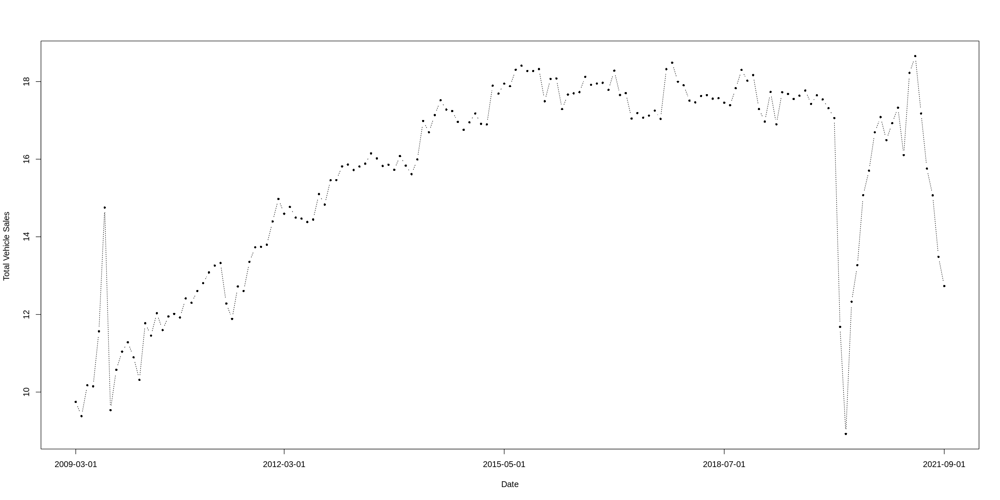

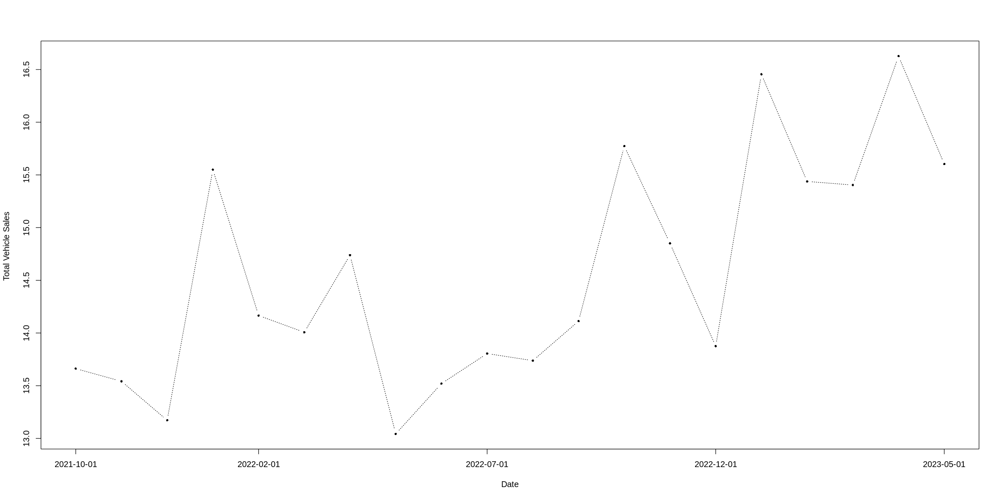

In [11]:
plot(n81, type= "b",xlab="Date", ylab="Total Vehicle Sales ",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1,as.integer(length(t81)/4), as.integer(length(t81)/2), as.integer(length(t81)*3/4), as.integer(length(t81))), labels=s81$DATE[c(1,as.integer(length(t81)/4), as.integer(length(t81)/2), as.integer(length(t81)*3/4), as.integer(length(t81)))])

plot(n90, type= "b",xlab="Date", ylab="Total Vehicle Sales ",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1,as.integer(length(t90)/4), as.integer(length(t90)/2), as.integer(length(t90)*3/4), as.integer(length(t90))), labels=s90$DATE[c(1,as.integer(length(t90)/4), as.integer(length(t90)/2), as.integer(length(t90)*3/4), as.integer(length(t90)))])

plot(n09, type= "b",xlab="Date", ylab="Total Vehicle Sales ",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1,as.integer(length(t09)/4), as.integer(length(t09)/2), as.integer(length(t09)*3/4), as.integer(length(t09))), labels=s09$DATE[c(1,as.integer(length(t09)/4), as.integer(length(t09)/2), as.integer(length(t09)*3/4), as.integer(length(t09)))])

plot(n21, type= "b",xlab="Date", ylab="Total Vehicle Sales ",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1,as.integer(length(t21)/4), as.integer(length(t21)/2), as.integer(length(t21)*3/4), as.integer(length(t21))), labels=s21$DATE[c(1,as.integer(length(t21)/4), as.integer(length(t21)/2), as.integer(length(t21)*3/4), as.integer(length(t21)))])

plot(n23, type= "b",xlab="Date", ylab="Total Vehicle Sales ",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1,as.integer(length(t23)/4), as.integer(length(t23)/2), as.integer(length(t23)*3/4), as.integer(length(t23))), labels=s23$DATE[c(1,as.integer(length(t23)/4), as.integer(length(t23)/2), as.integer(length(t23)*3/4), as.integer(length(t23)))])


#BM

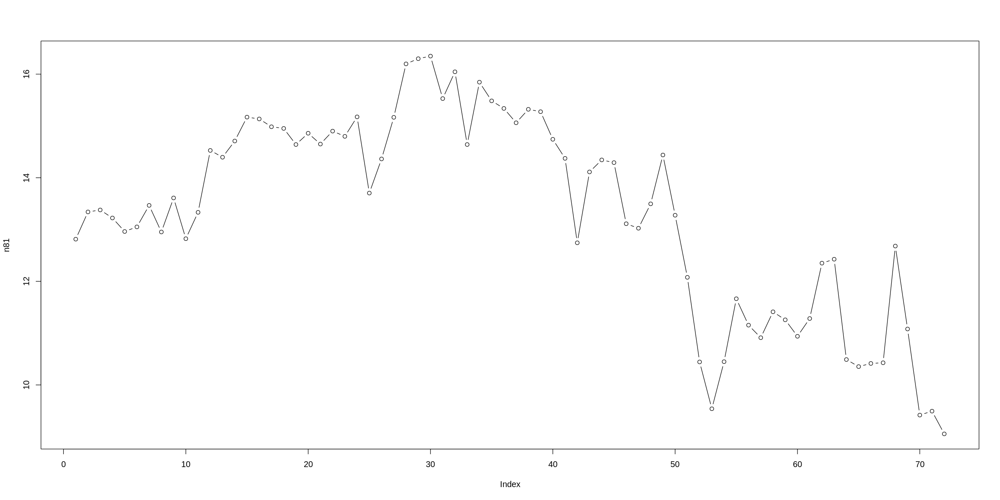

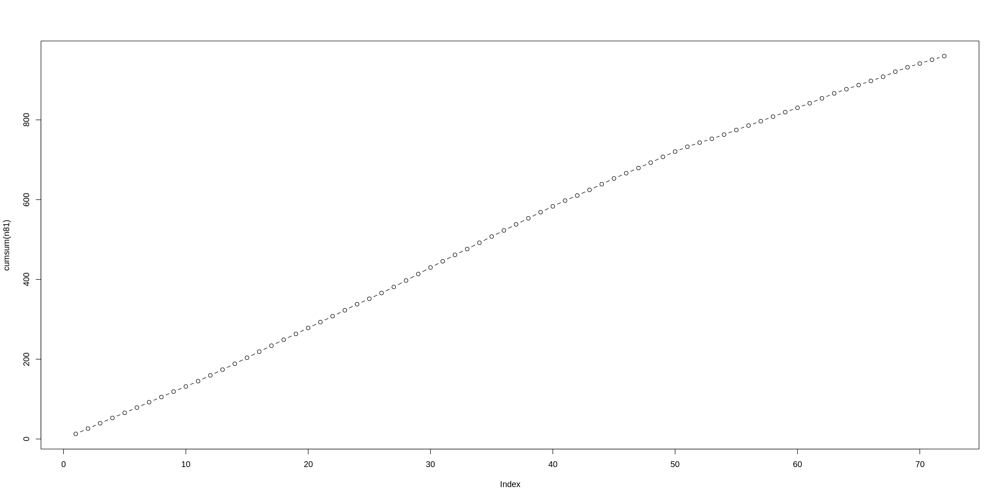

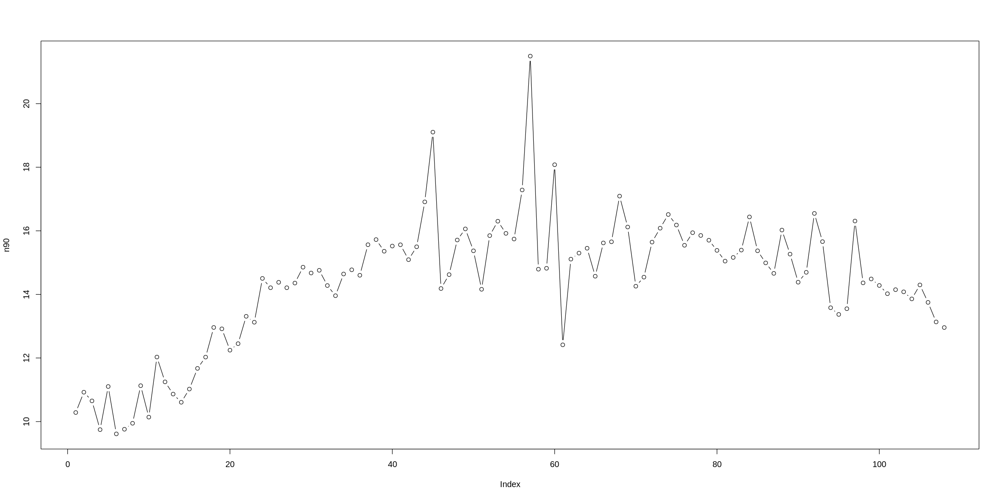

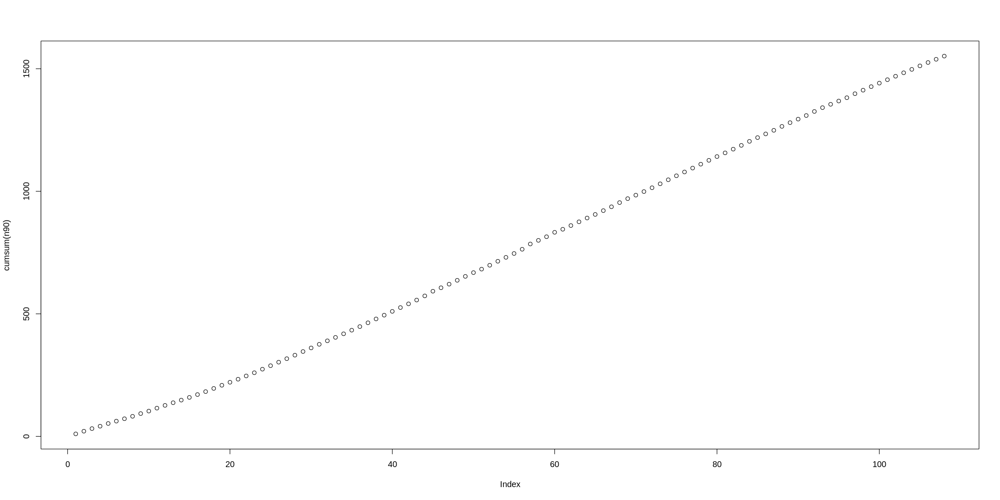

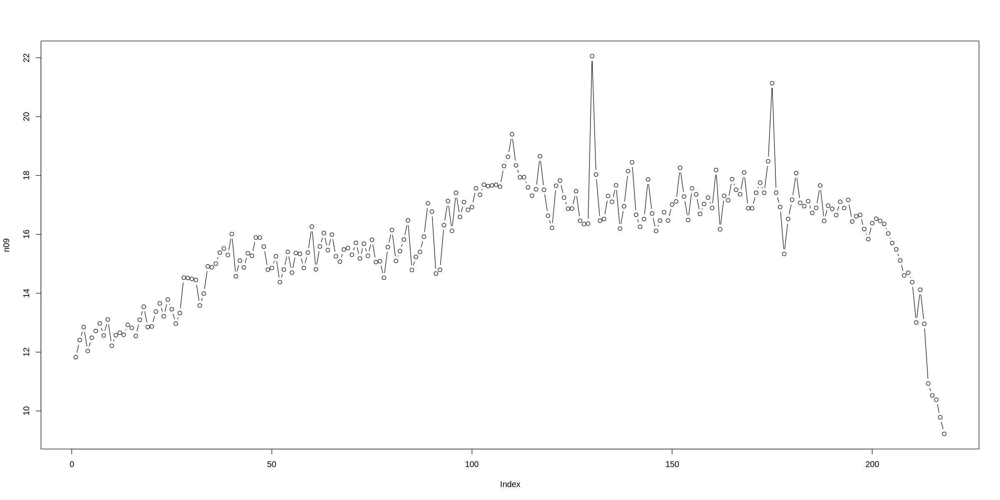

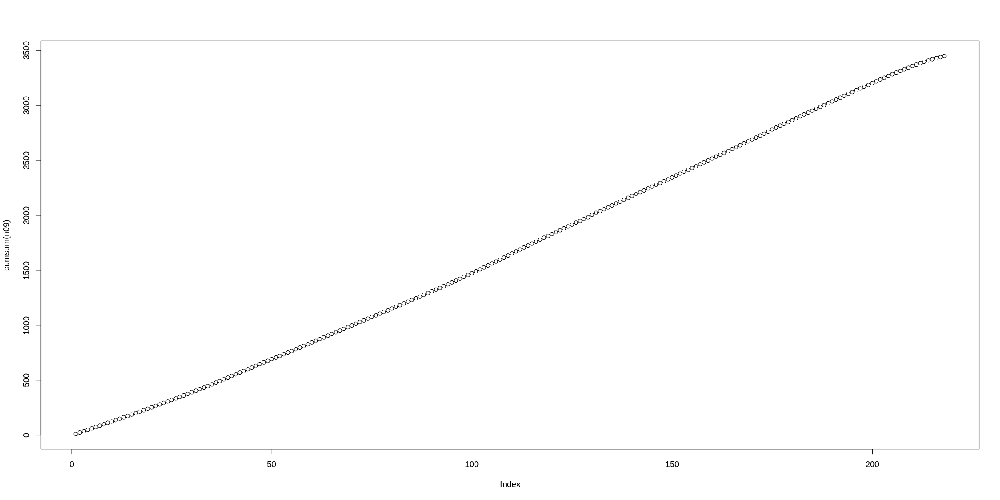

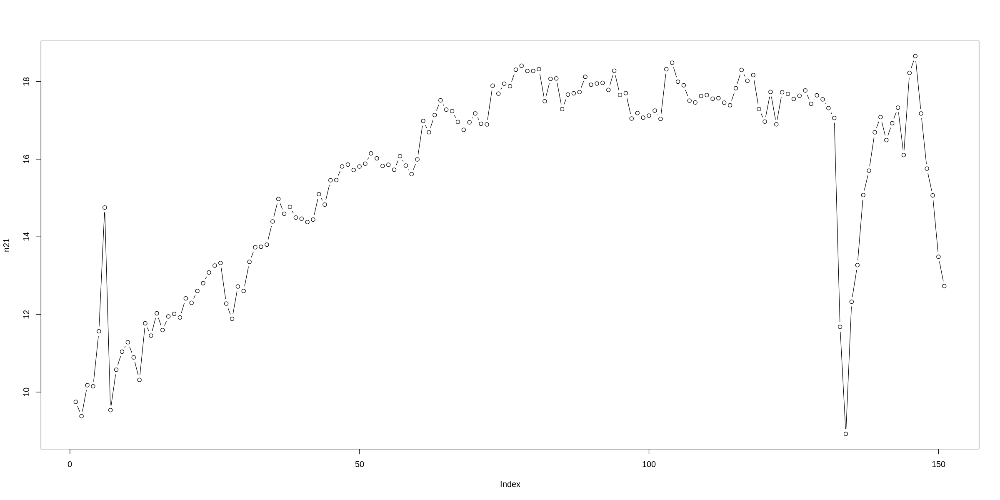

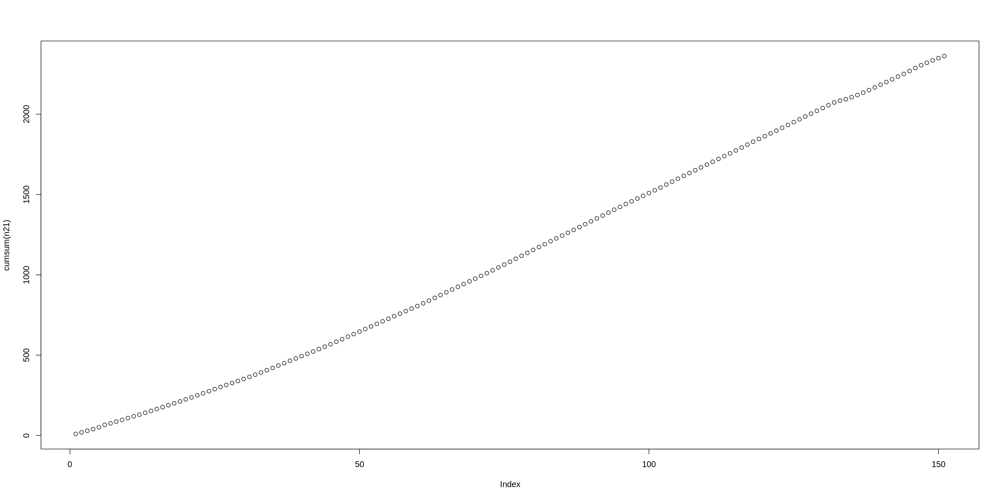

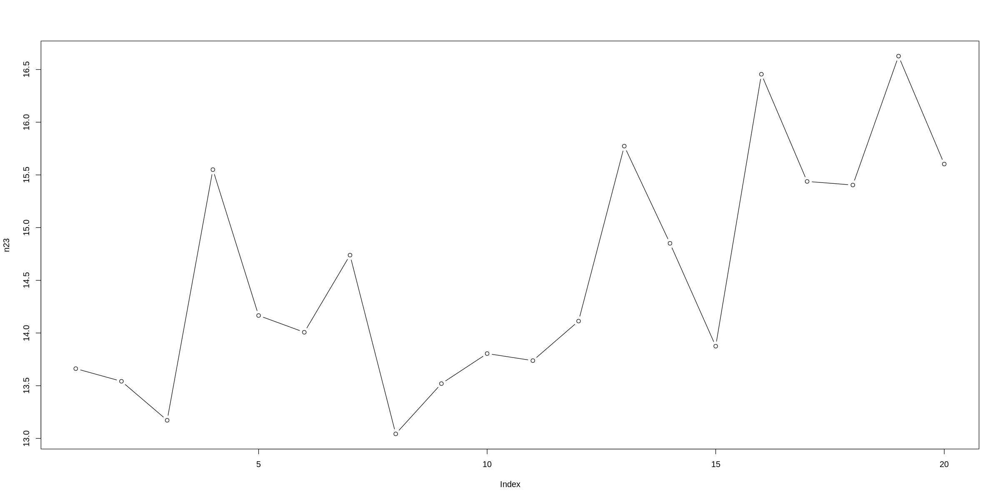

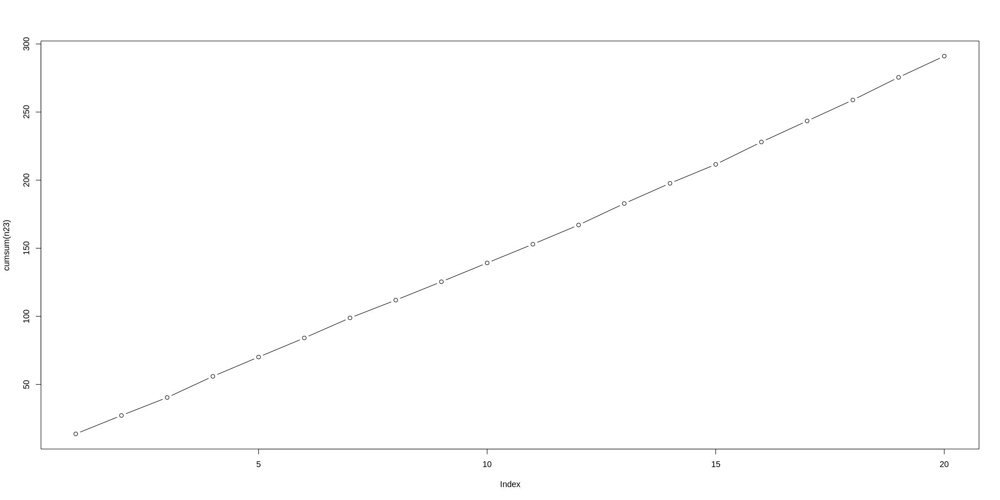

In [ ]:
###some simple plots
plot(n81, type="b")
plot(cumsum(n81), type="b")

plot(n90, type="b")
plot(cumsum(n90), type="b")

plot(n09, type="b")
plot(cumsum(n09), type="b")

plot(n21, type="b")
plot(cumsum(n21), type="b")

plot(n23, type="b")
plot(cumsum(n23), type="b")

##81

Call: ( Standard Bass Model )

  BM(series = n81, display = T)

Residuals:
     Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-6.16581 -1.71492  0.11601  0.01309  2.36501  5.90182 

Coefficients:
       Estimate    Std.Error        Lower        Upper  p-value    
m 1.248766e+03 1.000659e+01 1.229154e+03 1.268379e+03 5.23e-83 ***
p 9.919008e-03 4.580466e-05 9.829232e-03 1.000878e-02 1.76e-99 ***
q 2.505188e-02 5.389384e-04 2.399558e-02 2.610817e-02 8.19e-54 ***
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  2.99459  on  69  degrees of freedom
 Multiple R-squared:   0.999974  Residual sum of squares:  618.7622


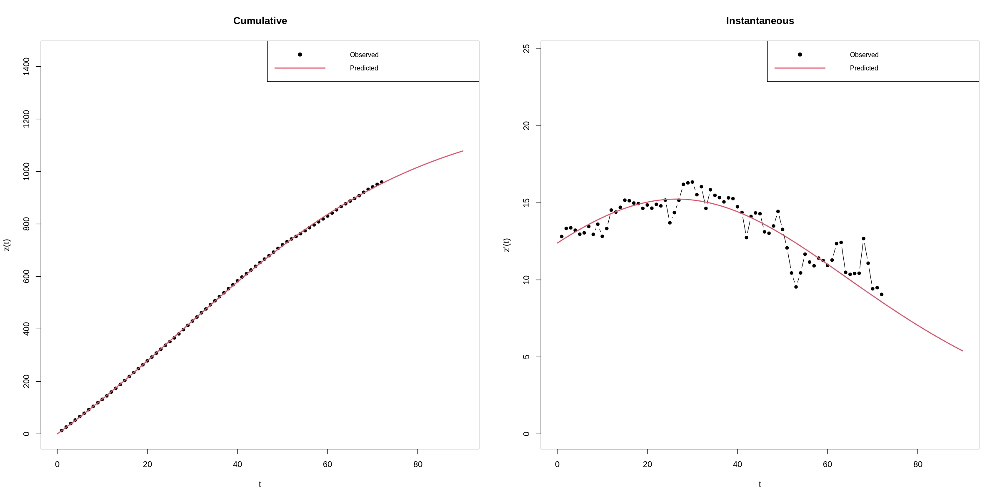

In [ ]:
###we estimate a simple Bass Model
bm81<-BM(n81,display = T)
summary(bm81)

In [ ]:
###prediction (out-of-sample)
pred_bm_81<- predict(bm81, newx=c(1:85))
pred.inst_81<- make.instantaneous(pred_bm_81)

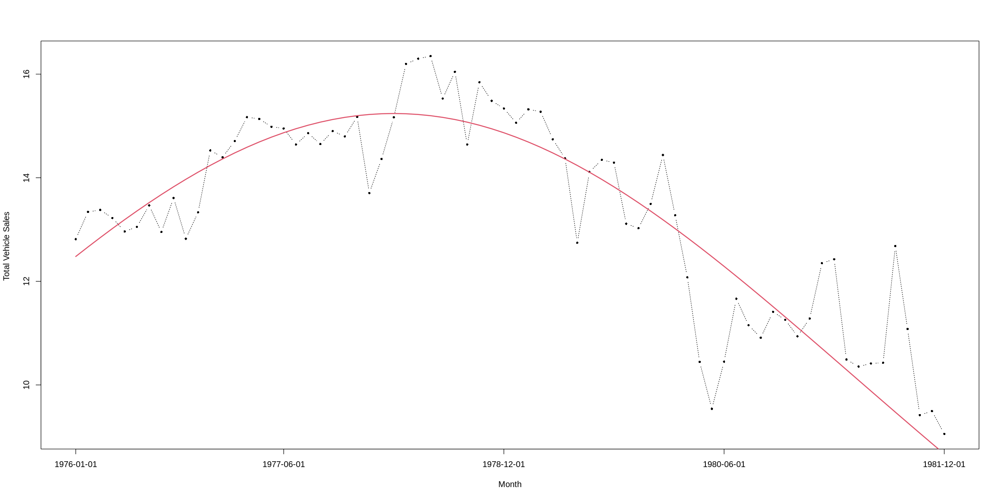

In [ ]:
###plot of fitted model
plot(n81, type= "b",xlab="Month", ylab="Total Vehicle Sales ",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1,as.integer(length(t81)/4), as.integer(length(t81)/2), as.integer(length(t81)*3/4), as.integer(length(t81))), labels=s81$DATE[c(1,as.integer(length(t81)/4), as.integer(length(t81)/2), as.integer(length(t81)*3/4), as.integer(length(t81)))])
lines(pred.inst_81, lwd=2, col=2)

Call: ( Standard Bass Model )

  BM(series = n81[1:38], display = T)

Residuals:
     Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-2.06561 -0.53132  0.45030  0.05265  0.71955  1.26671 

Coefficients:
       Estimate    Std.Error        Lower        Upper  p-value    
m 1.763876e+03 1.414858e+02 1.486569e+03 2.041183e+03 1.97e-14 ***
p 7.156021e-03 5.416224e-04 6.094460e-03 8.217581e-03 3.65e-15 ***
q 1.821721e-02 1.296505e-03 1.567610e-02 2.075831e-02 5.91e-16 ***
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  0.992427  on  35  degrees of freedom
 Multiple R-squared:   0.99999  Residual sum of squares:  34.47189


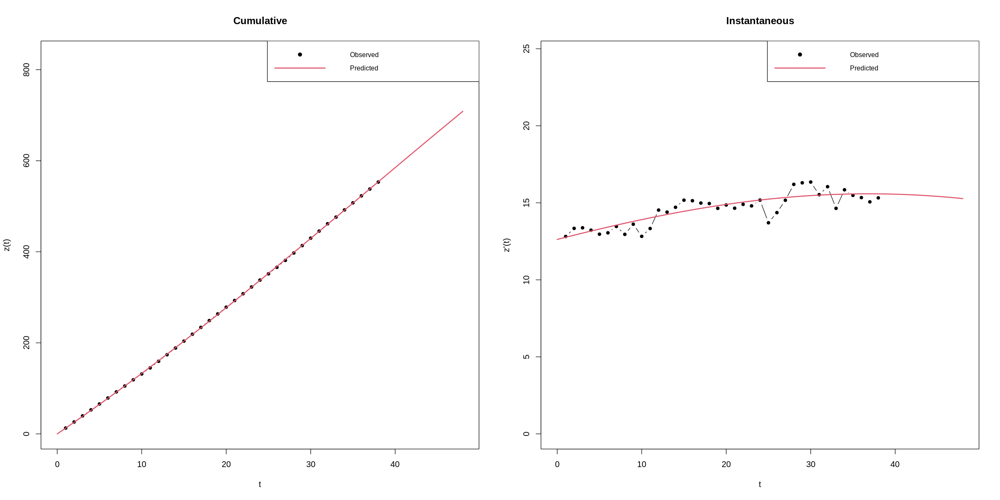

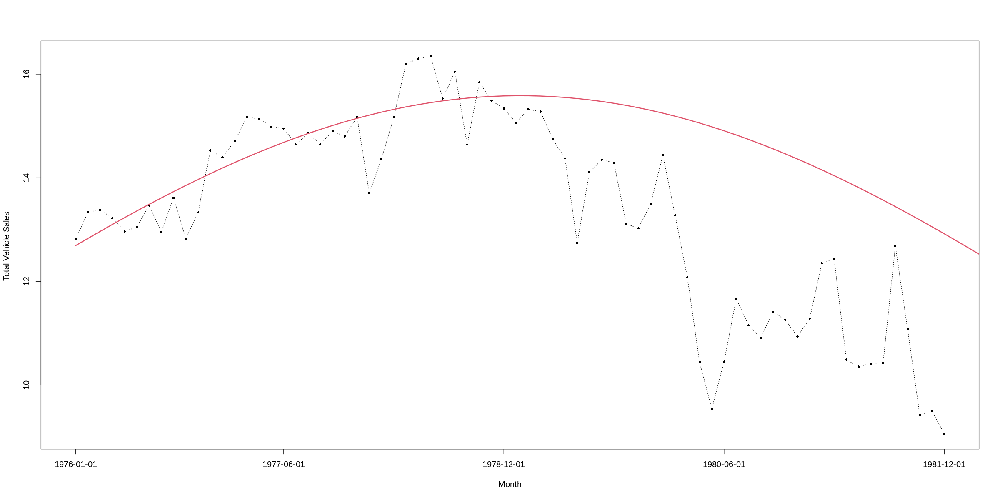

In [ ]:
###we estimate the model with 50% of the data
bm_8150<-BM(n81[1:38],display = T)
summary(bm_8150)

pred_bm_8150<- predict(bm_8150, newx=c(1:85))
pred.inst_8150<- make.instantaneous(pred_bm_8150)

plot(n81, type= "b",xlab="Month", ylab="Total Vehicle Sales ",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1,as.integer(length(t81)/4), as.integer(length(t81)/2), as.integer(length(t81)*3/4), as.integer(length(t81))), labels=s81$DATE[c(1,as.integer(length(t81)/4), as.integer(length(t81)/2), as.integer(length(t81)*3/4), as.integer(length(t81)))])
lines(pred.inst_8150, lwd=2, col=2)

Call: ( Standard Bass Model )

  BM(series = n81[1:19], display = T)

Residuals:
    Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-1.5628 -0.3596  0.3025  0.1763  0.7841  1.3451 

Coefficients:
       Estimate    Std.Error         Lower        Upper p-value  
m 3.698012e+03 1.276924e+04 -2.132923e+04 2.872526e+04   0.776  
p 3.403471e-03 1.195435e-02 -2.002663e-02 2.683358e-02   0.780  
q 1.396836e-02 1.611534e-02 -1.761713e-02 4.555385e-02   0.399  
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  0.930375  on  16  degrees of freedom
 Multiple R-squared:   0.999964  Residual sum of squares:  13.84956


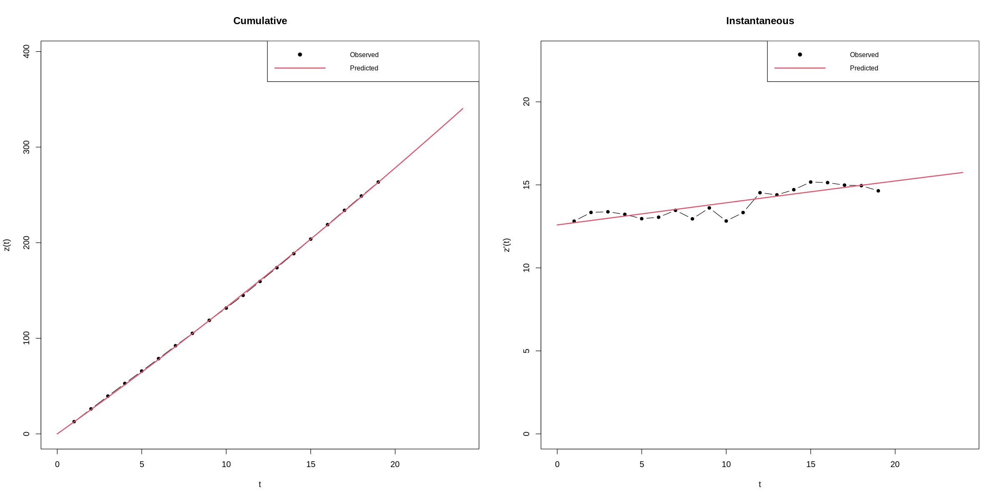

In [ ]:
###we estimate the model with 25% of the data
bm_8175<-BM(n81[1:19],display = T)
summary(bm_8175)

pred_bm_8175<- predict(bm_8175, newx=c(1:85))
pred.inst_8175<- make.instantaneous(pred_bm_8175)

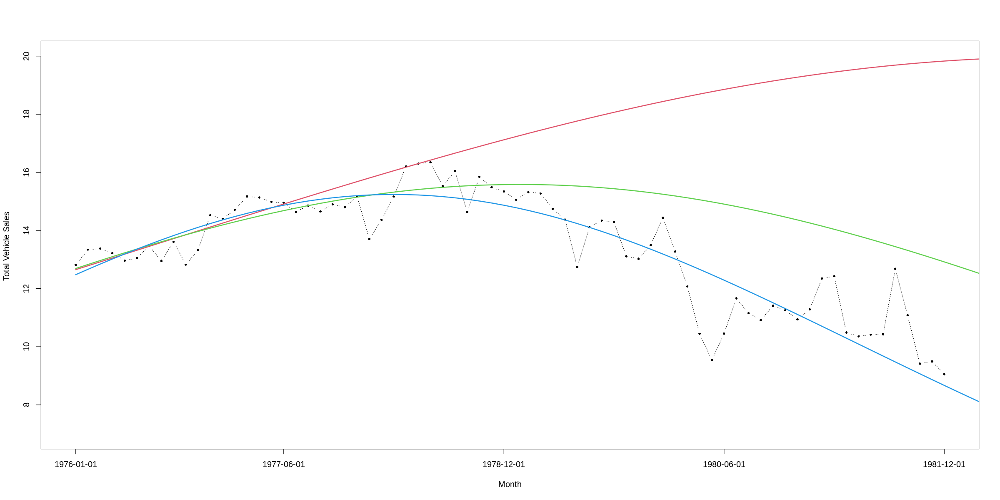

In [ ]:
###Comparison between models (instantaneous)
###instantaneous
plot(n81, type= "b",xlab="Month", ylab="Total Vehicle Sales ",  pch=16, lty=3, xaxt="n", cex=0.6, ylim=c(7,20))
axis(1, at=c(1,as.integer(length(t81)/4), as.integer(length(t81)/2), as.integer(length(t81)*3/4), as.integer(length(t81))), labels=s81$DATE[c(1,as.integer(length(t81)/4), as.integer(length(t81)/2), as.integer(length(t81)*3/4), as.integer(length(t81)))])
lines(pred.inst_8175, lwd=2, col=2)
lines(pred.inst_8150, lwd=2, col=3)
lines(pred.inst_81, lwd=2, col=4)

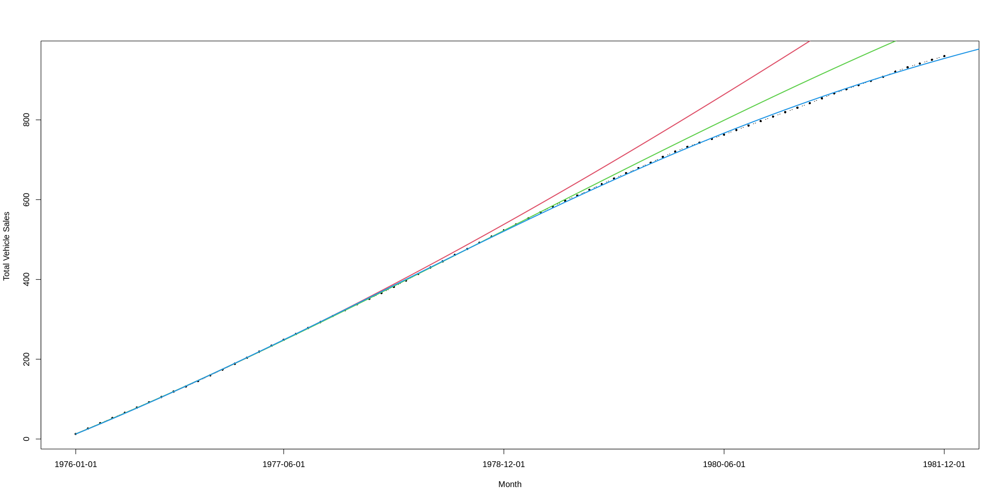

In [ ]:
###Comparison between models (cumulative)
plot(cumsum(n81), type= "b",xlab="Month", ylab="Total Vehicle Sales ",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1,as.integer(length(t81)/4), as.integer(length(t81)/2), as.integer(length(t81)*3/4), as.integer(length(t81))), labels=s81$DATE[c(1,as.integer(length(t81)/4), as.integer(length(t81)/2), as.integer(length(t81)*3/4), as.integer(length(t81)))])
lines(pred_bm_8175, lwd=2, col=2)
lines(pred_bm_8150, lwd=2, col=3)
lines(pred_bm_81, lwd=2, col=4)

##90

Call: ( Standard Bass Model )

  BM(series = n90, display = T)

Residuals:
    Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-7.1011 -3.4764 -0.5549 -0.4379  2.3905  9.5097 

Coefficients:
       Estimate    Std.Error        Lower        Upper   p-value    
m 2.288568e+03 1.791620e+01 2.253453e+03 2.323683e+03 4.95e-117 ***
p 4.347862e-03 2.029334e-05 4.308088e-03 4.387636e-03 1.60e-140 ***
q 1.866788e-02 2.338900e-04 1.820947e-02 1.912630e-02  8.22e-96 ***
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  4.005173  on  105  degrees of freedom
 Multiple R-squared:   0.99998  Residual sum of squares:  1684.348


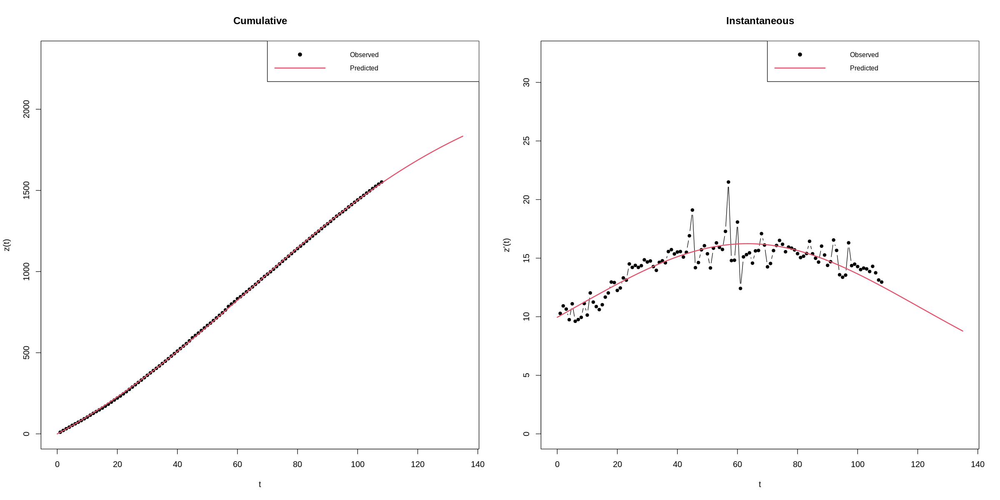

In [ ]:
###we estimate a simple Bass Model
bm90<-BM(n90,display = T)
summary(bm90)

In [ ]:
###prediction (out-of-sample)
pred_bm_90<- predict(bm90, newx=c(1:120))
pred.inst_90<- make.instantaneous(pred_bm_90)

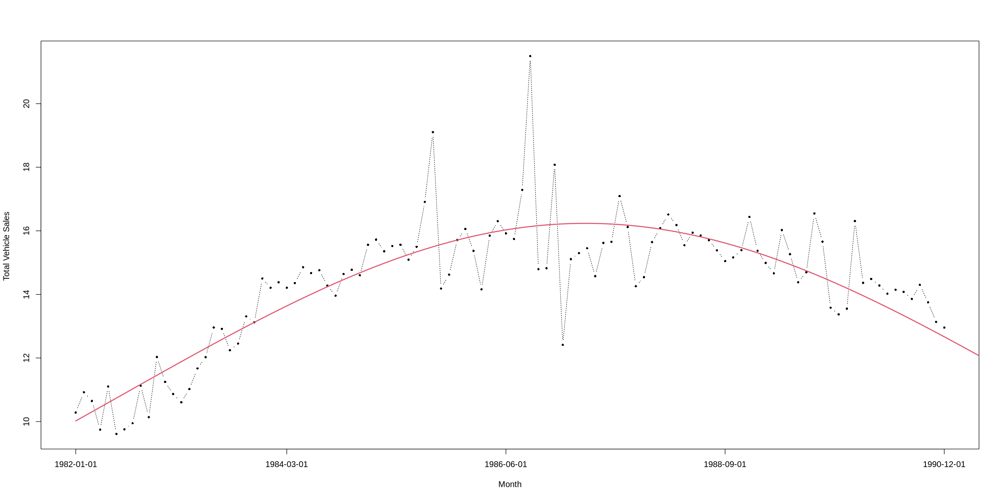

In [ ]:
###plot of fitted model
plot(n90, type= "b",xlab="Month", ylab="Total Vehicle Sales ",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1,as.integer(length(t90)/4), as.integer(length(t90)/2), as.integer(length(t90)*3/4), as.integer(length(t90))), labels=s90$DATE[c(1,as.integer(length(t90)/4), as.integer(length(t90)/2), as.integer(length(t90)*3/4), as.integer(length(t90)))])
lines(pred.inst_90, lwd=2, col=2)

Call: ( Standard Bass Model )

  BM(series = n90[1:55], display = T)

Residuals:
     Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-2.38856 -0.86448 -0.04991  0.29871  1.12068  3.96326 

Coefficients:
       Estimate    Std.Error        Lower        Upper  p-value    
m 1.718895e+03 5.261869e+01 1.615765e+03 1.822026e+03 2.49e-36 ***
p 5.404860e-03 1.398070e-04 5.130844e-03 5.678877e-03 5.52e-40 ***
q 2.500551e-02 6.476842e-04 2.373608e-02 2.627495e-02 5.90e-40 ***
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  1.642834  on  52  degrees of freedom
 Multiple R-squared:   0.999984  Residual sum of squares:  140.343


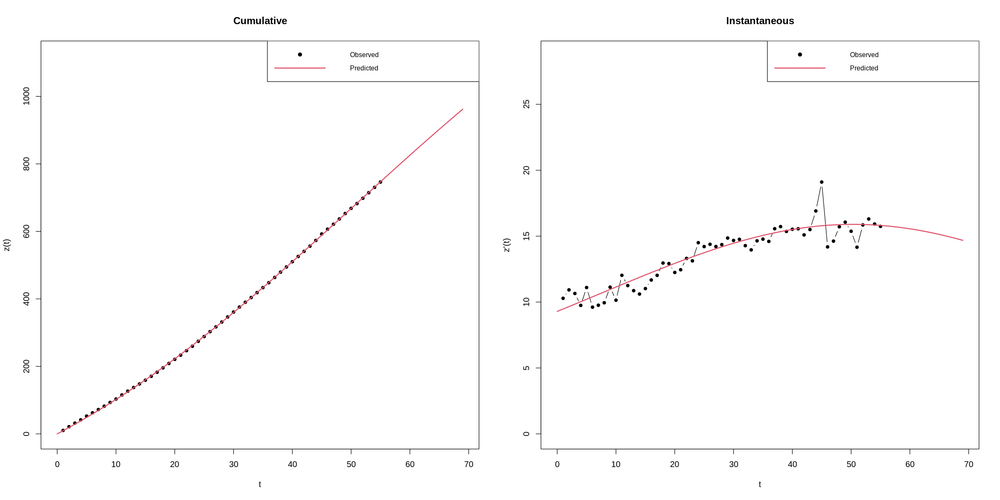

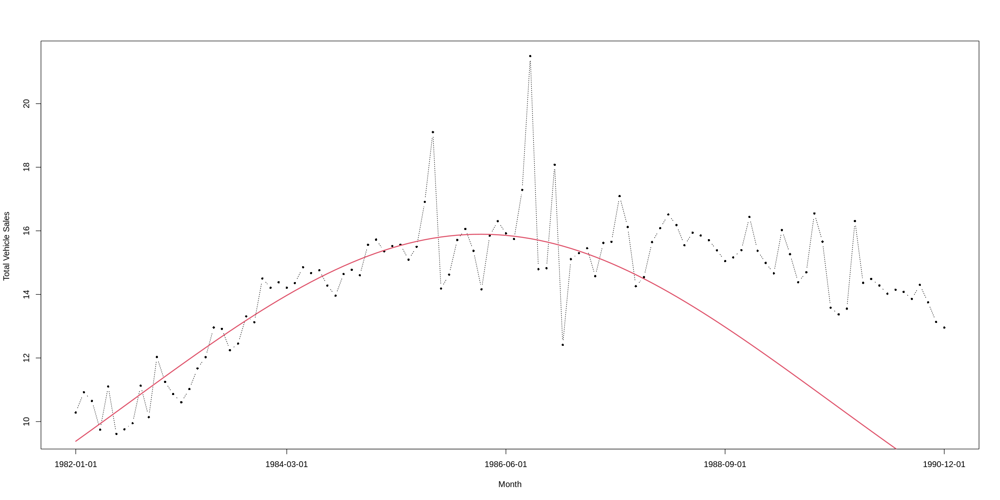

In [ ]:
###we estimate the model with 50% of the data
bm_9050<-BM(n90[1:55],display = T)
summary(bm_9050)

pred_bm_9050<- predict(bm_9050, newx=c(1:120))
pred.inst_9050<- make.instantaneous(pred_bm_9050)

plot(n90, type= "b",xlab="Month", ylab="Total Vehicle Sales ",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1,as.integer(length(t90)/4), as.integer(length(t90)/2), as.integer(length(t90)*3/4), as.integer(length(t90))), labels=s90$DATE[c(1,as.integer(length(t90)/4), as.integer(length(t90)/2), as.integer(length(t90)*3/4), as.integer(length(t90)))])
lines(pred.inst_9050, lwd=2, col=2)

Call: ( Standard Bass Model )

  BM(series = n90[1:27], display = T)

Residuals:
    Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-1.8184 -0.9772  0.6176  0.3860  1.5534  2.9444 

Coefficients:
       Estimate    Std.Error         Lower        Upper p-value  
m 5.795991e+03 2.146569e+04 -3.627600e+04 4.786798e+04   0.789  
p 1.655845e-03 6.262065e-03 -1.061758e-02 1.392927e-02   0.794  
q 1.622402e-02 9.611034e-03 -2.613257e-03 3.506130e-02   0.104  
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  1.526541  on  24  degrees of freedom
 Multiple R-squared:   0.999927  Residual sum of squares:  55.92785


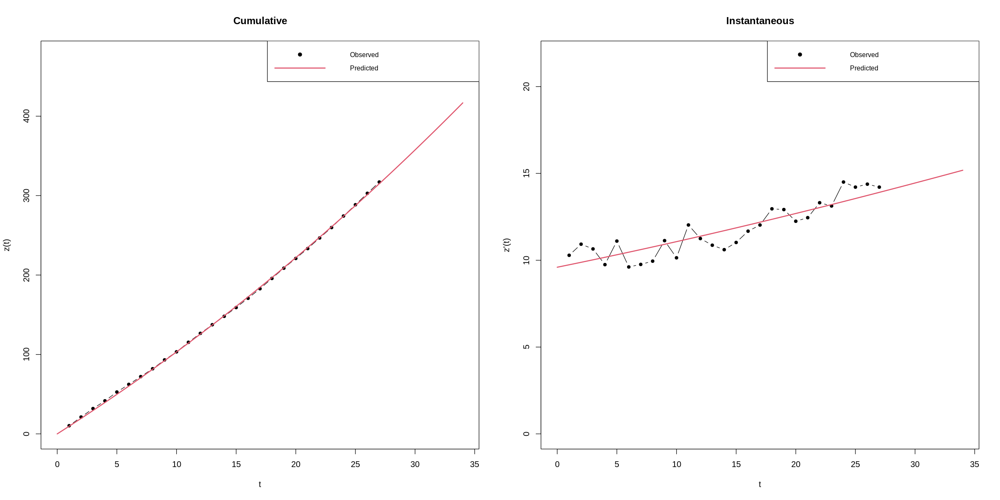

In [ ]:
###we estimate the model with 25% of the data
bm_9075<-BM(n90[1:27],display = T)
summary(bm_9075)

pred_bm_9075<- predict(bm_9075, newx=c(1:120))
pred.inst_9075<- make.instantaneous(pred_bm_9075)

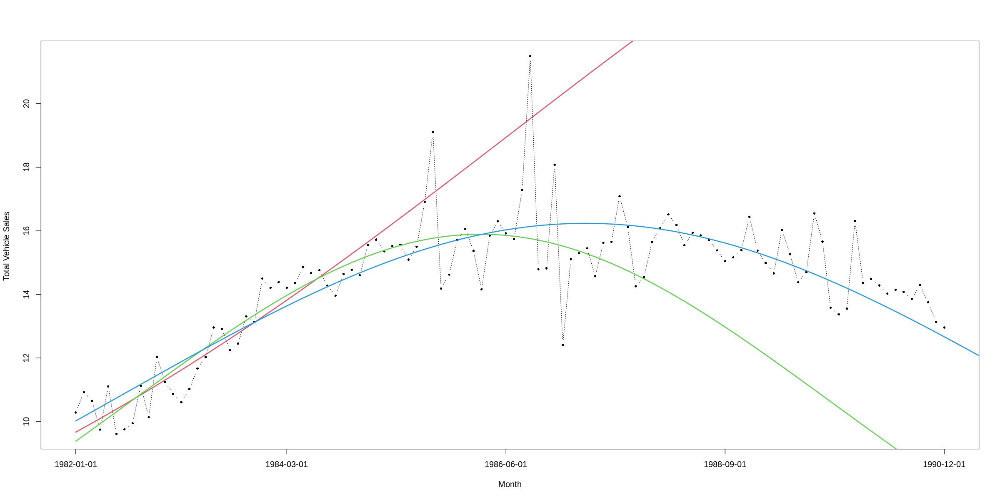

In [ ]:
###Comparison between models (instantaneous)
###instantaneous
plot(n90, type= "b",xlab="Month", ylab="Total Vehicle Sales ",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1,as.integer(length(t90)/4), as.integer(length(t90)/2), as.integer(length(t90)*3/4), as.integer(length(t90))), labels=s90$DATE[c(1,as.integer(length(t90)/4), as.integer(length(t90)/2), as.integer(length(t90)*3/4), as.integer(length(t90)))])
lines(pred.inst_9075, lwd=2, col=2)
lines(pred.inst_9050, lwd=2, col=3)
lines(pred.inst_90, lwd=2, col=4)

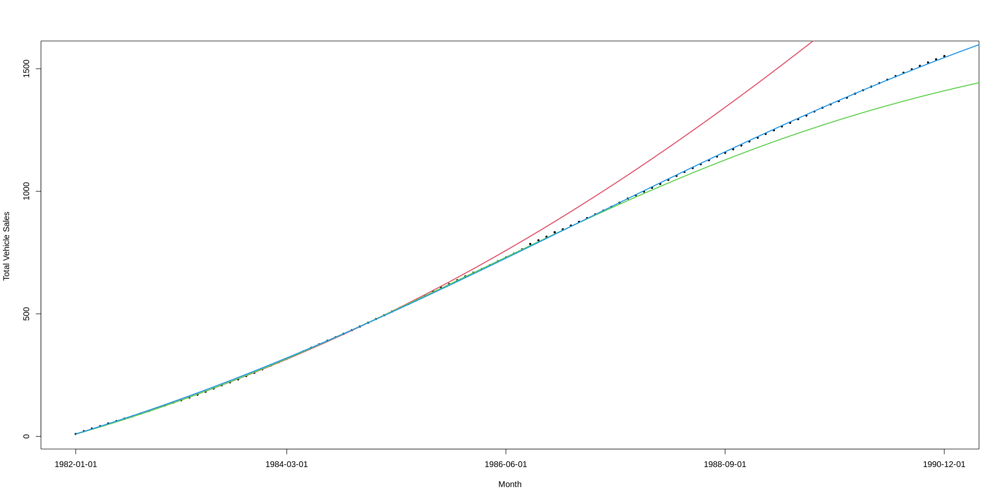

In [ ]:
###Comparison between models (cumulative)
plot(cumsum(n90), type= "b",xlab="Month", ylab="Total Vehicle Sales ",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1,as.integer(length(t90)/4), as.integer(length(t90)/2), as.integer(length(t90)*3/4), as.integer(length(t90))), labels=s90$DATE[c(1,as.integer(length(t90)/4), as.integer(length(t90)/2), as.integer(length(t90)*3/4), as.integer(length(t90)))])
lines(pred_bm_9075, lwd=2, col=2)
lines(pred_bm_9050, lwd=2, col=3)
lines(pred_bm_90, lwd=2, col=4)

##09

Call: ( Standard Bass Model )

  BM(series = n09, display = T)

Residuals:
      Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
-32.73291  -3.49689   0.31432   0.05009   4.46038   8.67723 

Coefficients:
       Estimate    Std.Error        Lower        Upper   p-value    
m 6.183754e+03 4.507212e+01 6.095414e+03 6.272093e+03 2.60e-211 ***
p 1.986280e-03 1.088388e-05 1.964948e-03 2.007612e-03 1.01e-237 ***
q 6.688124e-03 6.522278e-05 6.560290e-03 6.815959e-03 1.54e-184 ***
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  6.279243  on  215  degrees of freedom
 Multiple R-squared:   0.99999  Residual sum of squares:  8477.212


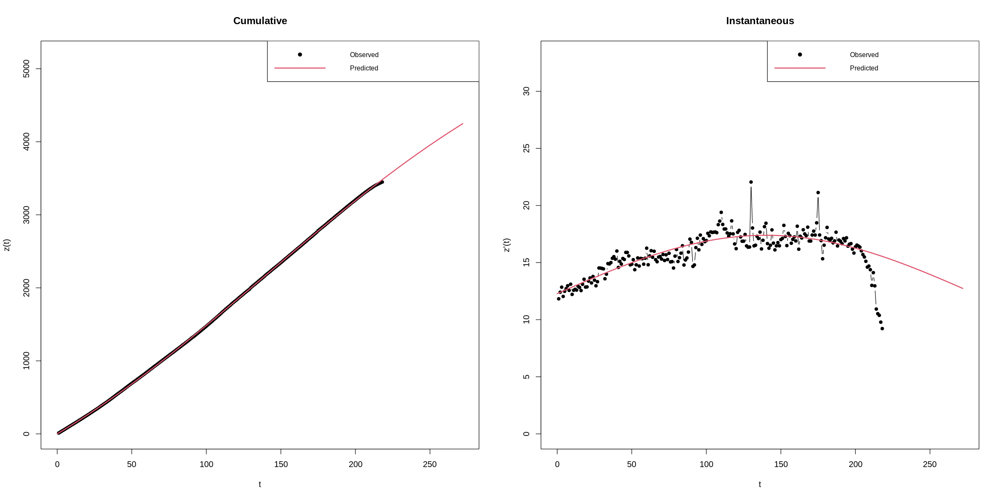

In [165]:
###we estimate a simple Bass Model
bm09<-BM(n09,display = T)
summary(bm09)

In [166]:
###prediction (out-of-sample)
pred_bm_09<- predict(bm09, newx=c(1:250))
pred.inst_09<- make.instantaneous(pred_bm_09)

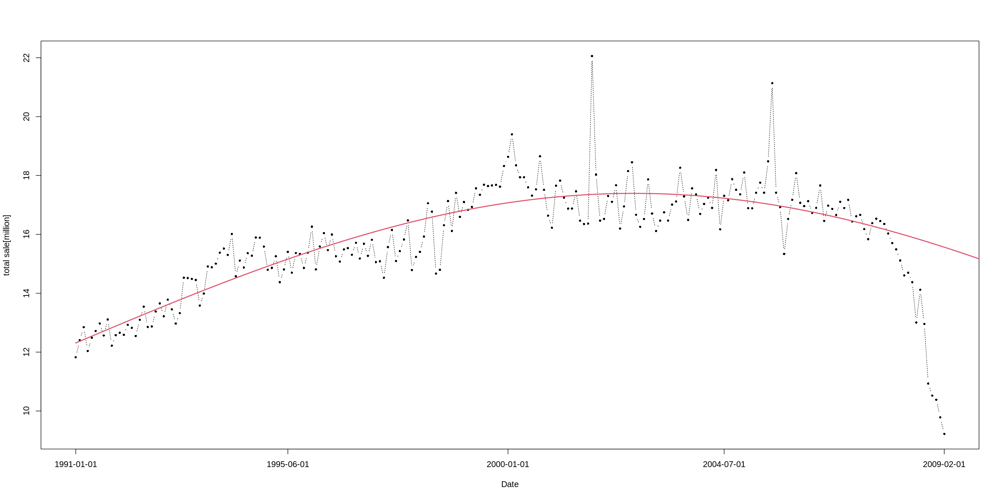

In [167]:
###plot of fitted model


plot(n09, type= "b",ylab="total sale[million]", xlab="Date",  pch=16, lty=3, xaxt="n", cex=0.6)
lines(pred.inst_09, lwd=2, col=2)axis(1, at=c(1,as.integer(length(t09)/4), as.integer(length(t09)/2), as.integer(length(t09)*3/4), as.integer(length(t09))), labels=s09$DATE[c(1,as.integer(length(t09)/4), as.integer(length(t09)/2), as.integer(length(t09)*3/4), as.integer(length(t09)))])


In [169]:
rmse(n09,fitted(bm09))

[1] 1960.45

Call: ( Standard Bass Model )

  BM(series = n09[1:112], display = T)

Residuals:
    Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-8.3081 -4.6142 -0.7490 -0.3919  4.1682 13.0940 

Coefficients:
       Estimate    Std.Error        Lower        Upper  p-value    
m 5.144733e+03 3.320923e+02 4.493844e+03 5.795622e+03 2.62e-29 ***
p 2.396423e-03 1.445400e-04 2.113130e-03 2.679717e-03 1.43e-31 ***
q 7.259925e-03 3.812454e-04 6.512698e-03 8.007152e-03 1.85e-36 ***
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  4.725979  on  109  degrees of freedom
 Multiple R-squared:   0.999975  Residual sum of squares:  2434.502


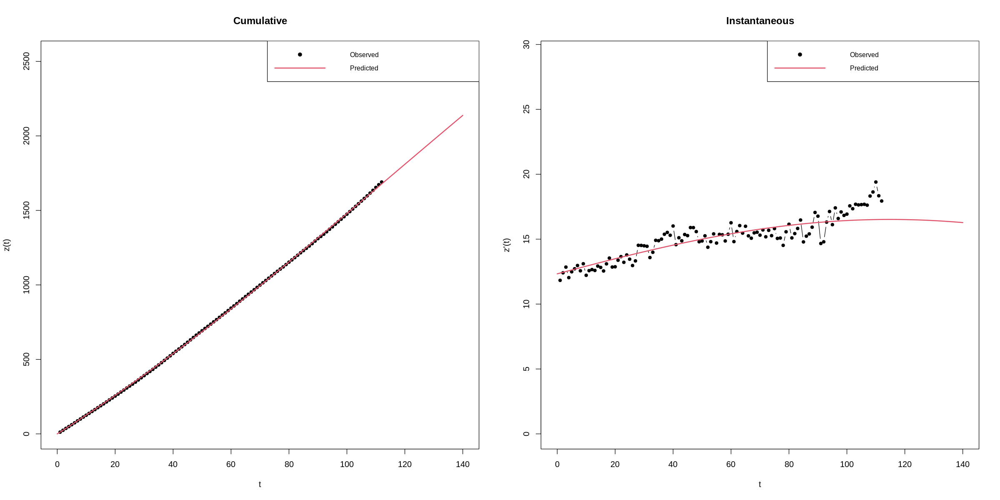

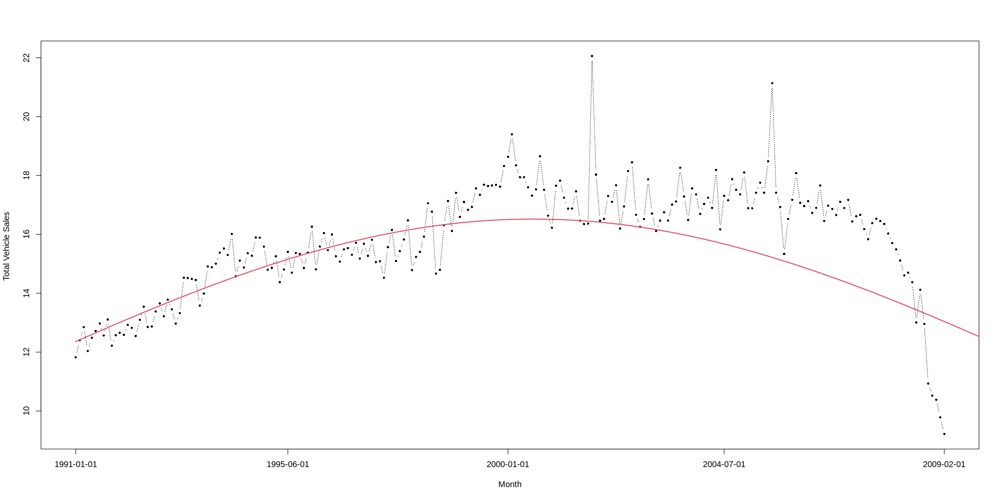

In [123]:
###we estimate the model with 50% of the data
bm_0950<-BM(n09[1:112],display = T)
summary(bm_0950)

pred_bm_0950<- predict(bm_0950, newx=c(1:250))
pred.inst_0950<- make.instantaneous(pred_bm_0950)

plot(n09, type= "b",xlab="Month", ylab="Total Vehicle Sales ",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1,as.integer(length(t09)/4), as.integer(length(t09)/2), as.integer(length(t09)*3/4), as.integer(length(t09))), labels=s09$DATE[c(1,as.integer(length(t09)/4), as.integer(length(t09)/2), as.integer(length(t09)*3/4), as.integer(length(t09)))])
lines(pred.inst_0950, lwd=2, col=2)

Call: ( Standard Bass Model )

  BM(series = n09[1:57], display = T)

Residuals:
    Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-2.9978 -1.2198  0.4866  0.1859  1.4805  3.0114 

Coefficients:
       Estimate    Std.Error        Lower        Upper  p-value    
m 4.269623e+03 8.851855e+02 2.534691e+03 6004.5548562 1.19e-05 ***
p 2.788181e-03 5.654796e-04 1.679861e-03    0.0038965 8.19e-06 ***
q 9.573819e-03 1.056796e-03 7.502537e-03    0.0116451 2.00e-12 ***
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  1.699644  on  54  degrees of freedom
 Multiple R-squared:   0.999986  Residual sum of squares:  155.9946


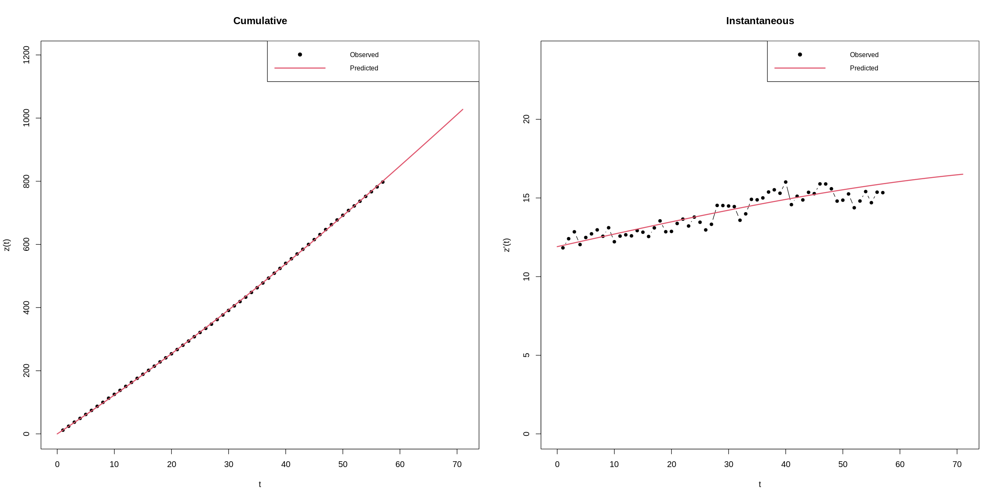

In [124]:
###we estimate the model with 25% of the data
bm_0975<-BM(n09[1:57],display = T)
summary(bm_0975)

pred_bm_0975<- predict(bm_0975, newx=c(1:250))
pred.inst_0975<- make.instantaneous(pred_bm_0975)

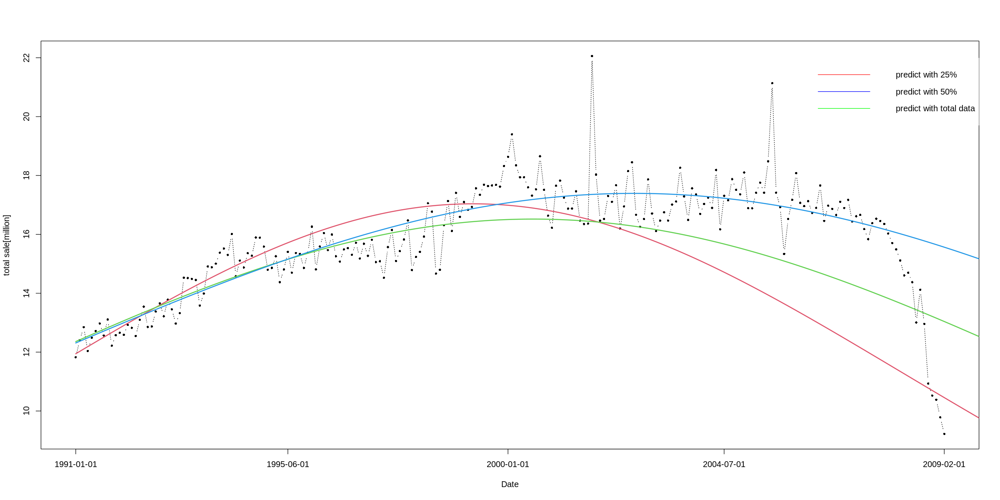

In [131]:
###Comparison between models (instantaneous)
###instantaneous
plot(n09, type= "b",ylab="total sale[million]", xlab="Date",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1,as.integer(length(t09)/4), as.integer(length(t09)/2), as.integer(length(t09)*3/4), as.integer(length(t09))), labels=s09$DATE[c(1,as.integer(length(t09)/4), as.integer(length(t09)/2), as.integer(length(t09)*3/4), as.integer(length(t09)))])
legend(180, 22, legend=c("predict with 25%", "predict with 50%","predict with total data"),
       col=c('red', 'blue','green'), lty=1, cex=1,box.lty=0)
lines(pred.inst_0975, lwd=2, col=2)
lines(pred.inst_0950, lwd=2, col=3)
lines(pred.inst_09, lwd=2, col=4)


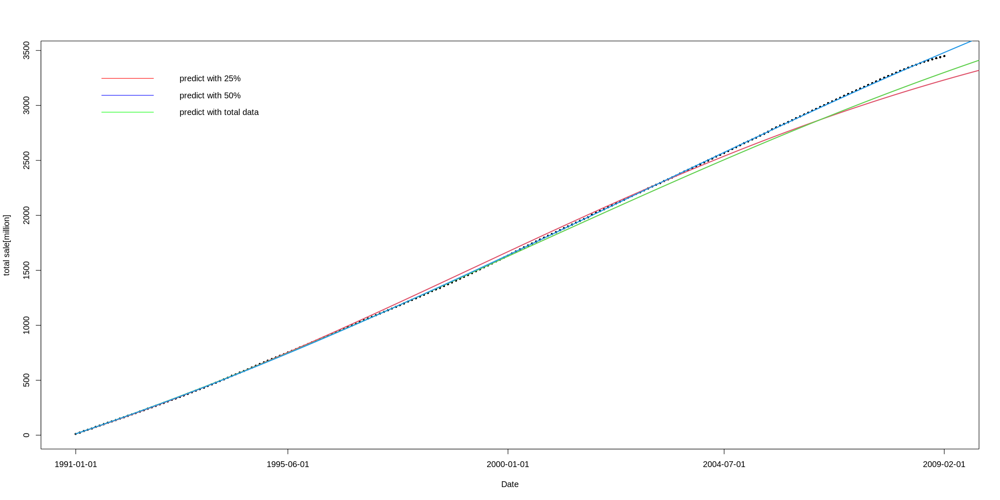

In [140]:
###Comparison between models (cumulative)
plot(cumsum(n09), type= "b",ylab="total sale[million]", xlab="Date",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1,as.integer(length(t09)/4), as.integer(length(t09)/2), as.integer(length(t09)*3/4), as.integer(length(t09))), labels=s09$DATE[c(1,as.integer(length(t09)/4), as.integer(length(t09)/2), as.integer(length(t09)*3/4), as.integer(length(t09)))])
legend(1, 3400, legend=c("predict with 25%", "predict with 50%","predict with total data"),
       col=c('red', 'blue','green'), lty=1, cex=1,box.lty=0)
lines(pred_bm_0975, lwd=2, col=2)
lines(pred_bm_0950, lwd=2, col=3)
lines(pred_bm_09, lwd=2, col=4)

##21

Call: ( Standard Bass Model )

  BM(series = n21, display = T)

Residuals:
       Min.    1st Qu.     Median       Mean    3rd Qu.       Max. 
-10.559506  -1.567198  -0.055240   0.000858   1.818619   8.536650 

Coefficients:
       Estimate    Std.Error        Lower        Upper   p-value    
m 3.529995e+03 1.249816e+01 3.505499e+03 3.554491e+03 4.16e-204 ***
p 2.847066e-03 5.974985e-06 2.835355e-03 2.858777e-03 1.10e-237 ***
q 1.412257e-02 7.347655e-05 1.397856e-02 1.426658e-02 1.95e-179 ***
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  3.224022  on  148  degrees of freedom
 Multiple R-squared:   0.999994  Residual sum of squares:  1538.359


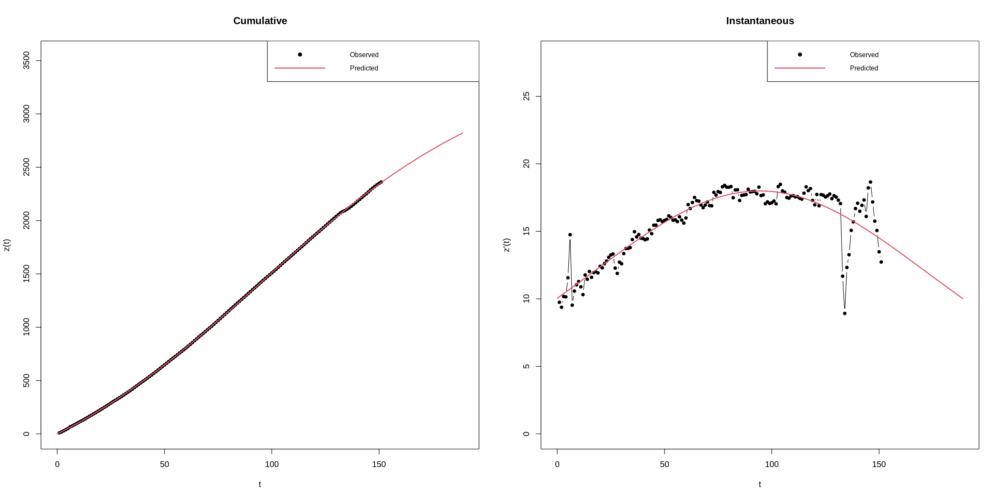

In [170]:
###we estimate a simple Bass Model
bm21<-BM(n21,display = T)
summary(bm21)

In [171]:
###prediction (out-of-sample)
pred_bm_21<- predict(bm21, newx=c(1:160))
pred.inst_21<- make.instantaneous(pred_bm_21)

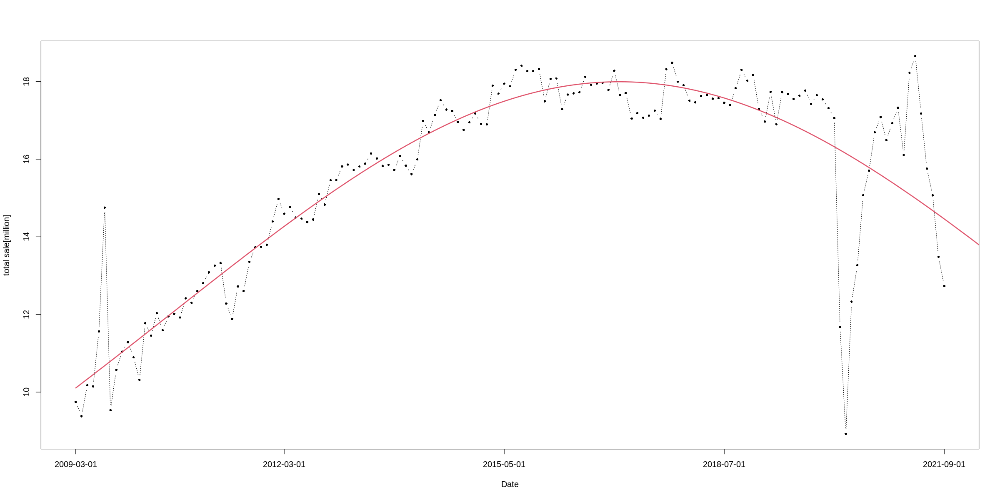

In [172]:
###plot of fitted model
plot(n21, type= "b",ylab="total sale[million]", xlab="Date", pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1,as.integer(length(t21)/4), as.integer(length(t21)/2), as.integer(length(t21)*3/4), as.integer(length(t21))), labels=s21$DATE[c(1,as.integer(length(t21)/4), as.integer(length(t21)/2), as.integer(length(t21)*3/4), as.integer(length(t21)))])
lines(pred.inst_21, lwd=2, col=2)

In [173]:
rmse(n21,fitted(bm21))

[1] 1313.312

Call: ( Standard Bass Model )

  BM(series = n21[1:75], display = T)

Residuals:
     Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-2.32308 -0.72175  0.26186  0.06819  0.81646  3.30671 

Coefficients:
       Estimate    Std.Error        Lower        Upper  p-value    
m 3.754657e+03 1.251622e+02 3.509344e+03 3.999971e+03 1.98e-42 ***
p 2.683641e-03 8.375532e-05 2.519483e-03 2.847798e-03 2.39e-44 ***
q 1.366828e-02 2.486362e-04 1.318096e-02 1.415560e-02 1.52e-60 ***
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  1.18263  on  72  degrees of freedom
 Multiple R-squared:   0.999996  Residual sum of squares:  100.7002


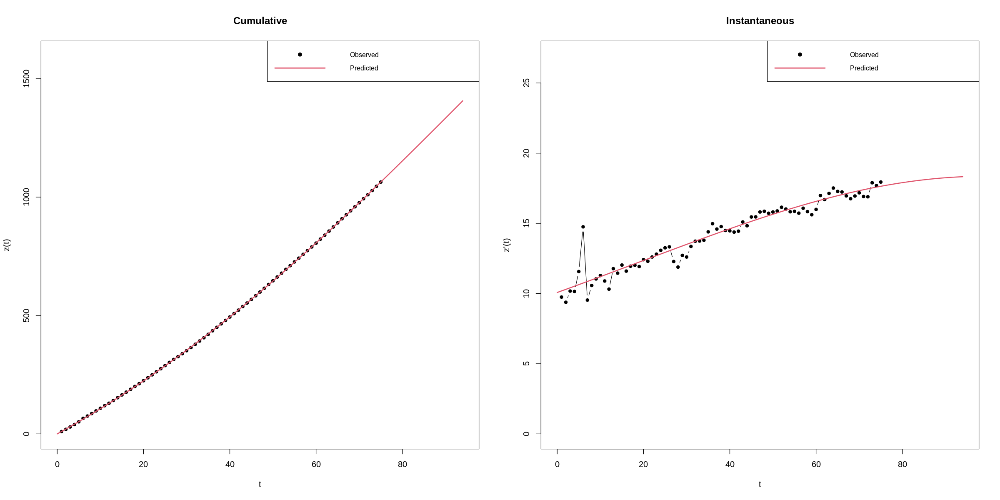

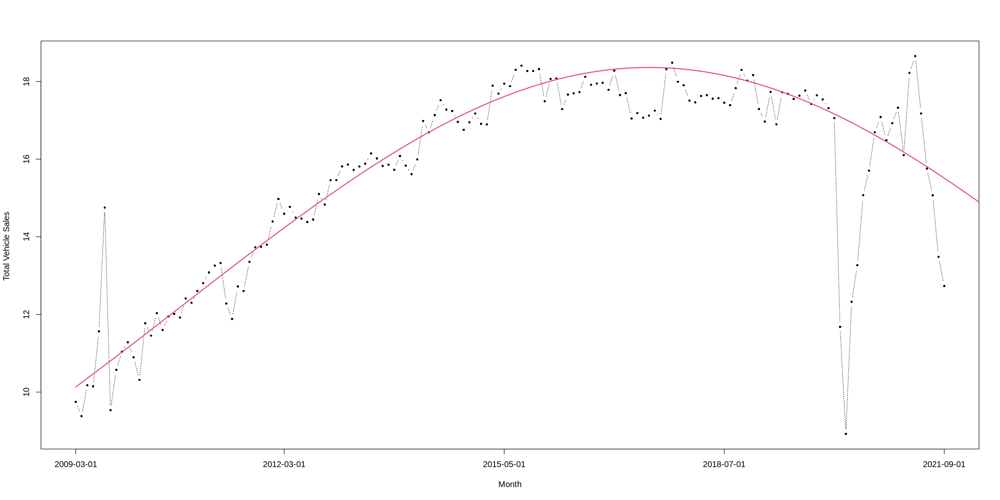

In [145]:
###we estimate the model with 50% of the data
bm_2150<-BM(n21[1:75],display = T)
summary(bm_2150)

pred_bm_2150<- predict(bm_2150, newx=c(1:160))
pred.inst_2150<- make.instantaneous(pred_bm_2150)

plot(n21, type= "b",xlab="Month", ylab="Total Vehicle Sales ",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1,as.integer(length(t21)/4), as.integer(length(t21)/2), as.integer(length(t21)*3/4), as.integer(length(t21))), labels=s21$DATE[c(1,as.integer(length(t21)/4), as.integer(length(t21)/2), as.integer(length(t21)*3/4), as.integer(length(t21)))])
lines(pred.inst_2150, lwd=2, col=2)

Call: ( Standard Bass Model )

  BM(series = n21[1:37], display = T)

Residuals:
     Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-2.24660 -0.61432 -0.23537 -0.05571  0.83029  2.62017 

Coefficients:
       Estimate    Std.Error         Lower        Upper  p-value    
m 4.333429e+03 3.183343e+03 -1.905809e+03 1.057267e+04 0.182000    
p 2.359503e-03 1.742884e-03 -1.056486e-03 5.775493e-03 0.185000    
q 1.208699e-02 2.801866e-03  6.595435e-03 1.757855e-02 0.000131 ***
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  1.084737  on  34  degrees of freedom
 Multiple R-squared:   0.999982  Residual sum of squares:  40.00622


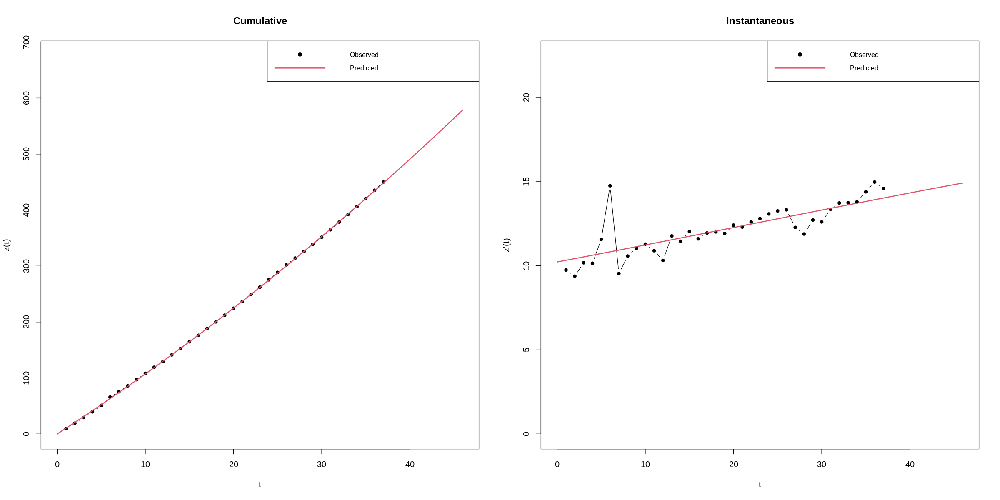

In [146]:
###we estimate the model with 25% of the data
bm_2175<-BM(n21[1:37],display = T)
summary(bm_2175)

pred_bm_2175<- predict(bm_2175, newx=c(1:160))
pred.inst_2175<- make.instantaneous(pred_bm_2175)

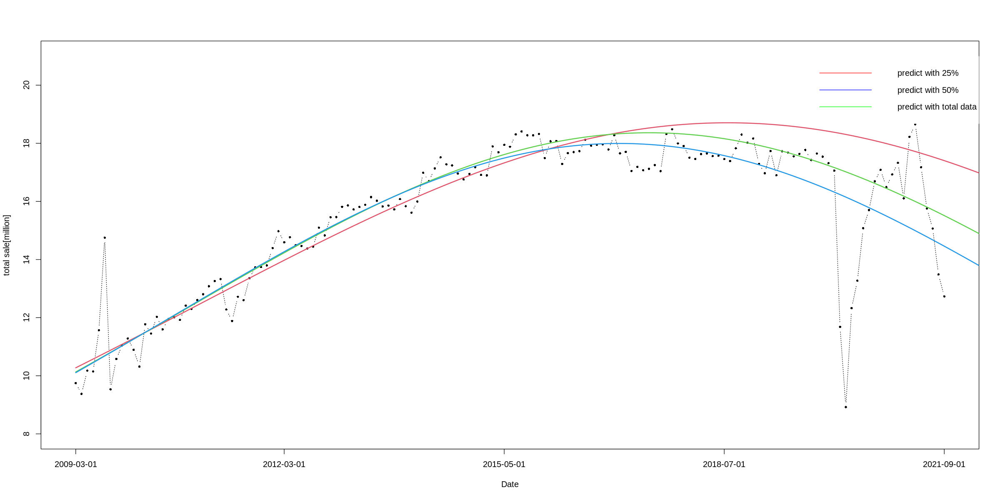

In [156]:
###Comparison between models (instantaneous)
###instantaneous
plot(n21, type= "b",ylab="total sale[million]", xlab="Date",   pch=16, lty=3, xaxt="n", cex=0.6,ylim=c(8,21))
axis(1, at=c(1,as.integer(length(t21)/4), as.integer(length(t21)/2), as.integer(length(t21)*3/4), as.integer(length(t21))), labels=s21$DATE[c(1,as.integer(length(t21)/4), as.integer(length(t21)/2), as.integer(length(t21)*3/4), as.integer(length(t21)))])
legend(125, 21, legend=c("predict with 25%", "predict with 50%","predict with total data"),
       col=c('red', 'blue','green'), lty=1, cex=1,box.lty=0)
lines(pred.inst_2175, lwd=2, col=2)
lines(pred.inst_2150, lwd=2, col=3)
lines(pred.inst_21, lwd=2, col=4)

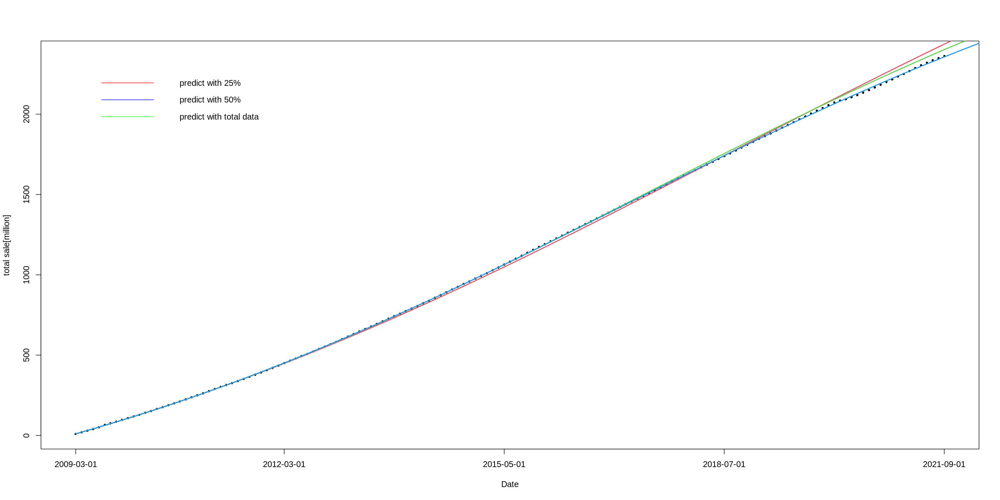

In [159]:
###Comparison between models (cumulative)
plot(cumsum(n21), type= "b",ylab="total sale[million]", xlab="Date",   pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1,as.integer(length(t21)/4), as.integer(length(t21)/2), as.integer(length(t21)*3/4), as.integer(length(t21))), labels=s21$DATE[c(1,as.integer(length(t21)/4), as.integer(length(t21)/2), as.integer(length(t21)*3/4), as.integer(length(t21)))])
legend(1, 2300, legend=c("predict with 25%", "predict with 50%","predict with total data"),
       col=c('red', 'blue','green'), lty=1, cex=1,box.lty=0)
lines(pred_bm_2175, lwd=2, col=2)
lines(pred_bm_2150, lwd=2, col=3)
lines(pred_bm_21, lwd=2, col=4)

##23

Call: ( Standard Bass Model )

  BM(series = n23, display = T)

Residuals:
     Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-1.82313 -0.51153  0.06807  0.16228  1.29853  2.19925 

Coefficients:
       Estimate    Std.Error         Lower        Upper p-value  
m 3.948250e+03 1.742936e+04 -3.021267e+04 3.810917e+04   0.823  
p 3.402109e-03 1.529437e-02 -2.657430e-02 3.337852e-02   0.827  
q 1.137976e-02 1.999751e-02 -2.781463e-02 5.057415e-02   0.577  
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  1.240479  on  17  degrees of freedom
 Multiple R-squared:   0.999948  Residual sum of squares:  26.15938


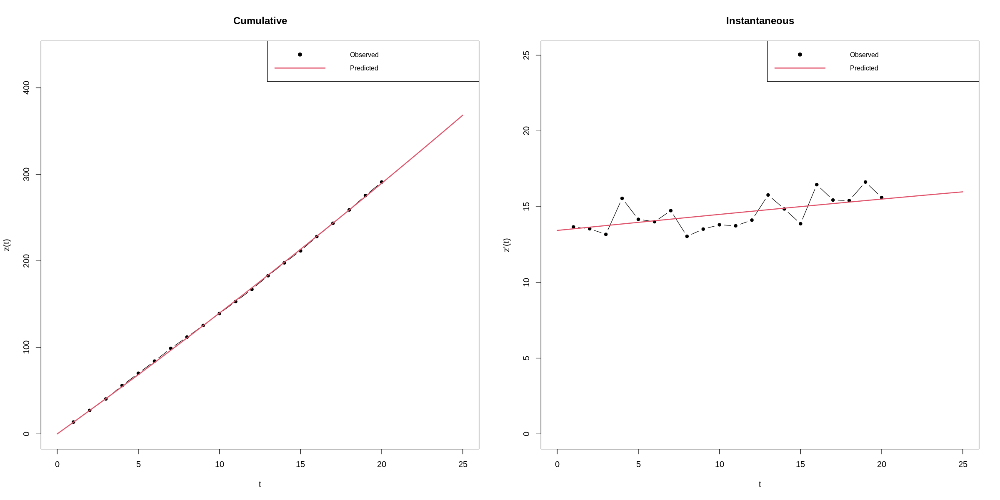

In [ ]:
###we estimate a simple Bass Model
bm23<-BM(n23,display = T)
summary(bm23)

In [ ]:
###prediction (out-of-sample)
pred_bm_23<- predict(bm23, newx=c(1:25))
pred.inst_23<- make.instantaneous(pred_bm_23)

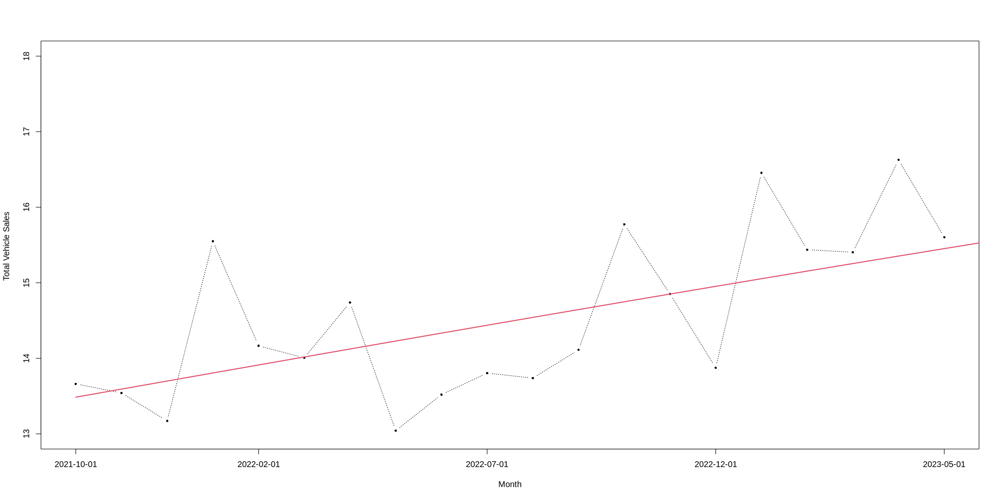

In [ ]:
###plot of fitted model
plot(n23, type= "b",xlab="Month", ylab="Total Vehicle Sales ",  pch=16, lty=3, xaxt="n", cex=0.6, ylim=c(13,18))
axis(1, at=c(1,as.integer(length(t23)/4), as.integer(length(t23)/2), as.integer(length(t23)*3/4), as.integer(length(t23))), labels=s23$DATE[c(1,as.integer(length(t23)/4), as.integer(length(t23)/2), as.integer(length(t23)*3/4), as.integer(length(t23)))])
lines(pred.inst_23, lwd=2, col=2)

Call: ( Standard Bass Model )

  BM(series = n23[1:10], display = T)

Residuals:
      Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
-0.855299 -0.305612  0.141113  0.006422  0.305748  0.485649 

Coefficients:
       Estimate    Std.Error        Lower        Upper  p-value    
m 290.42107465 32.037573672 227.62858410 353.21356520 4.07e-05 ***
p   0.04526037  0.004278261   0.03687513   0.05364561 1.47e-05 ***
q   0.08246241  0.014771778   0.05351025   0.11141456 8.31e-04 ***
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  0.491831  on  7  degrees of freedom
 Multiple R-squared:   0.99997  Residual sum of squares:  1.693283


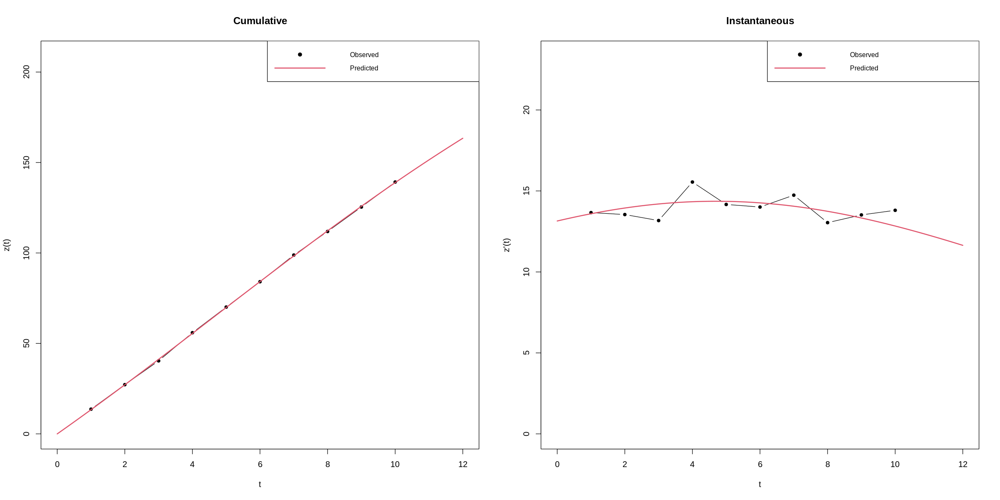

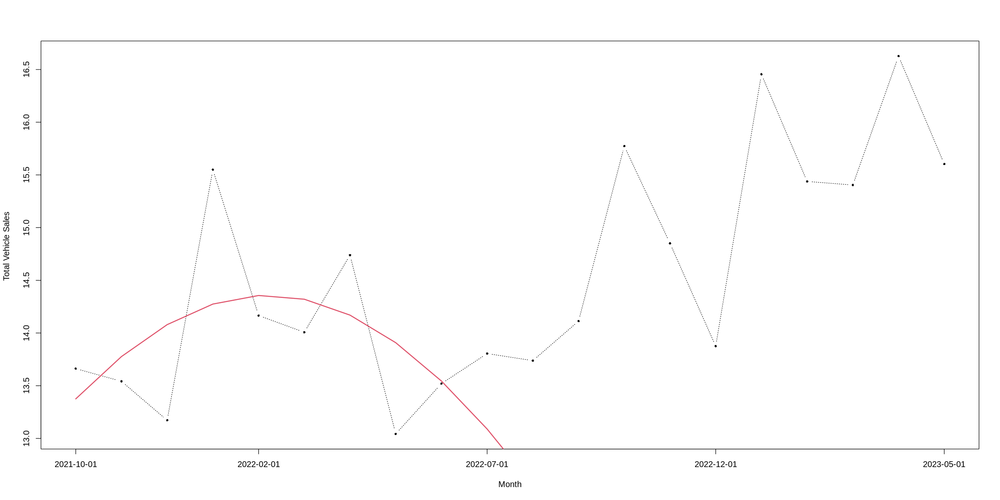

In [ ]:
###we estimate the model with 50% of the data
bm_2350<-BM(n23[1:10],display = T)
summary(bm_2350)

pred_bm_2350<- predict(bm_2350, newx=c(1:25))
pred.inst_2350<- make.instantaneous(pred_bm_2350)

plot(n23, type= "b",xlab="Month", ylab="Total Vehicle Sales ",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1,as.integer(length(t23)/4), as.integer(length(t23)/2), as.integer(length(t23)*3/4), as.integer(length(t23))), labels=s23$DATE[c(1,as.integer(length(t23)/4), as.integer(length(t23)/2), as.integer(length(t23)*3/4), as.integer(length(t23)))])
lines(pred.inst_2350, lwd=2, col=2)

Call: ( Standard Bass Model )

  BM(series = n23[1:5], display = T)

Residuals:
     Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-0.69434 -0.08675  0.17342  0.03722  0.32253  0.47125 

Coefficients:
       Estimate    Std.Error         Lower        Upper p-value  
m 1.189810e+03 3.041331e+04 -5.841918e+04 6.079880e+04   0.972  
p 1.106302e-02 2.860595e-01 -5.496033e-01 5.717293e-01   0.973  
q 3.793713e-02 3.611292e-01 -6.698631e-01 7.457374e-01   0.926  
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  0.650313  on  2  degrees of freedom
 Multiple R-squared:   0.999853  Residual sum of squares:  0.845815


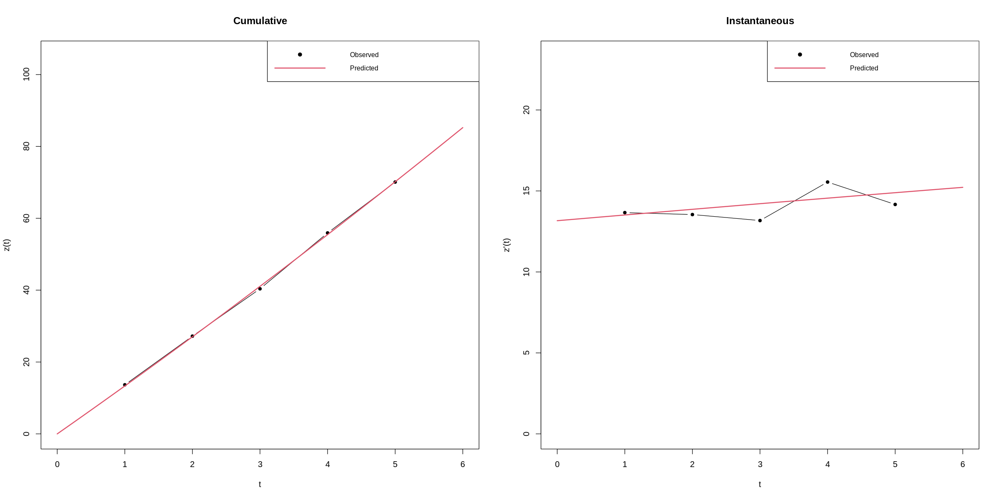

In [ ]:
###we estimate the model with 25% of the data
bm_2375<-BM(n23[1:5],display = T)
summary(bm_2375)

pred_bm_2375<- predict(bm_2375, newx=c(1:25))
pred.inst_2375<- make.instantaneous(pred_bm_2375)

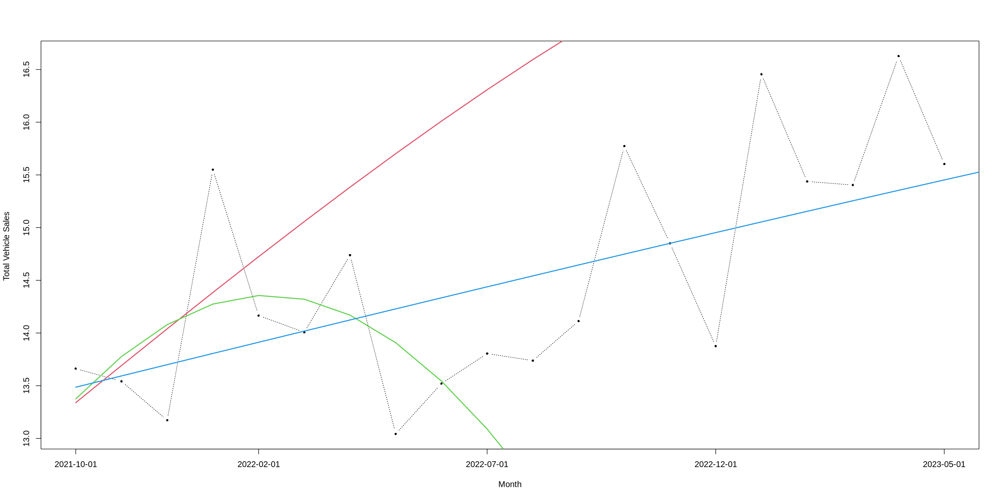

In [ ]:
###Comparison between models (instantaneous)
###instantaneous
plot(n23, type= "b",xlab="Month", ylab="Total Vehicle Sales ",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1,as.integer(length(t23)/4), as.integer(length(t23)/2), as.integer(length(t23)*3/4), as.integer(length(t23))), labels=s23$DATE[c(1,as.integer(length(t23)/4), as.integer(length(t23)/2), as.integer(length(t23)*3/4), as.integer(length(t23)))])
lines(pred.inst_2375, lwd=2, col=2)
lines(pred.inst_2350, lwd=2, col=3)
lines(pred.inst_23, lwd=2, col=4)

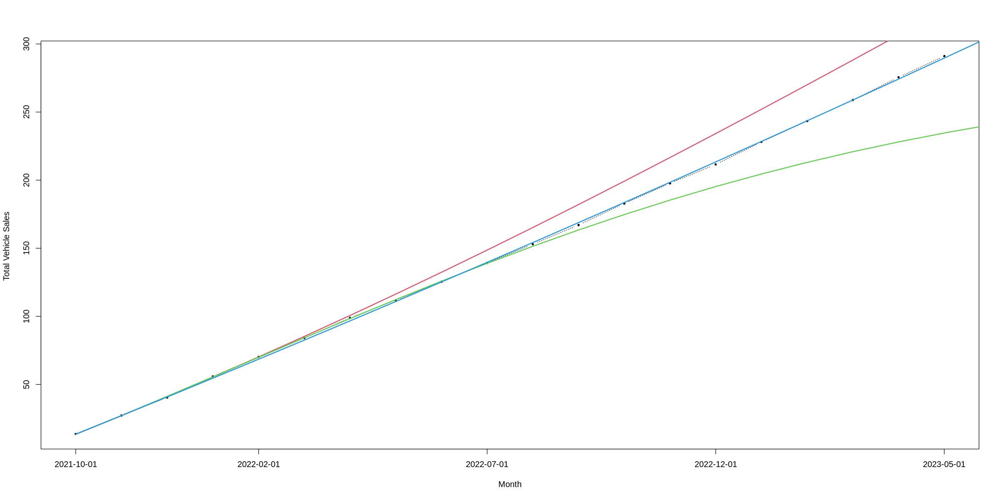

In [ ]:
###Comparison between models (cumulative)
plot(cumsum(n23), type= "b",xlab="Month", ylab="Total Vehicle Sales ",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1,as.integer(length(t23)/4), as.integer(length(t23)/2), as.integer(length(t23)*3/4), as.integer(length(t23))), labels=s23$DATE[c(1,as.integer(length(t23)/4), as.integer(length(t23)/2), as.integer(length(t23)*3/4), as.integer(length(t23)))])
lines(pred_bm_2375, lwd=2, col=2)
lines(pred_bm_2350, lwd=2, col=3)
lines(pred_bm_23, lwd=2, col=4)

##total

Call: ( Standard Bass Model )

  BM(series = n_train, display = T)

Residuals:
    Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-3384.7 -1466.6   413.6   128.7  1322.3  3636.0 

Coefficients:
       Estimate    Std.Error         Lower        Upper   p-value    
m 4.976428e+03 8.882558e+01  4.802333e+03 5.150523e+03 4.45e-233 ***
p 1.198776e-23 1.840334e-22 -3.487110e-22 3.726865e-22  9.48e-01    
q 4.858144e-01 3.027364e-01 -1.075381e-01 1.079167e+00  1.09e-01    
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  1902.543  on  566  degrees of freedom
 Multiple R-squared:   0.847543  Residual sum of squares:  2048733431


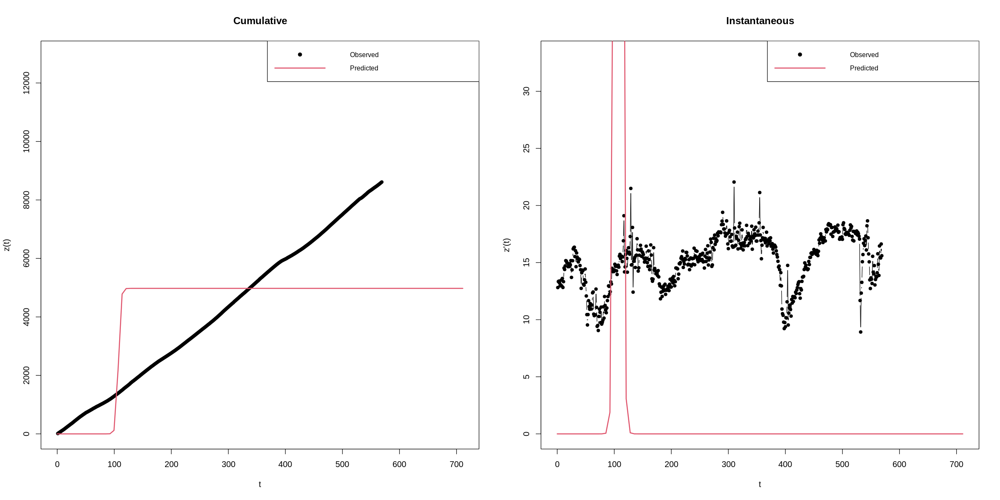

In [ ]:
###we estimate a simple Bass Model
bm<-BM(n_train,display = T)
summary(bm)

In [ ]:
rmse(n_train, fitted(bm))

[1] 4461.754

#GBM

##09

Call: ( Generalized Bass model with 3  Rectangular  shock )

  GBM(series = name, shock = "rett", nshock = 3, prelimestimates = c(6183.754, 
    0.00198628, 0.006688124, 80, 90, 0.1, 100, 110, -0.1, 190, 
    200, 0.2))

Residuals:
      Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
-10.28656  -1.13623  -0.01924  -0.02939   1.07848   4.53252 

Coefficients:
           Estimate    Std.Error         Lower         Upper   p-value    
m     5.037104e+03 3.641183e+01  4.965738e+03  5.108470e+03 3.65e-205 ***
p     2.391846e-03 1.410448e-05  2.364202e-03  2.419490e-03 3.19e-223 ***
q     8.380315e-03 8.440083e-05  8.214892e-03  8.545737e-03 6.14e-176 ***
a1    6.204673e+01 7.985345e-01  6.048163e+01  6.361183e+01 1.42e-154 ***
b1    9.484171e+01 8.102247e-01  9.325370e+01  9.642972e+01 2.09e-190 ***
c1   -6.937982e-02 2.766014e-03 -7.480110e-02 -6.395853e-02  1.55e-64 ***
a2    1.057102e+02 1.459987e+00  1.028487e+02  1.085717e+02 1.76e-148 ***
b2    1.115230e+02 1.512758e+00  1.08

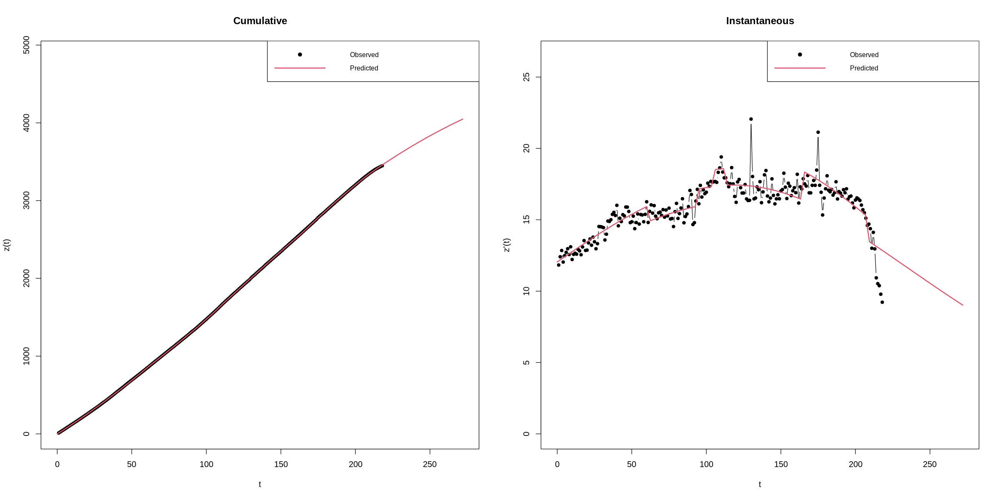

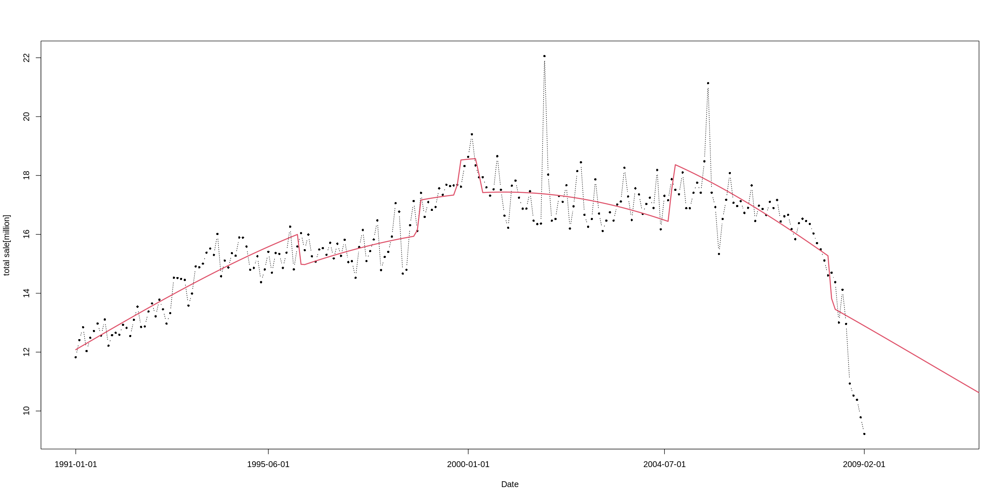

In [184]:
name=n09
GBMr1<- GBM(name,shock = "rett",nshock = 3,prelimestimates = c(6.183754e+03, 1.986280e-03, 6.688124e-03, 80,90,0.1,100,110,-0.1,190,200,0.2))
summary(GBMr1)


pred_GBMr1<- predict(GBMr1, newx=c(1:250))
pred_GBMr1.inst<- make.instantaneous(pred_GBMr1)

plot(name, type= "b",ylab="total sale[million]", xlab="Date",  pch=16, lty=3, cex=0.6, xlim=c(1,240),xaxt='n')
axis(1, at=c(1,as.integer(length(t09)/4), as.integer(length(t09)/2), as.integer(length(t09)*3/4), as.integer(length(t09))), labels=s09$DATE[c(1,as.integer(length(t09)/4), as.integer(length(t09)/2), as.integer(length(t09)*3/4), as.integer(length(t09)))])

lines(pred_GBMr1.inst, lwd=2, col=2)

In [185]:
rmse(n09,fitted(GBMr1))

[1] 1960.457

Call: ( Generalized Bass model with 2  Rectangular  shock )

  GBM(series = name, shock = "rett", nshock = 2, prelimestimates = c(6183.754, 
    0.00198628, 0.006688124, 80, 90, 0.1, 160, 190, 0.1))

Residuals:
      Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
-8.896625 -1.698575 -0.037287  0.001522  1.575393  5.120211 

Coefficients:
           Estimate    Std.Error         Lower         Upper   p-value    
m     4.933432e+03 3.426888e+01  4.866266e+03  5.000598e+03 4.67e-211 ***
p     2.429772e-03 1.395697e-05  2.402417e-03  2.457127e-03 3.67e-228 ***
q     8.699505e-03 8.009459e-05  8.542522e-03  8.856487e-03 7.98e-186 ***
a1    5.952998e+01 7.741009e-01  5.801277e+01  6.104719e+01 2.93e-155 ***
b1    9.415211e+01 7.466308e-01  9.268874e+01  9.561548e+01 3.59e-199 ***
c1   -7.356635e-02 2.572666e-03 -7.860868e-02 -6.852402e-02  3.55e-74 ***
a2    1.657063e+02 3.988819e-01  1.649245e+02  1.664881e+02 7.53e-307 ***
b2    2.091500e+02 7.772102e-01  2.076267e+02  2.106733e+0

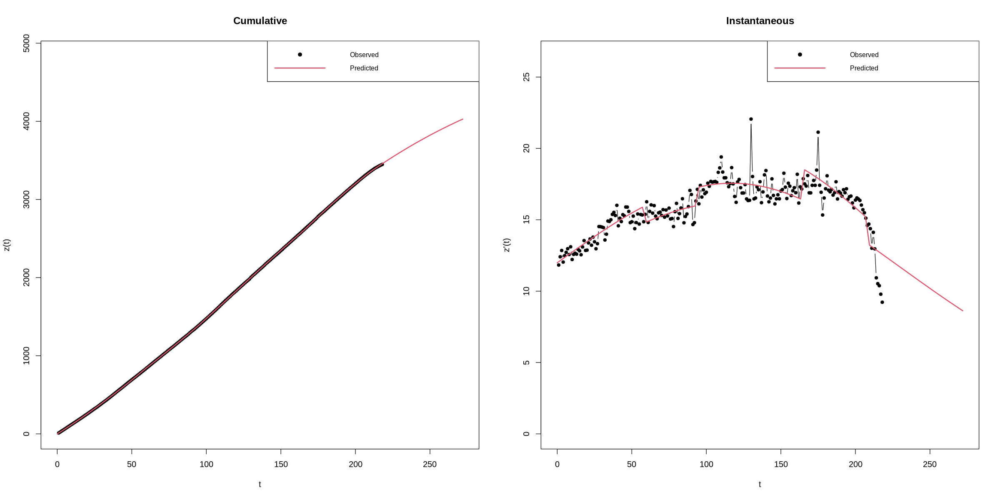

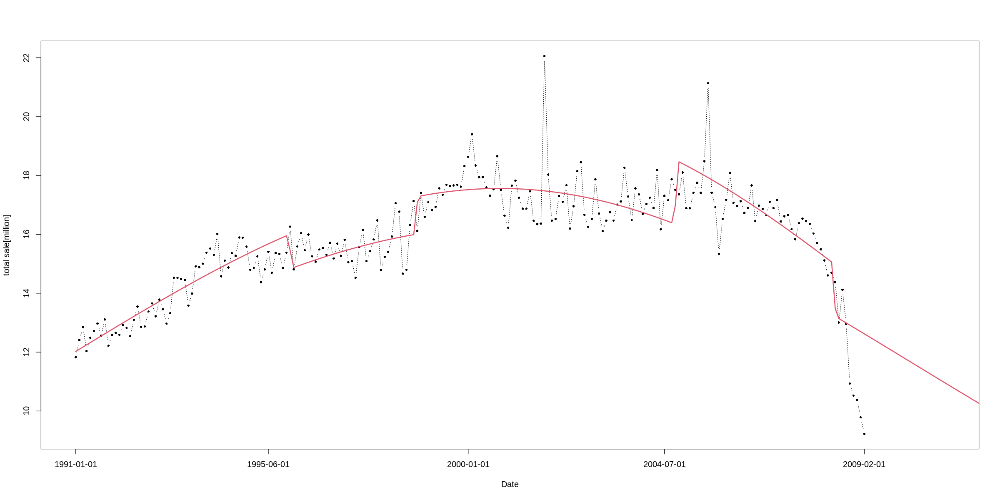

In [187]:
name=n09
GBMr2<- GBM(name,shock = "rett",nshock = 2,prelimestimates = c(6.183754e+03, 1.986280e-03, 6.688124e-03, 80,90,0.1,160,190,0.1))
summary(GBMr2)


pred_GBMr2<- predict(GBMr2, newx=c(1:250))
pred_GBMr2.inst<- make.instantaneous(pred_GBMr2)

plot(name, type= "b",ylab="total sale[million]", xlab="Date",  pch=16, lty=3, cex=0.6, xlim=c(1,240),xaxt='n')
axis(1, at=c(1,as.integer(length(t09)/4), as.integer(length(t09)/2), as.integer(length(t09)*3/4), as.integer(length(t09))), labels=s09$DATE[c(1,as.integer(length(t09)/4), as.integer(length(t09)/2), as.integer(length(t09)*3/4), as.integer(length(t09)))])
lines(pred_GBMr2.inst, lwd=2, col=2)

In [188]:
rmse(n09,fitted(GBMr2))

[1] 1960.457

Call: ( Generalized Bass model with 1  Exponential  shock )

  GBM(series = name, shock = "exp", nshock = 1, prelimestimates = c(6183.754, 
    0.00198628, 0.006688124, 90, 0.1, 0.3))

Residuals:
      Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
-12.40203  -3.06799   0.01294  -0.06826   3.12625   7.19420 

Coefficients:
          Estimate    Std.Error        Lower        Upper   p-value    
m    3.761357e+03 1.780551e+01 3.726459e+03 3.796256e+03 1.81e-248 ***
p    3.213809e-03 1.401515e-05 3.186340e-03 3.241279e-03 5.44e-256 ***
q    9.354174e-03 8.829945e-05 9.181110e-03 9.527238e-03 1.45e-185 ***
a1   9.200000e+01 1.387604e+00 8.928035e+01 9.471965e+01 1.02e-143 ***
b1   2.890322e-02 4.765752e-04 2.796915e-02 2.983729e-02 6.39e-136 ***
c1   6.748059e-02 2.437353e-03 6.270347e-02 7.225771e-02  2.41e-72 ***
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  3.756384  on  212  degrees of freedom
 Multiple R-squared:   0.999987  Re

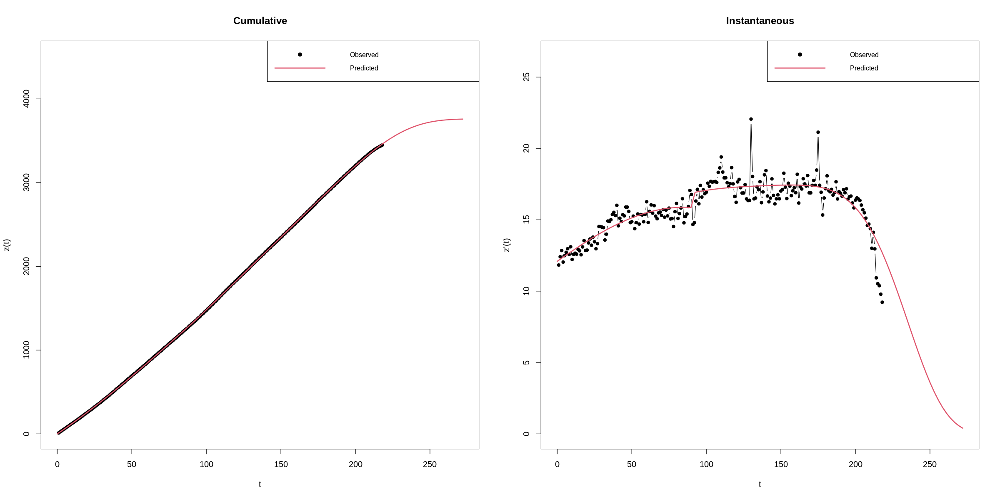

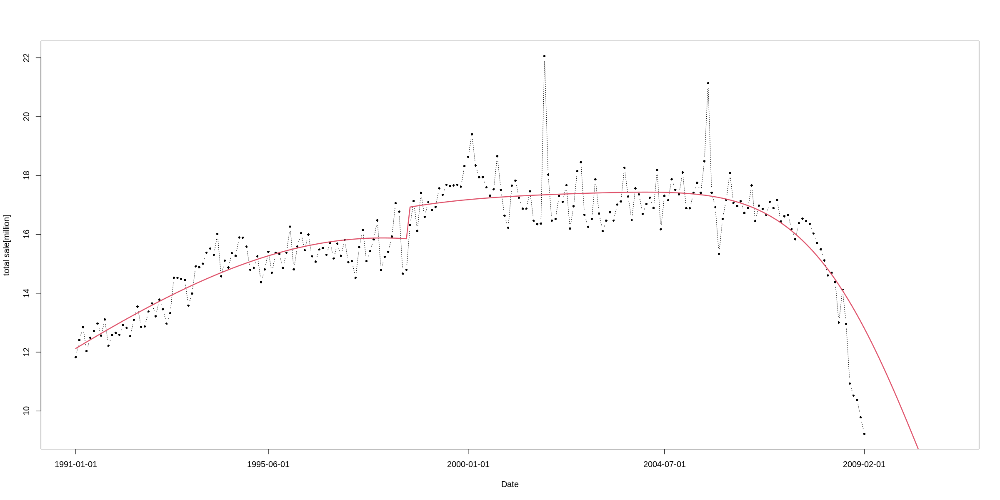

In [182]:
######GBMe1
name= n09
GBMe1<- GBM(name,shock = "exp",nshock = 1,prelimestimates = c(6.183754e+03, 1.986280e-03, 6.688124e-03, 90,0.1,0.3))
summary(GBMe1)

pred_GBMe1<- predict(GBMe1, newx=c(1:250))
pred_GBMe1.inst<- make.instantaneous(pred_GBMe1)

plot(name, type= "b",ylab="total sale[million]", xlab="Date",  pch=16, lty=3, cex=0.6, xlim=c(1,240),xaxt='n')
axis(1, at=c(1,as.integer(length(t09)/4), as.integer(length(t09)/2), as.integer(length(t09)*3/4), as.integer(length(t09))), labels=s09$DATE[c(1,as.integer(length(t09)/4), as.integer(length(t09)/2), as.integer(length(t09)*3/4), as.integer(length(t09)))])
lines(pred_GBMe1.inst, lwd=2, col=2)



In [186]:
rmse(n09,fitted(GBMe1))

[1] 1960.454

Call: ( Generalized Bass model with 2  Exponential  shock )

  GBM(series = name, shock = "exp", nshock = 2, prelimestimates = c(6183.754, 
    0.00198628, 0.006688124, 35, -0.1, 0.1, 100, -0.2, 0.2))

Residuals:
       Min.    1st Qu.     Median       Mean    3rd Qu.       Max. 
-14.949276  -1.788923  -0.001443   0.005671   2.225477   7.379931 

Coefficients:
           Estimate    Std.Error         Lower        Upper   p-value    
m     3.846942e+03 2.481817e+01  3.798299e+03 3.895585e+03 1.05e-217 ***
p     3.174087e-03 5.191540e-05  3.072335e-03 3.275840e-03 2.50e-135 ***
q     7.491975e-03 1.306324e-03  4.931627e-03 1.005232e-02  3.38e-08 ***
a1    2.758444e+01 2.274487e+00  2.312652e+01 3.204235e+01  5.61e-26 ***
b1   -2.862238e-03 1.499275e-02 -3.224749e-02 2.652302e-02  8.49e-01    
c1    7.488362e-02 2.551584e-02  2.487349e-02 1.248938e-01  3.71e-03  **
a2    8.872293e+01 1.150961e+00  8.646708e+01 9.097877e+01 1.81e-155 ***
b2    2.480479e-02 9.921794e-04  2.286016e-02 2.6749

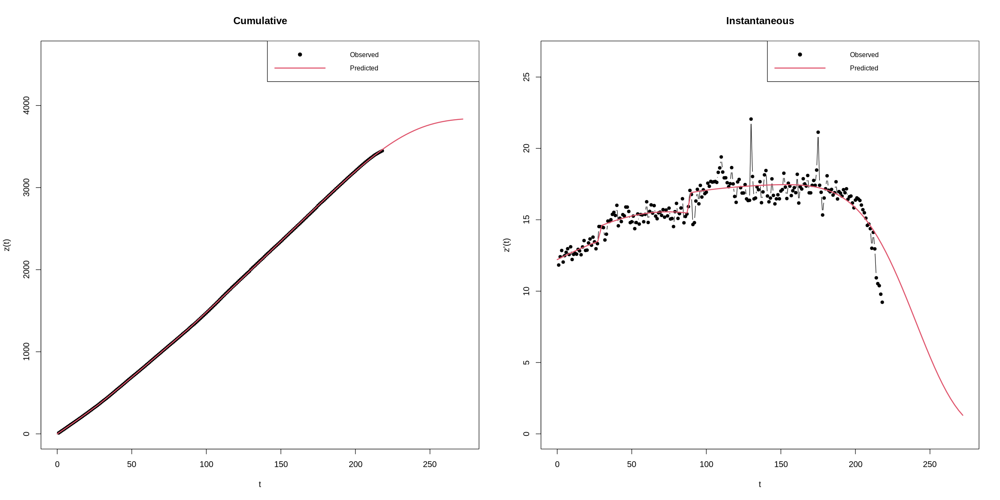

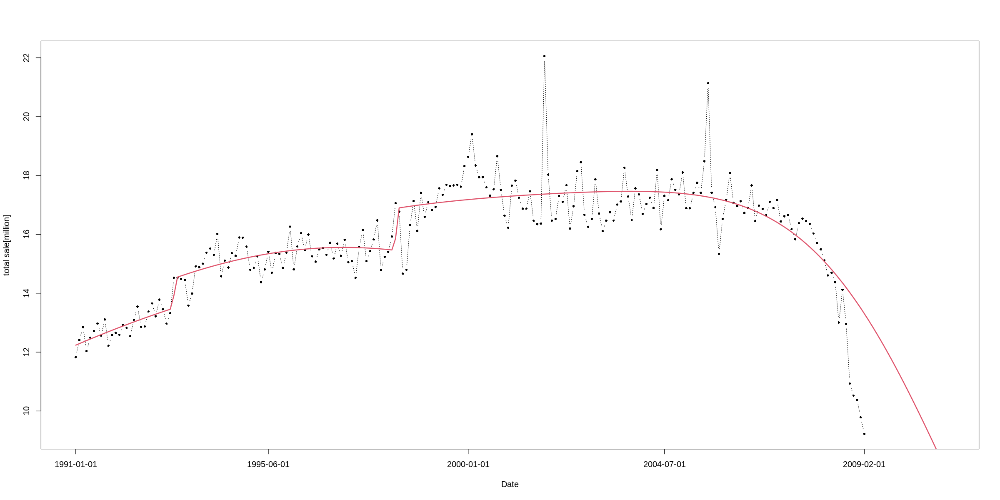

In [189]:
######GBMe1
name= n09
GBMe2<- GBM(name,shock = "exp",nshock = 2,prelimestimates = c(6.183754e+03, 1.986280e-03, 6.688124e-03, 35,-0.1,0.1,100,-0.2,0.2))
summary(GBMe2)

pred_GBMe2<- predict(GBMe2, newx=c(1:250))
pred_GBMe2.inst<- make.instantaneous(pred_GBMe2)

plot(name, type= "b",ylab="total sale[million]", xlab="Date",  pch=16, lty=3, cex=0.6, xlim=c(1,240),xaxt='n')
axis(1, at=c(1,as.integer(length(t09)/4), as.integer(length(t09)/2), as.integer(length(t09)*3/4), as.integer(length(t09))), labels=s09$DATE[c(1,as.integer(length(t09)/4), as.integer(length(t09)/2), as.integer(length(t09)*3/4), as.integer(length(t09)))])
lines(pred_GBMe2.inst, lwd=2, col=2)

In [190]:
rmse(n09,fitted(GBMe2))

[1] 1960.455

Call: ( Generalized Bass model with 2  Mixed  shock )

  GBM(series = name, shock = "mixed", nshock = 2, prelimestimates = c(6183.754, 
    0.00198628, 0.006688124, 110, -0.1, 0.2, 30, 50, -0.1))

Residuals:
      Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
-13.43204  -2.13516   0.30154   0.05912   1.95853   7.40399 

Coefficients:
          Estimate    Std.Error        Lower        Upper   p-value    
m    3.787711e+03 1.947670e+01 3.749537e+03 3.825884e+03 3.76e-238 ***
p    3.165661e-03 1.726724e-05 3.131818e-03 3.199504e-03 7.93e-233 ***
q    9.242657e-03 9.798190e-05 9.050616e-03 9.434698e-03 2.79e-173 ***
a1   9.032680e+01 1.401990e+00 8.757895e+01 9.307465e+01 7.62e-140 ***
b1   2.790570e-02 5.195550e-04 2.688739e-02 2.892401e-02 2.85e-124 ***
c1   6.834106e-02 2.315606e-03 6.380256e-02 7.287957e-02  1.77e-76 ***
a2   3.286631e+01 2.998534e+00 2.698930e+01 3.874333e+01  2.22e-22 ***
b2   4.445656e+01 2.966025e+00 3.864326e+01 5.026987e+01  5.70e-35 ***
c2   5.183043e

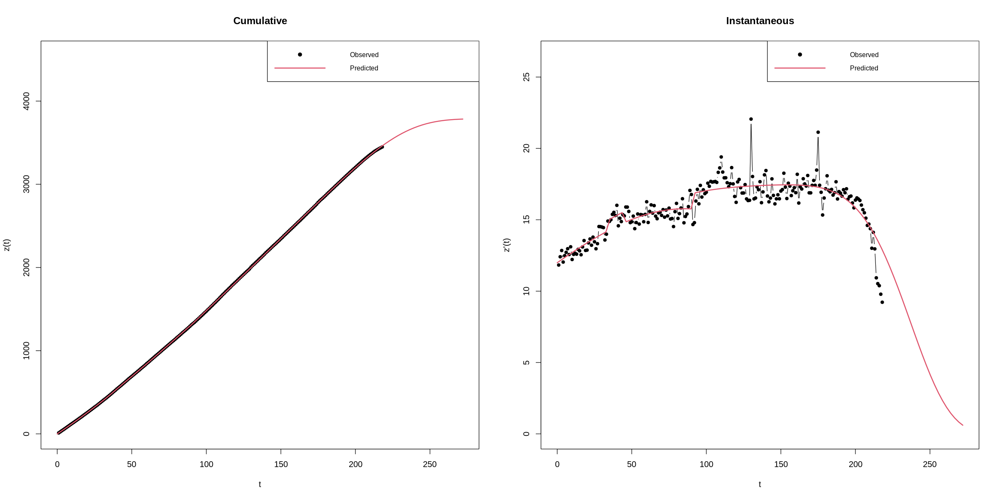

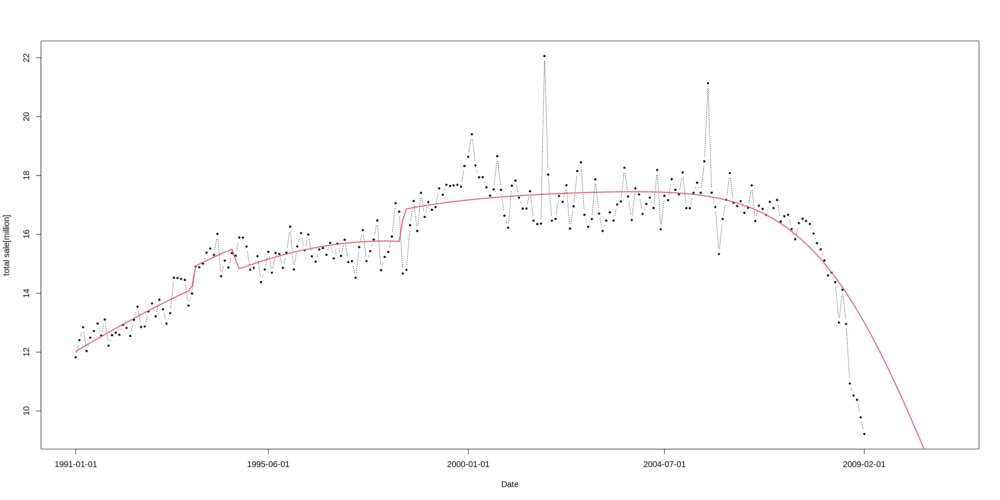

In [191]:
######GBMe1
name= n09
GBMi1<- GBM(name,shock = "mixed",nshock = 2,prelimestimates = c(6.183754e+03, 1.986280e-03, 6.688124e-03, 110,-0.1,0.2,30,50,-0.1))
summary(GBMi1)

pred_GBMi1<- predict(GBMi1, newx=c(1:250))
pred_GBMi1.inst<- make.instantaneous(pred_GBMi1)

plot(name, type= "b",ylab="total sale[million]", xlab="Date",  pch=16, lty=3, cex=0.6, xlim=c(1,240),xaxt='n')
axis(1, at=c(1,as.integer(length(t09)/4), as.integer(length(t09)/2), as.integer(length(t09)*3/4), as.integer(length(t09))), labels=s09$DATE[c(1,as.integer(length(t09)/4), as.integer(length(t09)/2), as.integer(length(t09)*3/4), as.integer(length(t09)))])
lines(pred_GBMi1.inst, lwd=2, col=2)

In [192]:
rmse(n09,fitted(GBMi1))

[1] 1960.455

Call: ( Guseo Guidolin Model )

  GGM(series = name, prelimestimates = c(6183.754, 0.001, 0.01, 
    0.00198628, 0.006688124))

Residuals:
     Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-16.4779  -4.1678  -0.9986   1.0800   6.7638  22.1690 

Coefficients:
           Estimate    Std.Error         Lower         Upper  p-value    
K     6.975425e+03 1.679377e+03  3.683906e+03  1.026694e+04 4.74e-05 ***
pc    5.444837e-04 6.854374e-05  4.101404e-04  6.788270e-04 1.12e-13 ***
qc    1.691999e-02 7.354037e-04  1.547863e-02  1.836136e-02 1.15e-59 ***
ps    2.573033e-02 5.024428e-03  1.588263e-02  3.557802e-02 6.79e-07 ***
qs   -3.856324e-02 2.691265e-03 -4.383802e-02 -3.328846e-02 4.69e-33 ***
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  7.725911  on  213  degrees of freedom
 Multiple R-squared:   0.999945  Residual sum of squares:  12713.91


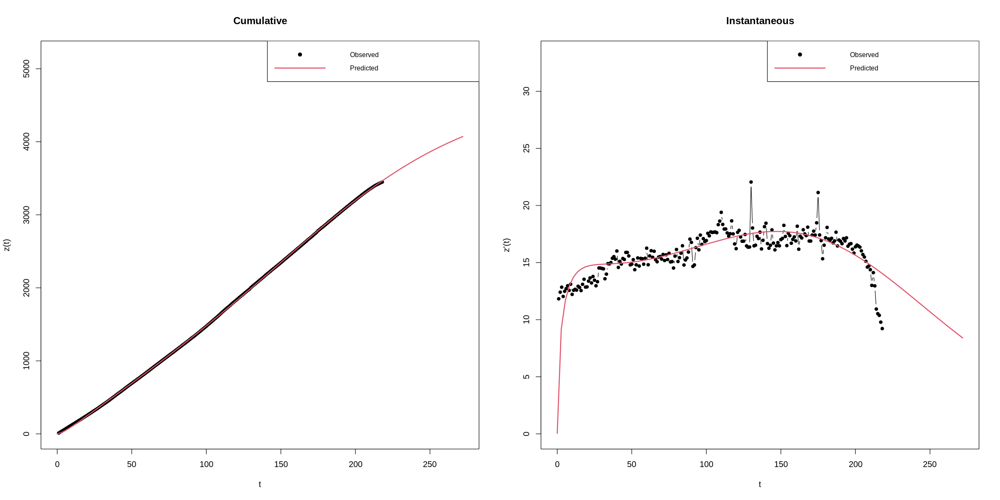

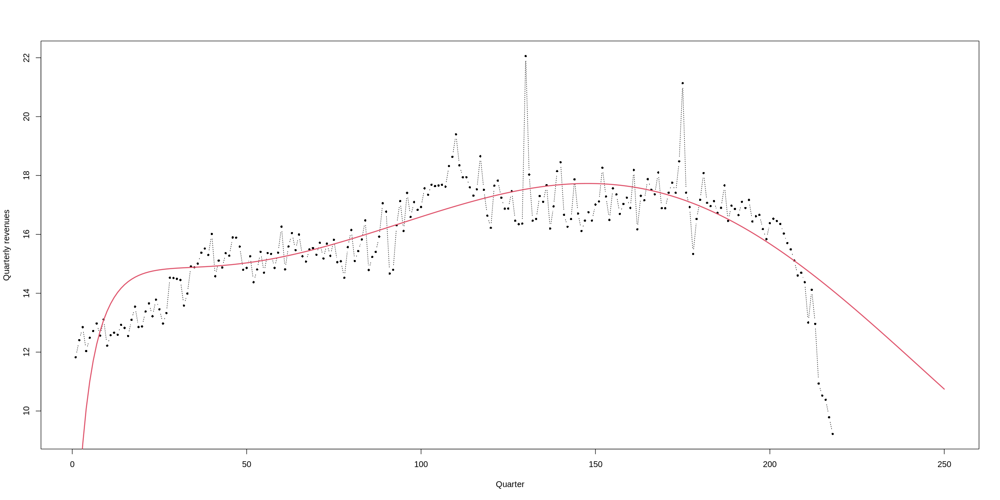

In [ ]:
######GGM
GGM<- GGM(name, prelimestimates=c(6.183754e+03, 0.001, 0.01, 1.986280e-03,6.688124e-03))
summary(GGM)

pred_GGM<- predict(GGM, newx=c(1:250))
pred_GGM.inst<- make.instantaneous(pred_GGM)

plot(name, type= "b",xlab="Quarter", ylab="Quarterly revenues",  pch=16, lty=3, cex=0.6, xlim=c(1,250))
lines(pred_GGM.inst, lwd=2, col=2)
#lines(pred.inst, lwd=2, col=3)

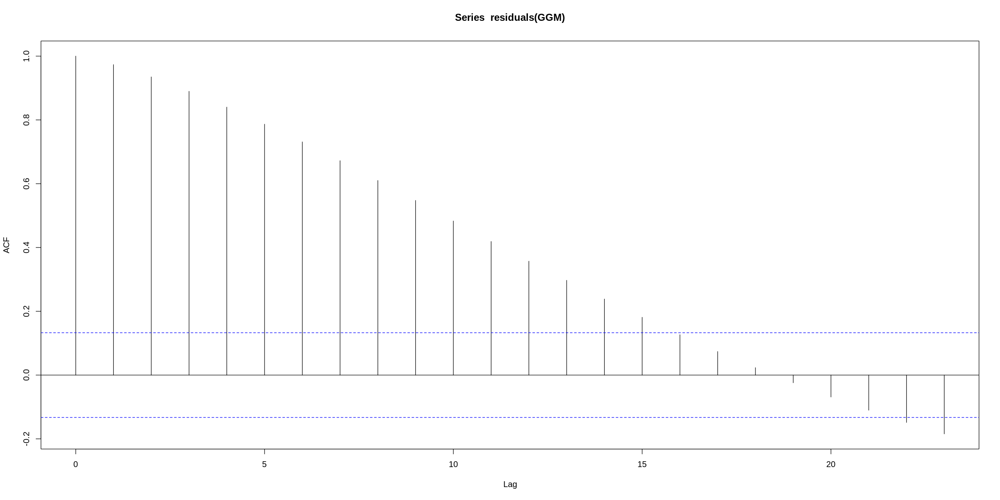

In [ ]:
###Analysis of residuals
res_GGM<- residuals(GGM)
acf<- acf(residuals(GGM))


fit_GGM<- fitted(GGM)
fit_GGM_inst<- make.instantaneous(fit_GGM)

##21

Call: ( Generalized Bass model with 3  Rectangular  shock )

  GBM(series = name, shock = "rett", nshock = 3, prelimestimates = c(3529.995, 
    0.002847066, 0.01412257, 5, 10, -0.1, 130, 140, 0.2, 146, 
    150, -0.2))

Residuals:
      Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
-3.130686 -1.170549 -0.303364  0.000002  1.045645  3.949369 

Coefficients:
           Estimate    Std.Error         Lower         Upper   p-value    
m     3.767789e+03 3.647535e+01  3.696299e+03  3.839280e+03 2.65e-133 ***
p     2.909559e-03 1.344118e-05  2.883215e-03  2.935903e-03 1.15e-177 ***
q     1.256605e-02 2.145608e-04  1.214552e-02  1.298658e-02 7.51e-100 ***
a1   -1.594676e+00 1.030317e+00 -3.614061e+00  4.247094e-01  1.24e-01    
b1    3.486971e+01 9.967166e-01  3.291618e+01  3.682324e+01  8.84e-71 ***
c1   -5.502985e-02 6.875892e-03 -6.850635e-02 -4.155335e-02  4.31e-13 ***
a2    1.327356e+02 3.288506e-01  1.320911e+02  1.333801e+02 3.24e-215 ***
b2    1.356106e+02 3.926698e-01  1.34

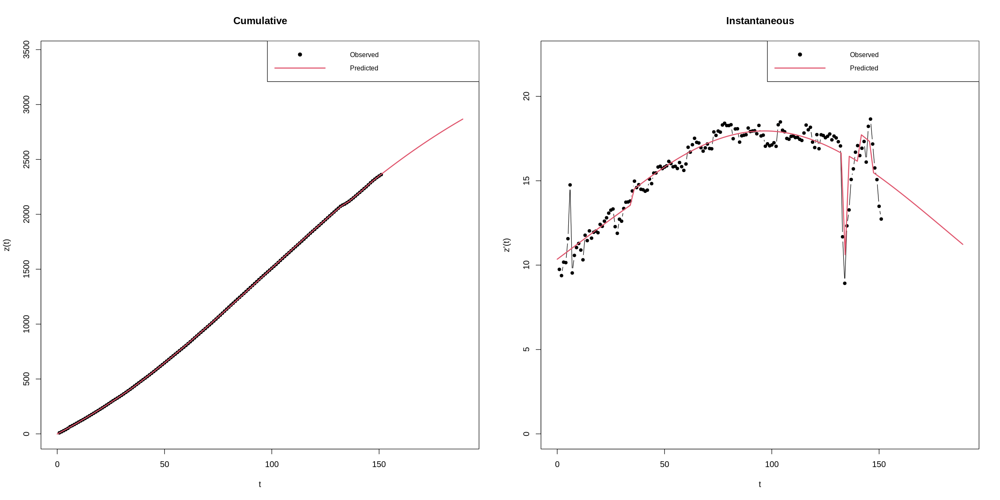

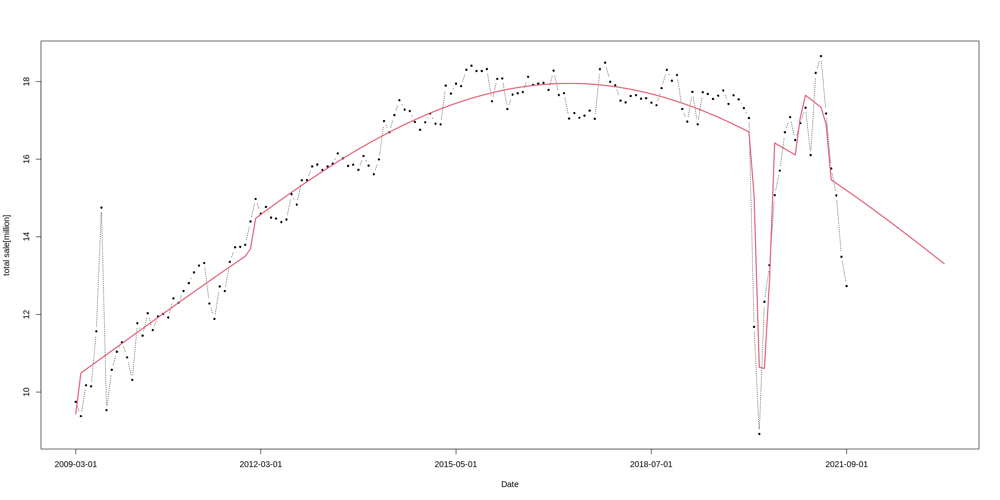

In [205]:
name=n21
GBMr1<- GBM(name,shock = "rett",nshock = 3,prelimestimates = c(3.529995e+03, 2.847066e-03, 1.412257e-02,5,10,-0.1,130,140,0.2,146,150,-0.2))
summary(GBMr1)


pred_GBMr1<- predict(GBMr1, newx=c(1:170))
pred_GBMr1.inst<- make.instantaneous(pred_GBMr1)

plot(n21, type= "b",ylab="total sale[million]", xlab="Date", pch=16, lty=3, xaxt="n", cex=0.6,xlim=c(1,170))
axis(1, at=c(1,as.integer(length(t21)/4), as.integer(length(t21)/2), as.integer(length(t21)*3/4), as.integer(length(t21))), labels=s21$DATE[c(1,as.integer(length(t21)/4), as.integer(length(t21)/2), as.integer(length(t21)*3/4), as.integer(length(t21)))])
lines(pred_GBMr1.inst, lwd=2, col=2)

In [198]:
rmse(n21,fitted(GBMr1))

[1] 1313.314

Call: ( Generalized Bass model with 2  Exponential  shock )

  GBM(series = name, shock = "exp", nshock = 2, prelimestimates = c(3529.995, 
    0.002847066, 0.01412257, 130, -0.1, 0.2, 145, 0.1, 0.2))

Residuals:
      Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
-4.017536 -1.426167  0.037422 -0.007663  1.085279  5.732870 

Coefficients:
           Estimate    Std.Error         Lower        Upper   p-value    
m     3.564701e+03 1.461547e+01  3.536055e+03 3.593347e+03 3.81e-188 ***
p     2.823393e-03 7.973540e-06  2.807765e-03 2.839021e-03 4.24e-211 ***
q     1.401298e-02 6.788328e-05  1.387993e-02 1.414603e-02 6.90e-178 ***
a1    1.334608e+02 5.498511e-01  1.323831e+02 1.345385e+02 7.56e-188 ***
b1   -1.153823e+00 9.600761e-01 -3.035538e+00 7.278916e-01  2.31e-01    
c1   -9.411913e-01 7.416307e-01 -2.394761e+00 5.123781e-01  2.06e-01    
a2    1.415326e+02 6.573181e-01  1.402443e+02 1.428210e+02 1.76e-180 ***
b2   -2.621013e-01 1.500536e-01 -5.562010e-01 3.199828e-02  8.28

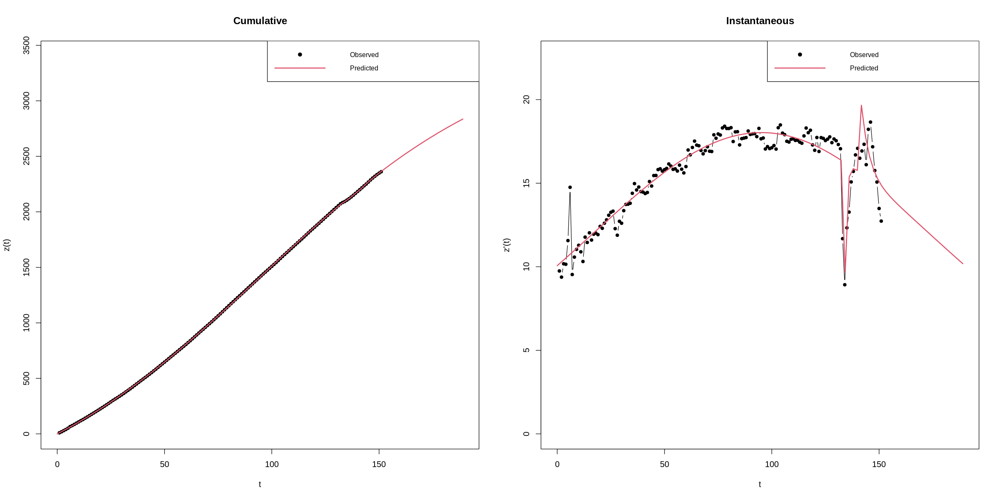

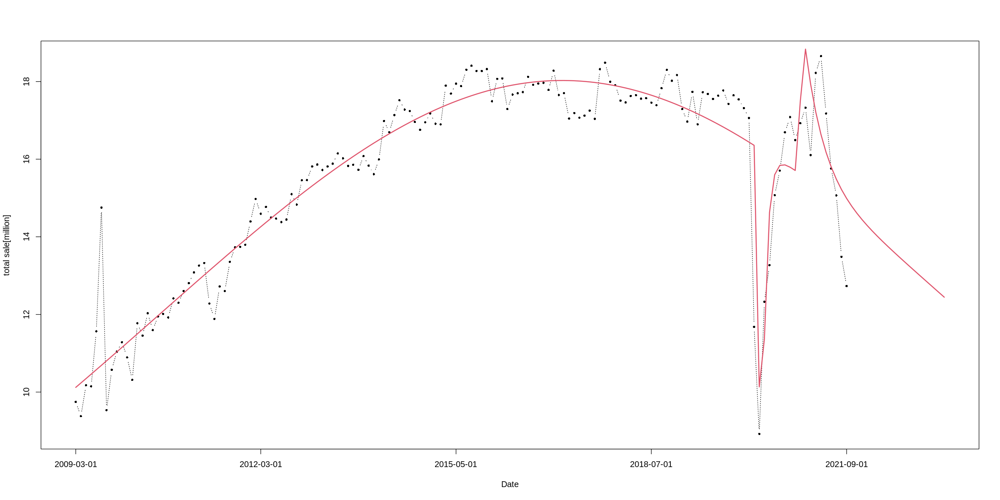

In [200]:
######GBMe1
name= n21
GBMe1<- GBM(name,shock = "exp",nshock = 2,prelimestimates = c(3.529995e+03, 2.847066e-03, 1.412257e-02,130,-0.1,0.2,145,0.1,0.2))
summary(GBMe1)

pred_GBMe1<- predict(GBMe1, newx=c(1:170))
pred_GBMe1.inst<- make.instantaneous(pred_GBMe1)

plot(n21, type= "b",ylab="total sale[million]", xlab="Date", pch=16, lty=3, xaxt="n", cex=0.6,xlim=c(1,170))
axis(1, at=c(1,as.integer(length(t21)/4), as.integer(length(t21)/2), as.integer(length(t21)*3/4), as.integer(length(t21))), labels=s21$DATE[c(1,as.integer(length(t21)/4), as.integer(length(t21)/2), as.integer(length(t21)*3/4), as.integer(length(t21)))])
lines(pred_GBMe1.inst, lwd=2, col=2)



In [201]:
rmse(n21,fitted(GBMe1))

[1] 1313.314

Call: ( Generalized Bass model with 2  Mixed  shock )

  GBM(series = name, shock = "mixed", nshock = 2, prelimestimates = c(3529.995, 
    0.002847066, 0.01412257, 145, -0.1, 0.1, 125, 140, 0.2))

Residuals:
      Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
-4.007907 -1.479715  0.070984 -0.008647  1.203858  5.737521 

Coefficients:
           Estimate    Std.Error         Lower        Upper   p-value    
m     3.564960e+03 1.455021e+01  3.536442e+03 3.593478e+03 2.00e-188 ***
p     2.823305e-03 7.936574e-06  2.807749e-03 2.838860e-03 2.21e-211 ***
q     1.401141e-02 6.762897e-05  1.387886e-02 1.414396e-02 4.12e-178 ***
a1    1.423723e+02 6.523589e-01  1.410937e+02 1.436509e+02 2.61e-181 ***
b1   -3.851936e-01 2.293615e-01 -8.347338e-01 6.434662e-02  9.53e-02   .
c1    3.685859e-01 1.722295e-01  3.102231e-02 7.061494e-01  3.41e-02   *
a2    1.330000e+02 8.678074e-01  1.312991e+02 1.347009e+02 1.32e-159 ***
b2    1.353714e+02 5.679423e-01  1.342582e+02 1.364845e+02 9.90e-187

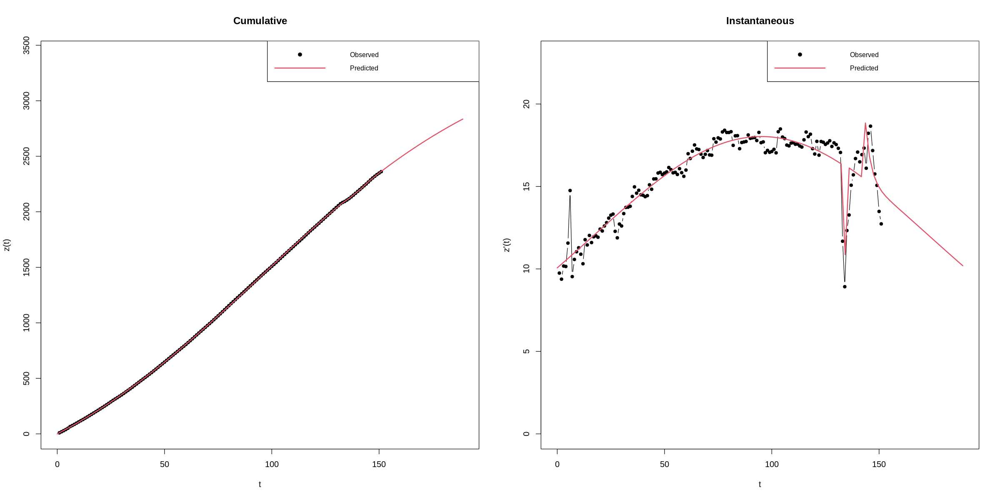

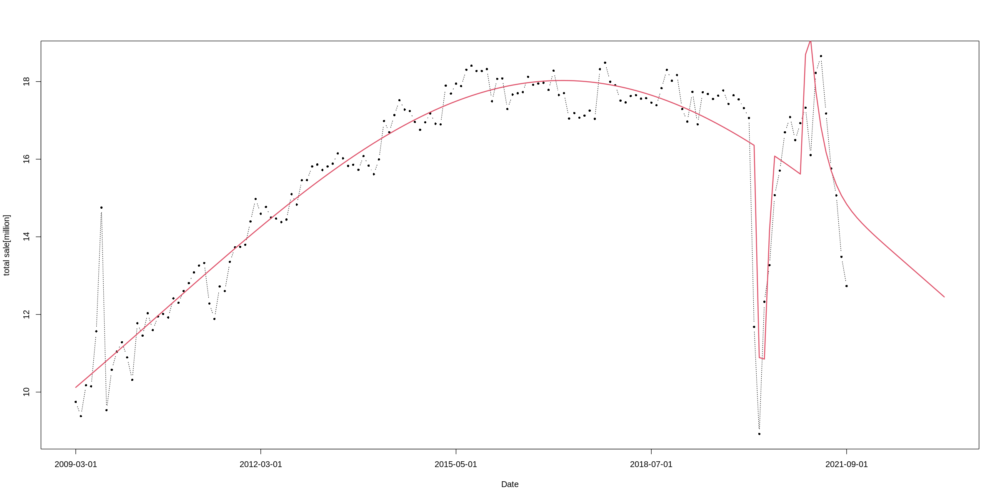

In [202]:
######GBMe1
name= n21
GBMe2<- GBM(name,shock = "mixed",nshock = 2,prelimestimates = c(3.529995e+03, 2.847066e-03, 1.412257e-02,145,-0.1,0.1,125,140,0.2))
summary(GBMe2)

pred_GBMe2<- predict(GBMe2, newx=c(1:170))
pred_GBMe2.inst<- make.instantaneous(pred_GBMe2)

plot(n21, type= "b",ylab="total sale[million]", xlab="Date", pch=16, lty=3, xaxt="n", cex=0.6,xlim=c(1,170))
axis(1, at=c(1,as.integer(length(t21)/4), as.integer(length(t21)/2), as.integer(length(t21)*3/4), as.integer(length(t21))), labels=s21$DATE[c(1,as.integer(length(t21)/4), as.integer(length(t21)/2), as.integer(length(t21)*3/4), as.integer(length(t21)))])
lines(pred_GBMe2.inst, lwd=2, col=2)

In [203]:
rmse(n21,fitted(GBMe2))

[1] 1313.313

Call: ( Generalized Bass model with 2  Mixed  shock )

  GBM(series = name, shock = "mixed", nshock = 2, prelimestimates = c(3529.995, 
    0.002847066, 0.01412257, 130, -0.1, 0.2, 140, 150, 0.3))

Residuals:
      Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
-4.001646 -1.397917  0.061296  0.000351  0.974606  5.951712 

Coefficients:
           Estimate    Std.Error         Lower        Upper   p-value    
m     3.559484e+03 1.429530e+01  3.531466e+03 3.587502e+03 2.03e-189 ***
p     2.826304e-03 7.807453e-06  2.811001e-03 2.841606e-03 1.85e-212 ***
q     1.403495e-02 6.670786e-05  1.390421e-02 1.416570e-02 4.66e-179 ***
a1    1.330000e+02 7.473700e-01  1.315352e+02 1.344648e+02 9.03e-169 ***
b1   -1.916842e-01 2.535352e-01 -6.886042e-01 3.052357e-01  4.51e-01    
c1   -3.516884e-01 1.831163e-01 -7.105898e-01 7.213071e-03  5.68e-02   .
a2    1.364635e+02 1.118421e+00  1.342714e+02 1.386555e+02 1.19e-145 ***
b2    1.476574e+02 7.270681e-01  1.462324e+02 1.490824e+02 6.95e-177

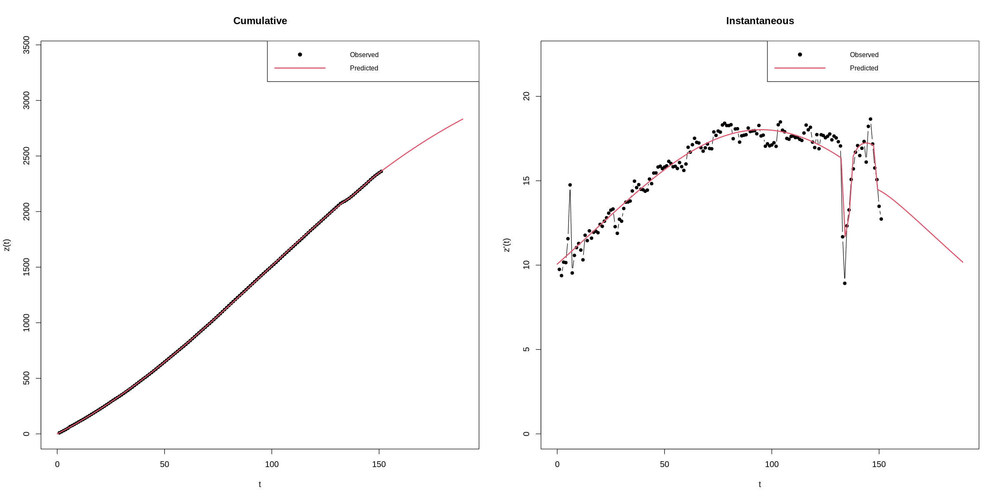

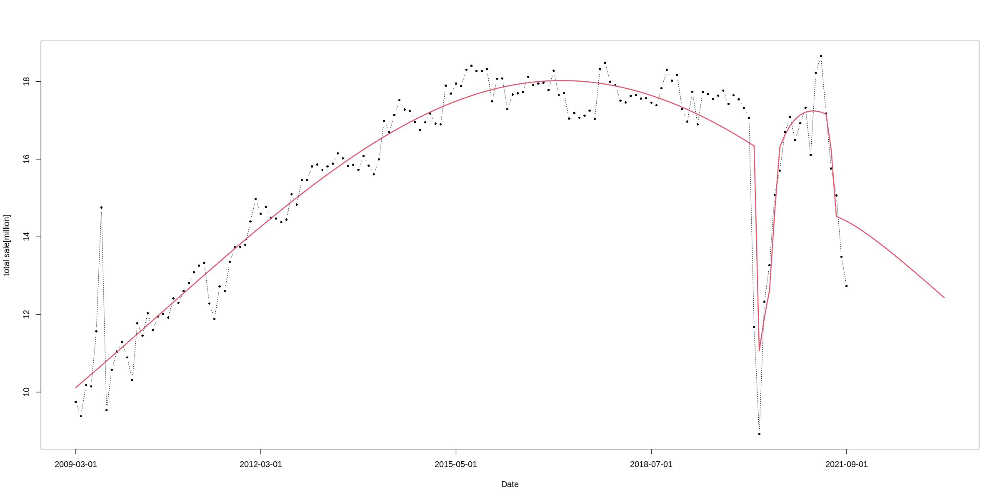

In [206]:
######GBMe1
name= n21
GBMe3<- GBM(name,shock = "mixed",nshock = 2,prelimestimates = c(3.529995e+03, 2.847066e-03, 1.412257e-02,130,-0.1,0.2,140,150,0.3))
summary(GBMe3)

pred_GBMe3<- predict(GBMe3, newx=c(1:170))
pred_GBMe3.inst<- make.instantaneous(pred_GBMe3)

plot(n21, type= "b",ylab="total sale[million]", xlab="Date", pch=16, lty=3, xaxt="n", cex=0.6,xlim=c(1,170))
axis(1, at=c(1,as.integer(length(t21)/4), as.integer(length(t21)/2), as.integer(length(t21)*3/4), as.integer(length(t21))), labels=s21$DATE[c(1,as.integer(length(t21)/4), as.integer(length(t21)/2), as.integer(length(t21)*3/4), as.integer(length(t21)))])
lines(pred_GBMe3.inst, lwd=2, col=2)

In [207]:
rmse(n21,fitted(GBMe3))

[1] 1313.313

Call: ( Guseo Guidolin Model )

  GGM(series = name, prelimestimates = c(3529.995, 0.01, 0.1, 0.002847066, 
    0.01412257))

Residuals:
      Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
-10.56015  -1.55674  -0.01824   0.01884   1.82606   8.53767 

Coefficients:
           Estimate    Std.Error         Lower        Upper   p-value    
K     3.530138e+03 1.259811e+01  3.505446e+03 3.554830e+03 2.66e-201 ***
pc    2.322658e+00 1.014097e+01 -1.755327e+01 2.219859e+01  8.19e-01    
qc   -1.480338e+00 1.299701e+01 -2.695401e+01 2.399334e+01  9.09e-01    
ps    2.847034e-03 6.014884e-06  2.835245e-03 2.858823e-03 1.67e-234 ***
qs    1.412162e-02 7.408986e-05  1.397640e-02 1.426683e-02 6.20e-177 ***
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  3.243899  on  146  degrees of freedom
 Multiple R-squared:   0.99998  Residual sum of squares:  1536.341


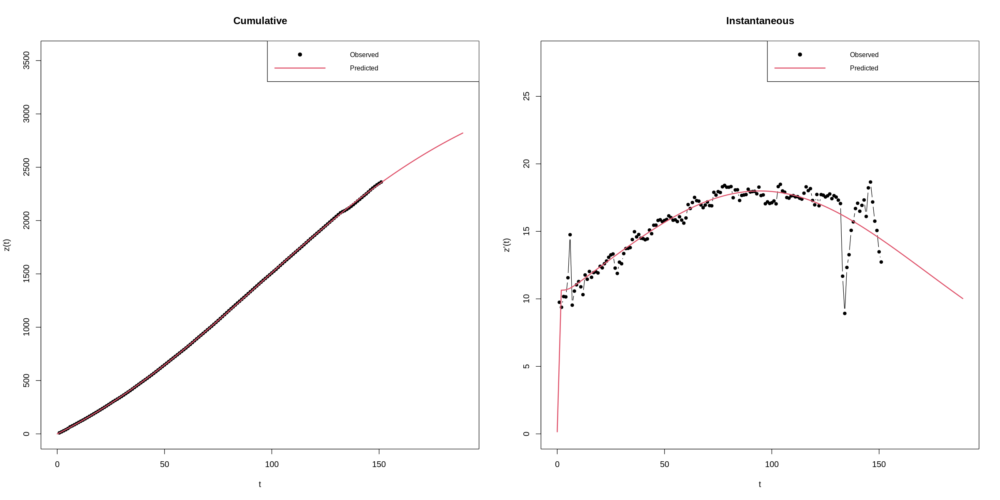

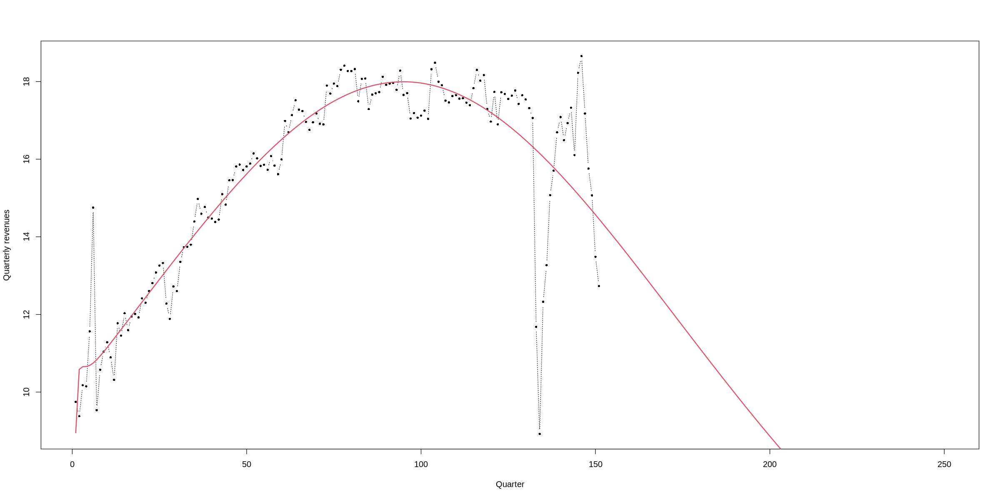

In [ ]:
######GGM
GGM<- GGM(name, prelimestimates=c(3.529995e+03, 0.01, 0.1, 2.847066e-03, 1.412257e-02))
summary(GGM)

pred_GGM<- predict(GGM, newx=c(1:250))
pred_GGM.inst<- make.instantaneous(pred_GGM)

plot(name, type= "b",xlab="Quarter", ylab="Quarterly revenues",  pch=16, lty=3, cex=0.6, xlim=c(1,250))
lines(pred_GGM.inst, lwd=2, col=2)
#lines(pred.inst, lwd=2, col=3)

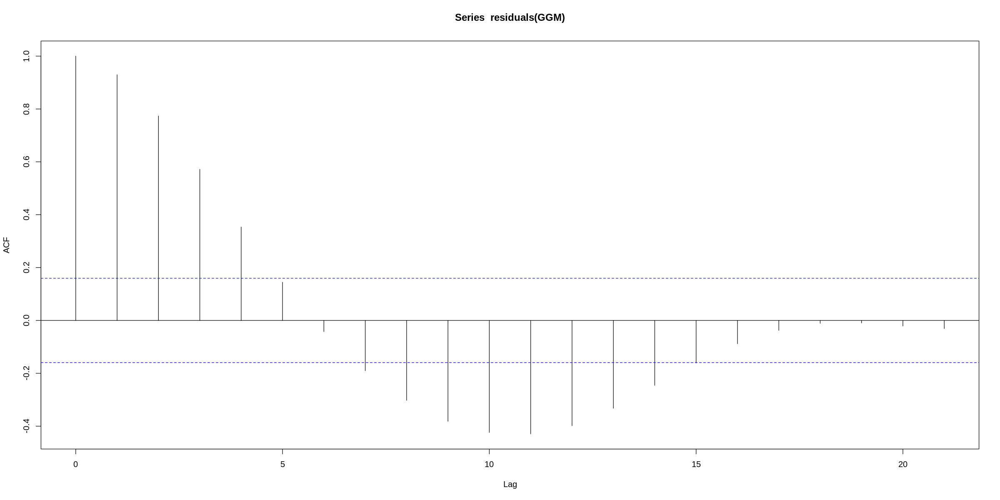

In [ ]:
###Analysis of residuals
res_GGM<- residuals(GGM)
acf<- acf(residuals(GGM))


fit_GGM<- fitted(GGM)
fit_GGM_inst<- make.instantaneous(fit_GGM)

#Arima


In [ ]:
install.packages("fpp2")
install.packages("forecast")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘expsmooth’, ‘fma’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:

library(fpp2)
library(forecast)
library(lmtest)
?fpp2

── Attaching packages ────────────────────────────────────────────── fpp2 2.5 ──

✔ fma       2.5     ✔ expsmooth 2.3





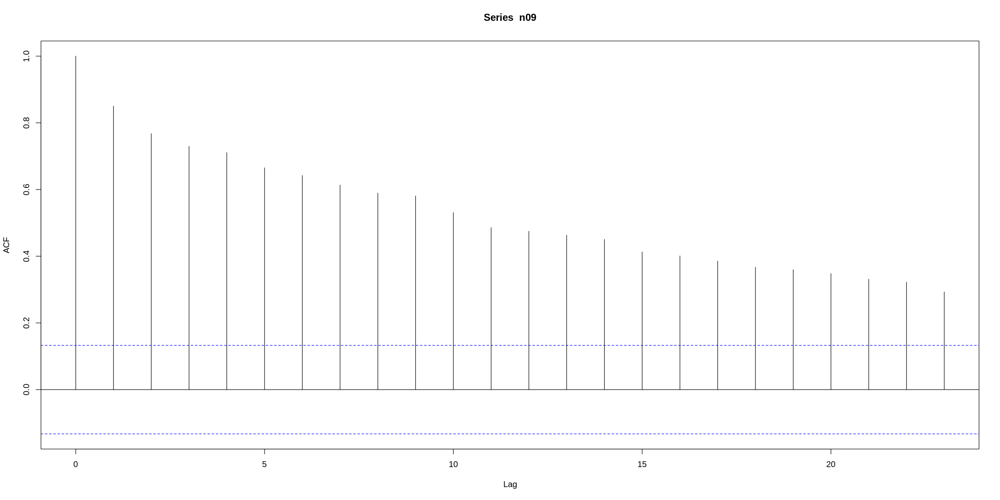

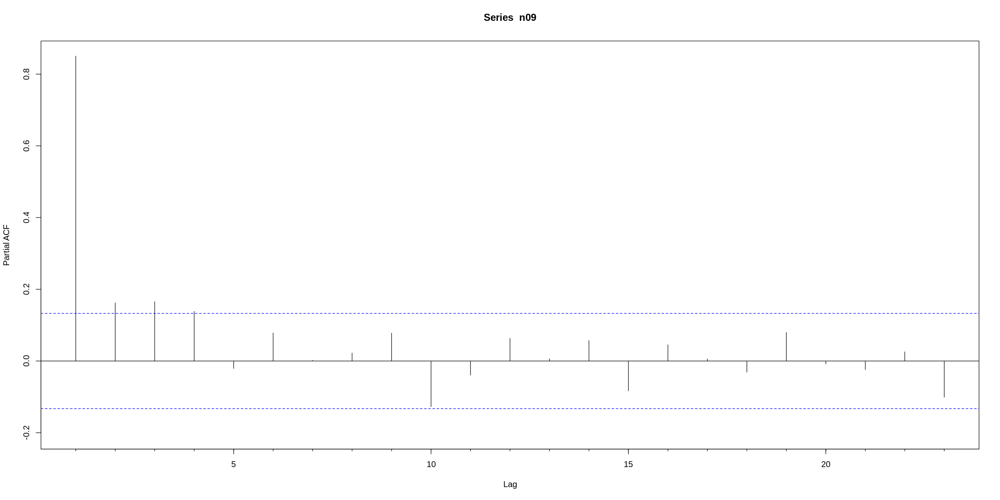

In [ ]:
acf(n09)
Pacf(n09)

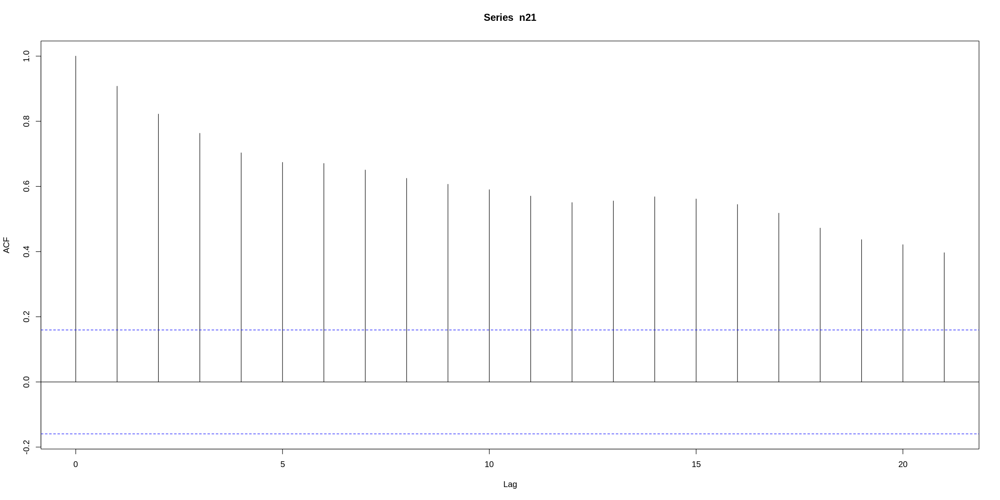

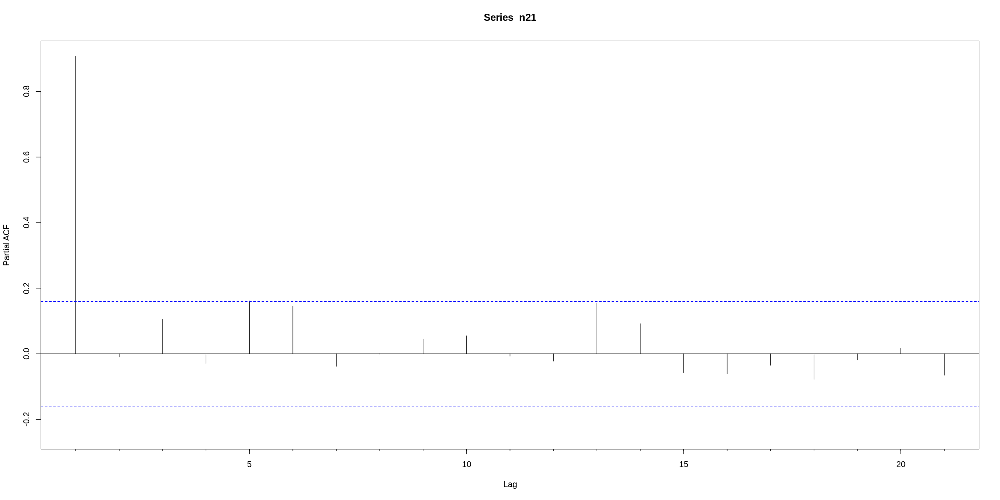

In [ ]:
acf(n21)
Pacf(n21)

##09

In [ ]:
name=n09
my_ts <- ts(name, frequency=12)
auto.a<- auto.arima(my_ts,trace=TRUE,max.p = 5, max.q = 5,max.d = 5,start.p = 0, start.q = 0)
auto.a


 Fitting models using approximations to speed things up...

 ARIMA(0,2,0)(1,0,1)[12]                    : 778.2223
 ARIMA(0,2,0)                               : 767.8775
 ARIMA(1,2,0)(1,0,0)[12]                    : 707.3718
 ARIMA(0,2,1)(0,0,1)[12]                    : 580.9856
 ARIMA(0,2,1)                               : 579.1678
 ARIMA(0,2,1)(1,0,0)[12]                    : 585.4415
 ARIMA(0,2,1)(1,0,1)[12]                    : Inf
 ARIMA(1,2,1)                               : 564.9261
 ARIMA(1,2,1)(1,0,0)[12]                    : Inf
 ARIMA(1,2,1)(0,0,1)[12]                    : 566.992
 ARIMA(1,2,1)(1,0,1)[12]                    : Inf
 ARIMA(1,2,0)                               : 696.0989
 ARIMA(2,2,1)                               : 550.9125
 ARIMA(2,2,1)(1,0,0)[12]                    : 559.1358
 ARIMA(2,2,1)(0,0,1)[12]                    : 552.9962
 ARIMA(2,2,1)(1,0,1)[12]                    : 559.4406
 ARIMA(2,2,0)                               : 662.3767
 ARIMA(3,2,1)       

Series: my_ts 
ARIMA(2,2,4) 

Coefficients:
          ar1      ar2      ma1      ma2      ma3     ma4
      -1.1504  -0.7186  -0.3214  -0.6983  -0.5144  0.6928
s.e.   0.0944   0.1249   0.0757   0.0570   0.1275  0.0668

sigma^2 = 0.6148:  log likelihood = -253.45
AIC=520.89   AICc=521.43   BIC=544.52

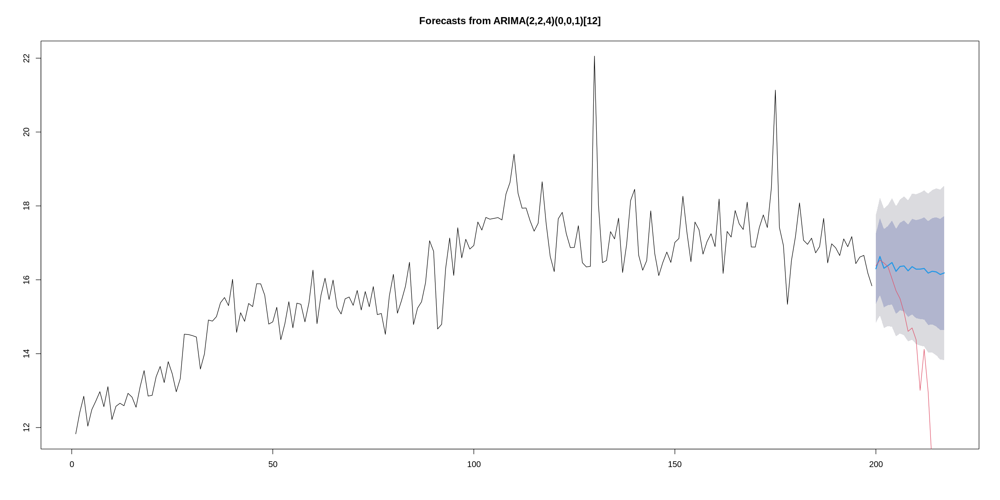

In [ ]:
hold <- window(ts(my_ts), start = 200)
fit_predicted <- arima(ts(my_ts[-c(200:218)]), order =c(2,2,4), seasonal = list(order = c(0,0,1), period = 12))
forecast_pred <- forecast(fit_predicted,h=18)
plot(forecast_pred)
lines(hold,col=2)

In [ ]:
rmse(name,fitted(auto.a))

[1] 0.7695433

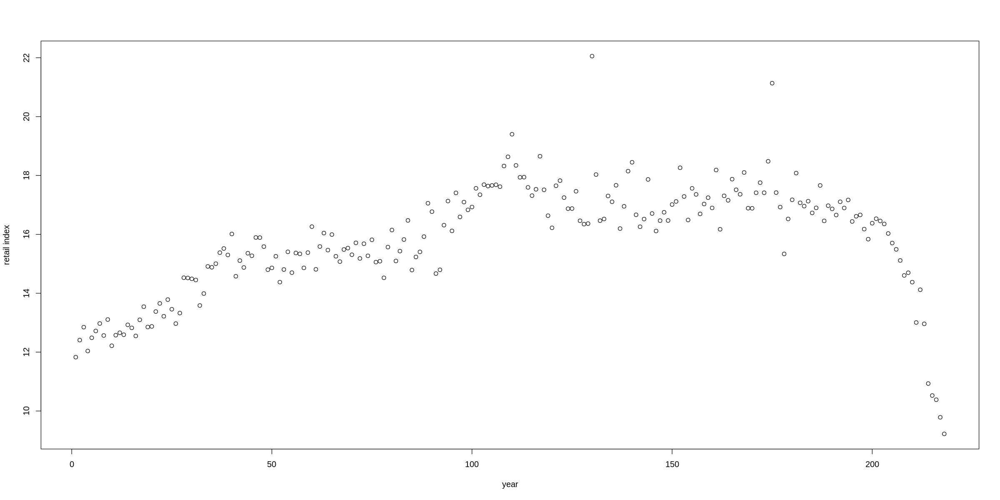

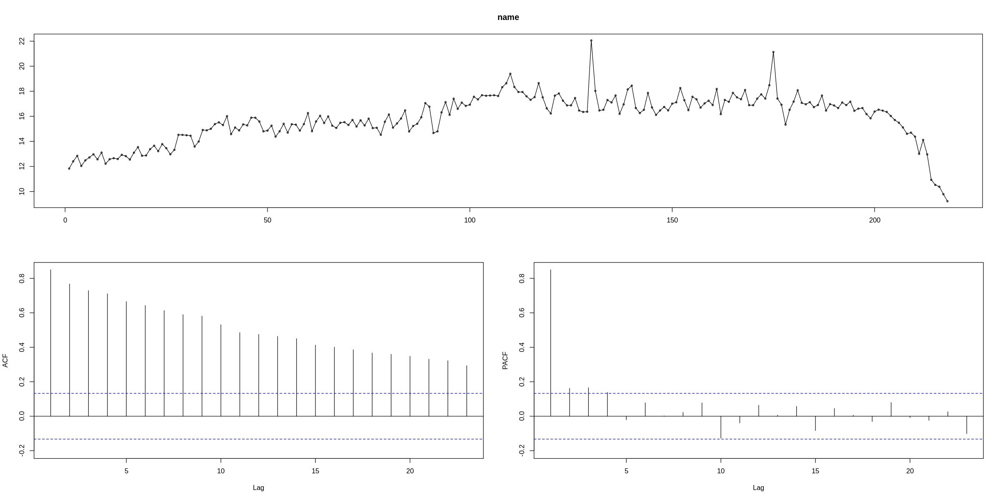

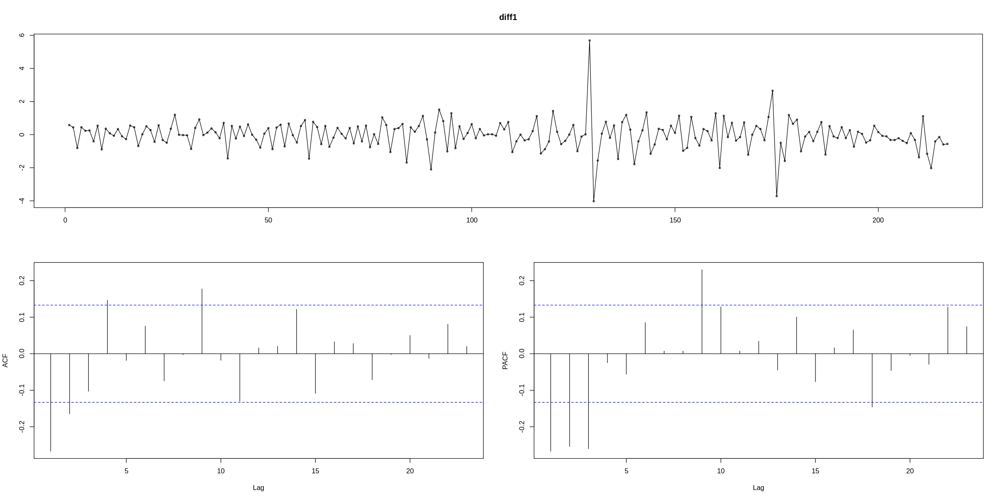

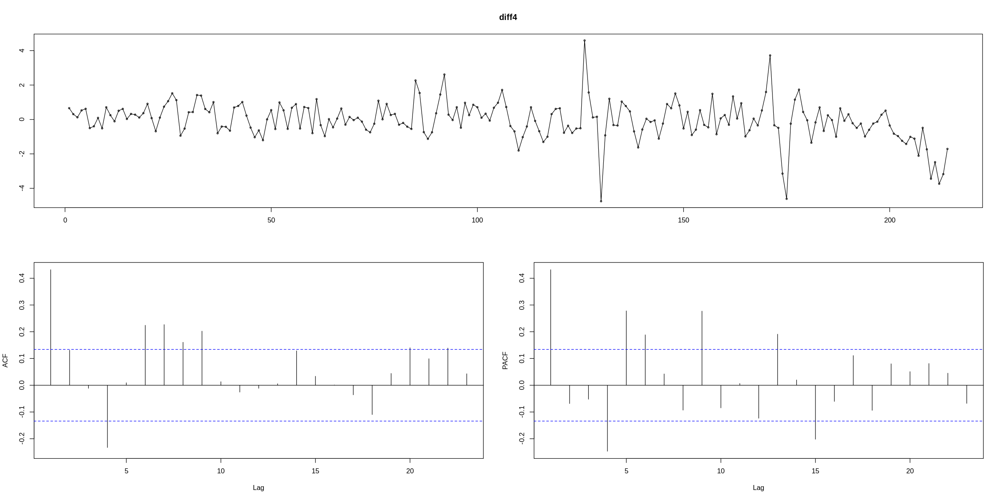

In [ ]:
plot(name, ylab="retail index",xlab="year")
tsdisplay(name)

diff1<- diff(name) ##first difference
diff4<- diff(name, lag=4) ###seasonal difference
tsdisplay(diff1)
tsdisplay(diff4)

##21


In [ ]:
name=n21
my_ts <- ts(name, frequency=12)
auto.a<- auto.arima(my_ts,trace=TRUE,max.p = 5, max.q = 5,max.d = 5,start.p = 0, start.q = 0)
auto.a


 Fitting models using approximations to speed things up...

 ARIMA(0,1,0)(1,0,1)[12] with drift         : 355.829
 ARIMA(0,1,0)            with drift         : 409.6042
 ARIMA(1,1,0)(1,0,0)[12] with drift         : 359.5016
 ARIMA(0,1,1)(0,0,1)[12] with drift         : 409.9317
 ARIMA(0,1,0)                               : 407.6175
 ARIMA(0,1,0)(0,0,1)[12] with drift         : 408.7043
 ARIMA(0,1,0)(1,0,0)[12] with drift         : 358.7591
 ARIMA(0,1,0)(2,0,1)[12] with drift         : 367.4658
 ARIMA(0,1,0)(1,0,2)[12] with drift         : 357.8444
 ARIMA(0,1,0)(0,0,2)[12] with drift         : 409.8783
 ARIMA(0,1,0)(2,0,0)[12] with drift         : 366.2984
 ARIMA(0,1,0)(2,0,2)[12] with drift         : 368.5331
 ARIMA(1,1,0)(1,0,1)[12] with drift         : 356.3821
 ARIMA(0,1,1)(1,0,1)[12] with drift         : 354.9427
 ARIMA(0,1,1)(1,0,0)[12] with drift         : 357.9616
 ARIMA(0,1,1)(2,0,1)[12] with drift         : 365.5064
 ARIMA(0,1,1)(1,0,2)[12] with drift         : 356.8367
 ARIM

Series: my_ts 
ARIMA(1,1,1)(1,0,1)[12] 

Coefficients:
          ar1     ma1    sar1     sma1
      -0.8140  0.8781  0.6577  -0.8531
s.e.   0.1326  0.1097  0.2784   0.2479

sigma^2 = 0.8371:  log likelihood = -198.83
AIC=407.67   AICc=408.09   BIC=422.72

In [ ]:
length(my_ts)

[1] 151

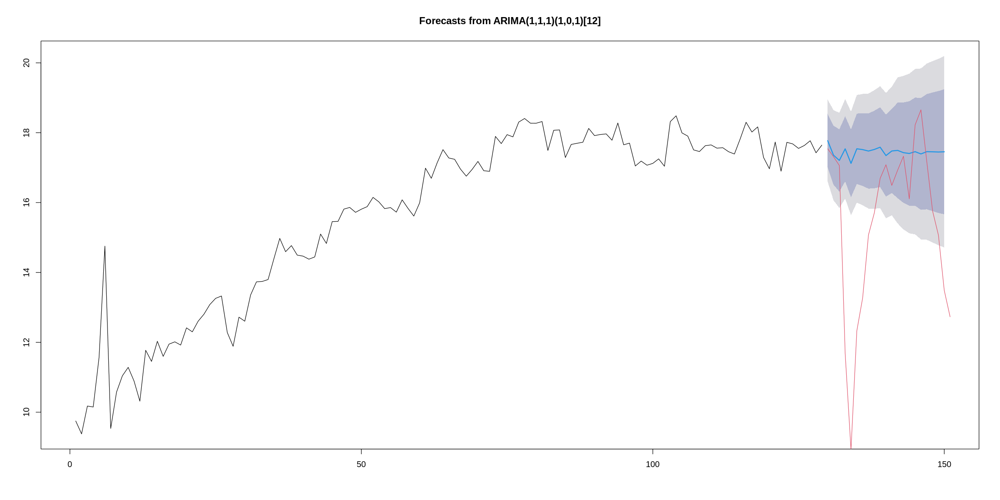

In [ ]:
hold <- window(ts(my_ts), start = 130)
fit_predicted <- arima(ts(my_ts[-c(130:151)]), order =c(1,1,1), seasonal = list(order = c(1,0,1), period = 12))
forecast_pred <- forecast(fit_predicted,h=21)
plot(forecast_pred)
lines(hold,col=2)

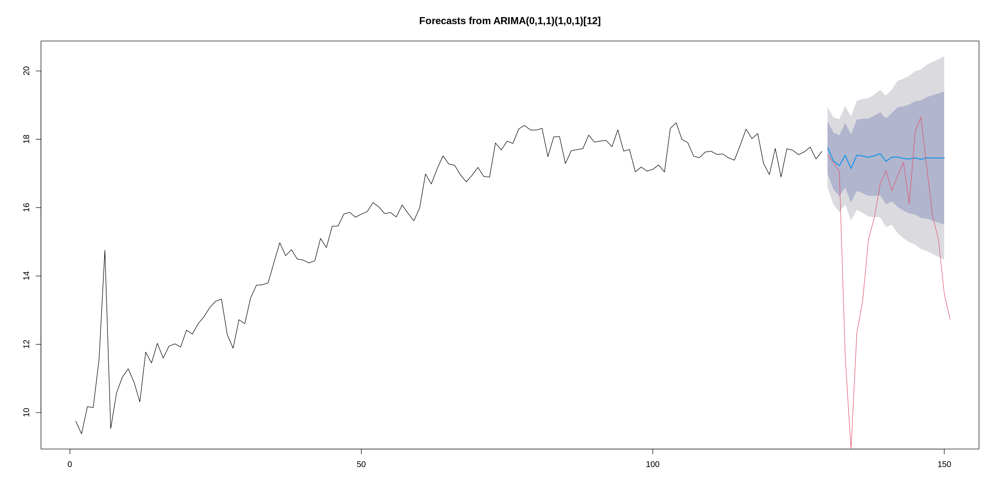

In [ ]:
hold <- window(ts(my_ts), start = 130)
fit_predicted <- arima(ts(my_ts[-c(130:151)]), order =c(0,1,1), seasonal = list(order = c(1,0,1), period = 12))
forecast_pred <- forecast(fit_predicted,h=21)
plot(forecast_pred)
lines(hold,col=2)

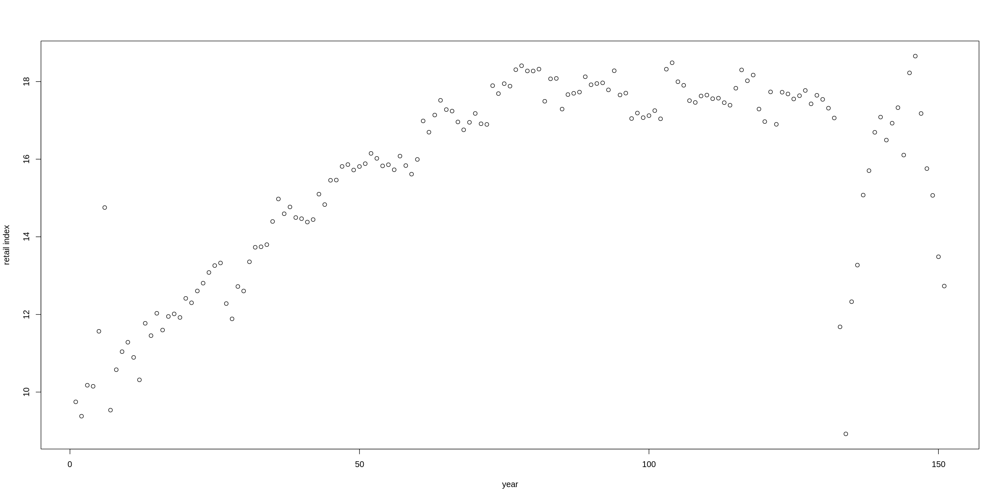

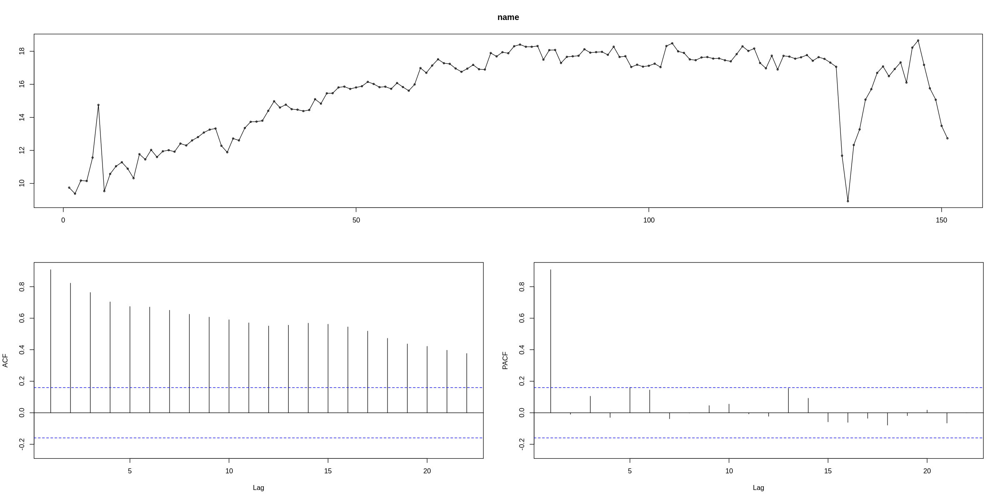

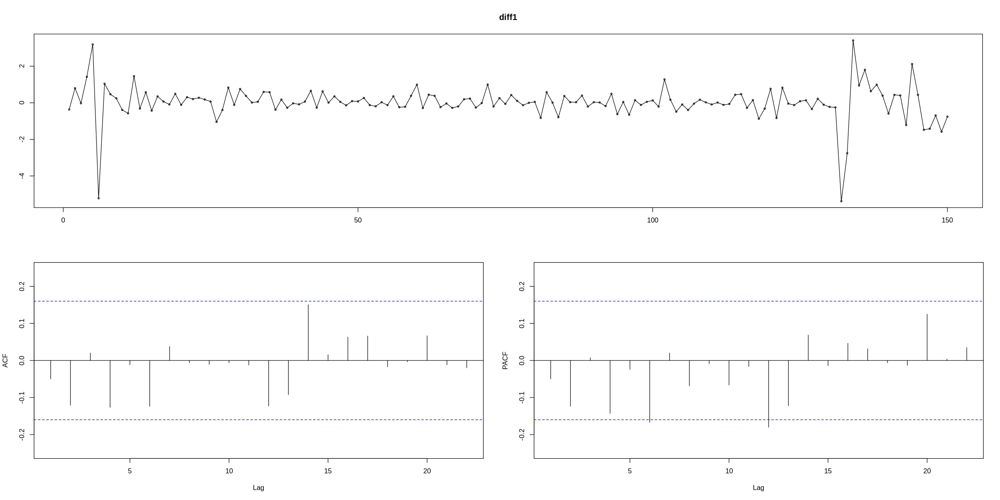

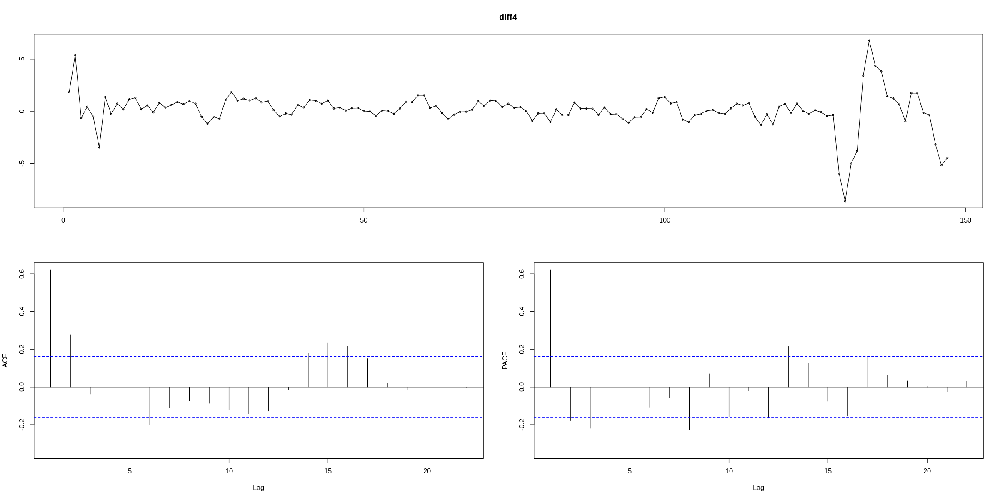

In [ ]:
plot(name, ylab="retail index",xlab="year")
tsdisplay(name)

diff1<- diff(name) ##first difference
diff4<- diff(name, lag=4) ###seasonal difference
tsdisplay(diff1)
tsdisplay(diff4)

#tslm

##09



In [ ]:
name=n09
my_ts <- ts(name, frequency=12)


Call:
tslm(formula = my_ts ~ trend + season)

Residuals:
    Min      1Q  Median      3Q     Max 
-7.6844 -0.5475  0.1793  0.8694  5.9109 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 14.07440    0.45469  30.954  < 2e-16 ***
trend        0.01260    0.00190   6.629 2.94e-10 ***
season2      0.08672    0.57242   0.151    0.880    
season3      0.49114    0.58036   0.846    0.398    
season4      0.42988    0.58034   0.741    0.460    
season5      0.48667    0.58032   0.839    0.403    
season6      0.47074    0.58031   0.811    0.418    
season7      0.48808    0.58031   0.841    0.401    
season8      0.42549    0.58031   0.733    0.464    
season9      0.41233    0.58032   0.711    0.478    
season10     0.43201    0.58034   0.744    0.457    
season11     0.24608    0.58036   0.424    0.672    
season12     0.45537    0.58039   0.785    0.434    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.764 on 2


	Durbin-Watson test

data:  fitts
DW = 0.27325, p-value < 2.2e-16
alternative hypothesis: true autocorrelation is greater than 0


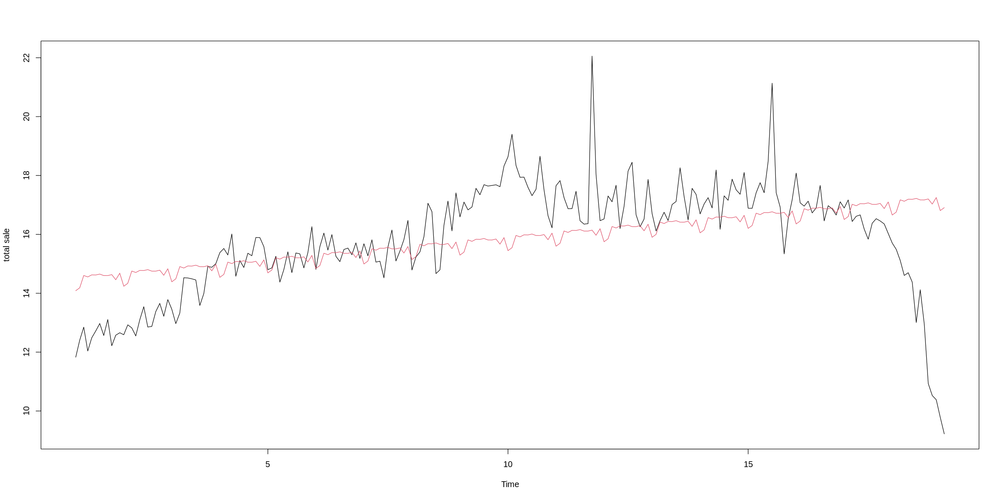

In [ ]:
## we fit a linear model with the tslm function
fitts<- tslm(my_ts~trend+season)

###obviously it gives the same results of the first model
summary(fitts)

dwtest(fitts)

plot(my_ts, ylab="total sale", xlab="Time")
lines(fitted(fitts), col=2)

In [ ]:
AIC(fitts)

[1] 880.7936

In [ ]:
install.packages('Metrics')
library(Metrics)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)


Attaching package: ‘Metrics’


The following object is masked from ‘package:forecast’:

    accuracy




In [ ]:
rmse(name,fitted(fitts))

[1] 1.710884

##21

In [ ]:
name=n21
my_ts <- ts(name, frequency=12)


Call:
tslm(formula = my_ts ~ trend + season)

Residuals:
    Min      1Q  Median      3Q     Max 
-8.3550 -1.1548  0.4993  1.2365  2.7123 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) 12.683431   0.614729  20.633   <2e-16 ***
trend        0.036554   0.003716   9.836   <2e-16 ***
season2     -0.303631   0.780125  -0.389    0.698    
season3     -0.078569   0.780152  -0.101    0.920    
season4     -0.171122   0.780196  -0.219    0.827    
season5      0.097324   0.780258   0.125    0.901    
season6      0.193155   0.780338   0.248    0.805    
season7     -0.010476   0.780435  -0.013    0.989    
season8      0.575184   0.796212   0.722    0.471    
season9      0.560463   0.796238   0.704    0.483    
season10     0.577576   0.796281   0.725    0.469    
season11     0.468356   0.796342   0.588    0.557    
season12     0.340219   0.796420   0.427    0.670    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard err


	Durbin-Watson test

data:  fitts
DW = 0.23826, p-value < 2.2e-16
alternative hypothesis: true autocorrelation is greater than 0


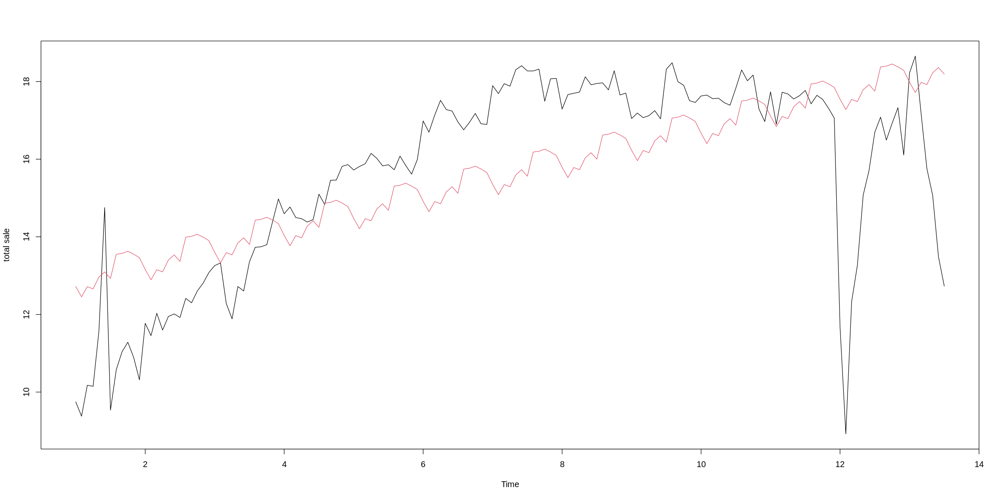

In [ ]:
## we fit a linear model with the tslm function
fitts<- tslm(my_ts~trend+season)

###obviously it gives the same results of the first model
summary(fitts)

dwtest(fitts)

plot(my_ts, ylab="total sale", xlab="Time")
lines(fitted(fitts), col=2)

##total



In [ ]:
name=n_train
my_ts <- ts(name, frequency=12)


Call:
tslm(formula = my_ts ~ trend + season)

Residuals:
    Min      1Q  Median      3Q     Max 
-7.3926 -1.1012  0.5625  1.4172  6.9769 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) 13.640963   0.340213  40.095   <2e-16 ***
trend        0.005241   0.000538   9.742   <2e-16 ***
season2      0.012988   0.430263   0.030    0.976    
season3     -0.040940   0.430264  -0.095    0.924    
season4     -0.113619   0.430265  -0.264    0.792    
season5     -0.089423   0.430268  -0.208    0.835    
season6     -0.122755   0.432545  -0.284    0.777    
season7      0.025472   0.432545   0.059    0.953    
season8      0.183891   0.432545   0.425    0.671    
season9      0.201075   0.432546   0.465    0.642    
season10    -0.058187   0.432548  -0.135    0.893    
season11    -0.106535   0.432550  -0.246    0.806    
season12     0.129735   0.432553   0.300    0.764    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard err


	Durbin-Watson test

data:  fitts
DW = 0.23586, p-value < 2.2e-16
alternative hypothesis: true autocorrelation is greater than 0


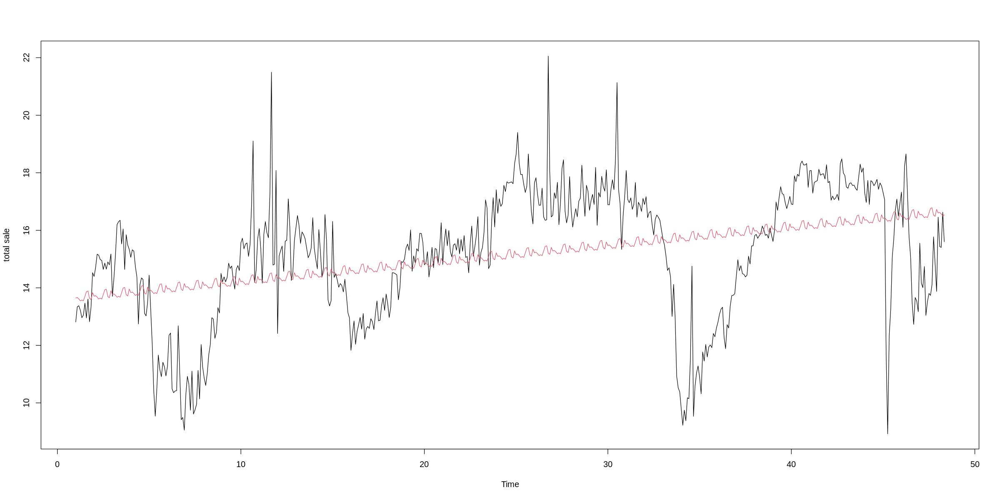

In [ ]:
## we fit a linear model with the tslm function
fitts<- tslm(my_ts~trend+season)

###obviously it gives the same results of the first model
summary(fitts)

dwtest(fitts)

plot(my_ts, ylab="total sale", xlab="Time")
lines(fitted(fitts), col=2)

In [ ]:
rmse(name,fitted(fitts))

[1] 2.083628

In [ ]:
AIC(fitts)

[1] 2478.17

##partial



In [66]:
t_train_p

[1]  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25
[26] 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50
[51] 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75
[76] 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96

In [112]:
name = n_train_p

name_little = n_train_p[-c(86:96)]
name_test = n_train_p[c(86:96)]


my_ts_little <- ts(name_little, frequency = 12)
my_ts<-ts(name, frequency = 12)
my_ts_test <- ts(name_test, frequency = 12)


Call:
tslm(formula = my_ts ~ trend + season)

Residuals:
    Min      1Q  Median      3Q     Max 
-1.9772 -0.4669 -0.0847  0.3450  4.4997 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) 17.438795   0.371086  46.994   <2e-16 ***
trend       -0.005042   0.003551  -1.420    0.159    
season2      0.124417   0.478324   0.260    0.795    
season3     -0.009792   0.478364  -0.020    0.984    
season4      0.035625   0.478430   0.074    0.941    
season5     -0.029458   0.478522  -0.062    0.951    
season6      0.044084   0.478640   0.092    0.927    
season7      0.662875   0.478785   1.384    0.170    
season8      0.221292   0.478956   0.462    0.645    
season9      0.119334   0.479154   0.249    0.804    
season10     0.287876   0.479377   0.601    0.550    
season11    -0.057708   0.479627  -0.120    0.905    
season12     0.160334   0.479903   0.334    0.739    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard err


	Durbin-Watson test

data:  fitts
DW = 1.5076, p-value = 0.01029
alternative hypothesis: true autocorrelation is greater than 0


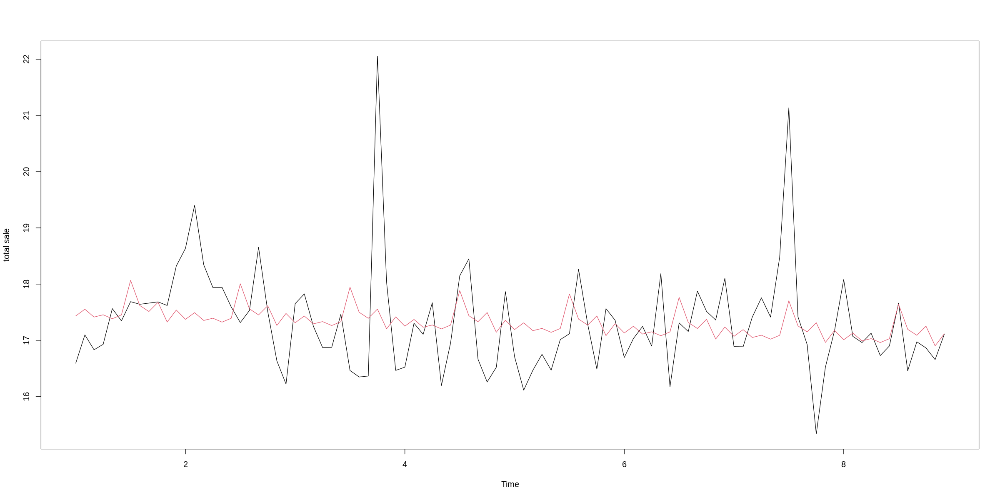

In [109]:
## we fit a linear model with the tslm function
fitts<- tslm(my_ts~trend+season)

###obviously it gives the same results of the first model
summary(fitts)

dwtest(fitts)

plot(my_ts, ylab="total sale", xlab="Time")
lines(fitted(fitts), col=2)

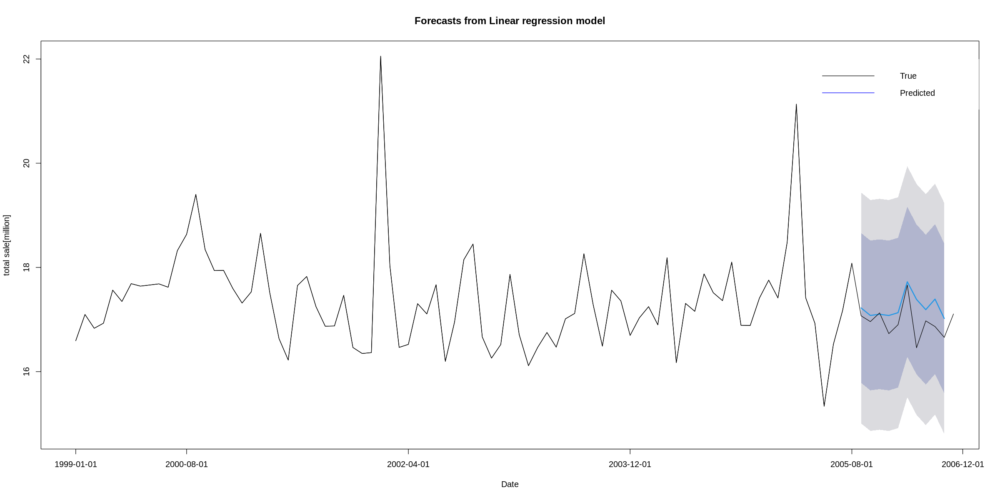

In [110]:
hold <- window(ts(my_ts), start = 86)
fit_predicted <- tslm(my_ts_little~trend+season)
forecast_pred <- forecast(fit_predicted,h=10)

plot(forecast_pred,ylab="total sale[million]", xlab="Date",xaxt='n')
axis(1, at=c(1,2,4,6,8,9), labels=train_partial$DATE[c(1,20,40,60,80,96)])
legend(7.5, 22, legend=c("True", "Predicted"),
       col=c('black', 'blue'), lty=1, cex=1,box.lty=0)
lines(my_ts, col=1)



In [100]:
install.packages('Metrics')
library(Metrics)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [111]:
fitted(fitts)

,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
1,17.43375,17.55313,17.41388,17.45425,17.38413,17.45263,18.06638,17.61975,17.51275,17.67625,17.32563,17.53863
2,17.37325,17.49263,17.35338,17.39375,17.32363,17.39213,18.00588,17.55925,17.45225,17.61575,17.26513,17.47813
3,17.31275,17.43213,17.29288,17.33325,17.26313,17.33163,17.94538,17.49875,17.39175,17.55525,17.20463,17.41763
4,17.25225,17.37163,17.23238,17.27275,17.20263,17.27113,17.88488,17.43825,17.33125,17.49475,17.14413,17.35713
5,17.19175,17.31112,17.17187,17.21225,17.14212,17.21062,17.82437,17.37775,17.27075,17.43425,17.08362,17.29662
6,17.13125,17.25062,17.11137,17.15175,17.08162,17.15012,17.76387,17.31725,17.21025,17.37375,17.02312,17.23612
7,17.07075,17.19012,17.05087,17.09125,17.02112,17.08962,17.70337,17.25675,17.14975,17.31325,16.96262,17.17562
8,17.01025,17.12962,16.99037,17.03075,16.96062,17.02912,17.64287,17.19625,17.08925,17.25275,16.90212,17.11512


In [113]:
rmse(name,fitted(fitts))

[1] 0.8894955

In [114]:
AIC(fitts)

[1] 277.9528

##partial2



In [21]:
t_train_p2

[1]  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25
[26] 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50
[51] 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74

In [103]:
name = n_train_p2

name_little = n_train_p2[-c(64:74)]
name_test = n_train_p2[c(64:74)]

my_ts_little <- ts(name_little, frequency = 12)
my_ts<-ts(name, frequency = 12)
my_ts_test <- ts(name_test, frequency = 12)


Call:
tslm(formula = my_ts ~ trend + season)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.39305 -0.29588 -0.04333  0.34225  0.97684 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) 17.001839   0.217742  78.082   <2e-16 ***
trend        0.005213   0.002783   1.873   0.0659 .  
season2     -0.034213   0.271336  -0.126   0.9001    
season3      0.255637   0.282620   0.905   0.3693    
season4      0.118424   0.282524   0.419   0.6766    
season5      0.337711   0.282456   1.196   0.2365    
season6      0.393499   0.282415   1.393   0.1686    
season7      0.465786   0.282401   1.649   0.1042    
season8      0.404740   0.282415   1.433   0.1569    
season9      0.644360   0.282456   2.281   0.0260 *  
season10     0.656647   0.282524   2.324   0.0235 *  
season11     0.570101   0.282620   2.017   0.0481 *  
season12     0.538888   0.282743   1.906   0.0614 .  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual st


	Durbin-Watson test

data:  fitts
DW = 0.68288, p-value = 9.559e-10
alternative hypothesis: true autocorrelation is greater than 0


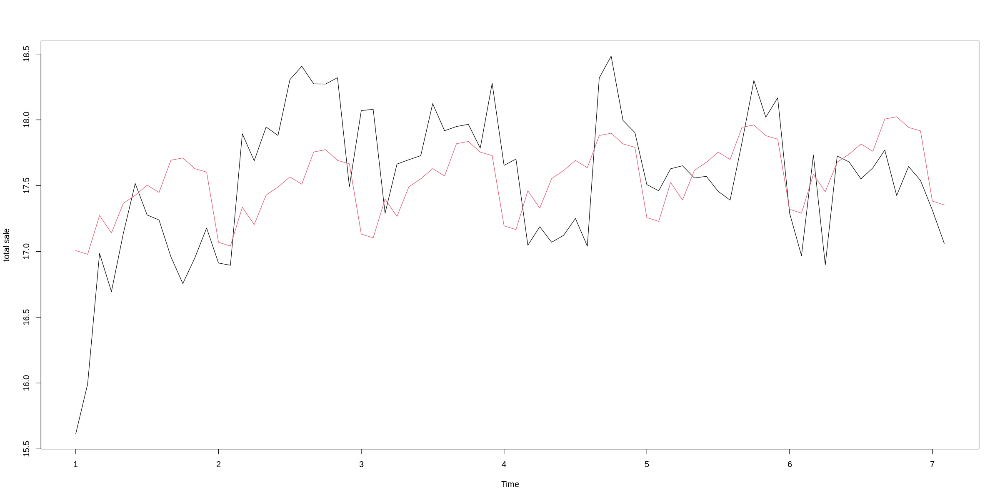

In [104]:
## we fit a linear model with the tslm function
fitts<- tslm(my_ts~trend+season)

###obviously it gives the same results of the first model
summary(fitts)

dwtest(fitts)

plot(my_ts, ylab="total sale", xlab="Time")
lines(fitted(fitts), col=2)

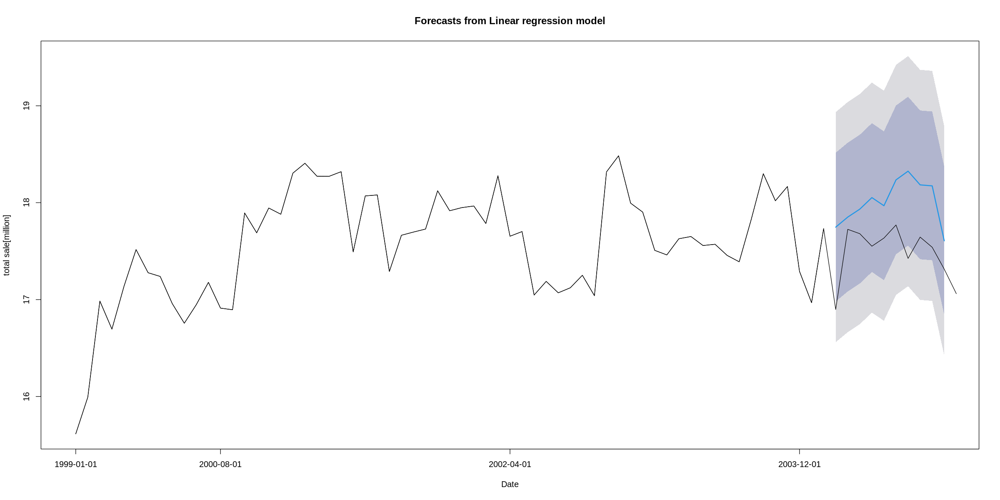

In [105]:

hold <- window(ts(my_ts), start = 64)
fit_predicted <- tslm(my_ts_little~trend+season)
forecast_pred <- forecast(fit_predicted,h=10)
# plot(forecast_pred)
# line(my_ts_little)
plot(forecast_pred,ylab="total sale[million]", xlab="Date",xaxt='n')
axis(1, at=c(1,2,4,6,8,9), labels=train_partial$DATE[c(1,20,40,60,80,96)])
legend(7.5, 22, legend=c("True", "Predicted"),
       col=c('black', 'blue'), lty=1, cex=1,box.lty=0)
lines(my_ts, col=1)



In [106]:
rmse(name,fitted(fitts))

[1] 0.460859

In [107]:
AIC(fitts)

[1] 123.3527

#Lm



In [ ]:
name=n_train



Call:
lm(formula = name ~ t_train)

Residuals:
    Min      1Q  Median      3Q     Max 
-7.5076 -1.1541  0.5426  1.4093  7.1765 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) 1.364e+01  1.755e-01  77.743   <2e-16 ***
t_train     5.241e-03  5.335e-04   9.824   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 2.09 on 567 degrees of freedom
Multiple R-squared:  0.1455,	Adjusted R-squared:  0.144 
F-statistic: 96.52 on 1 and 567 DF,  p-value: < 2.2e-16



	Durbin-Watson test

data:  fitts
DW = 0.23895, p-value < 2.2e-16
alternative hypothesis: true autocorrelation is greater than 0


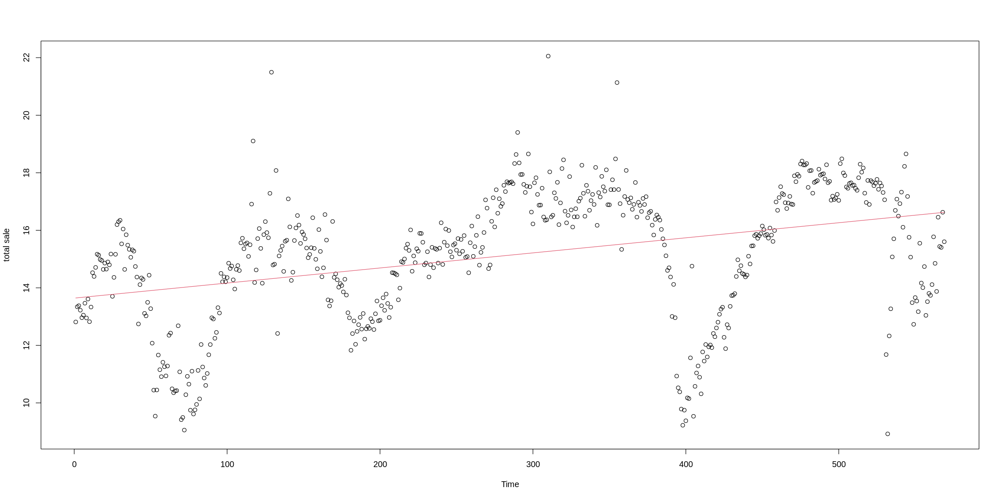

In [ ]:
## we fit a linear model with the tslm function
fitts<- lm(name~t_train)

###obviously it gives the same results of the first model
summary(fitts)

dwtest(fitts)

plot(name, ylab="total sale", xlab="Time")
lines(fitted(fitts), col=2)

In [ ]:
rmse(name,fitted(fitts))

[1] 2.086495

In [ ]:
AIC(fitts)

[1] 2457.735

#foecaste total


[1] 569

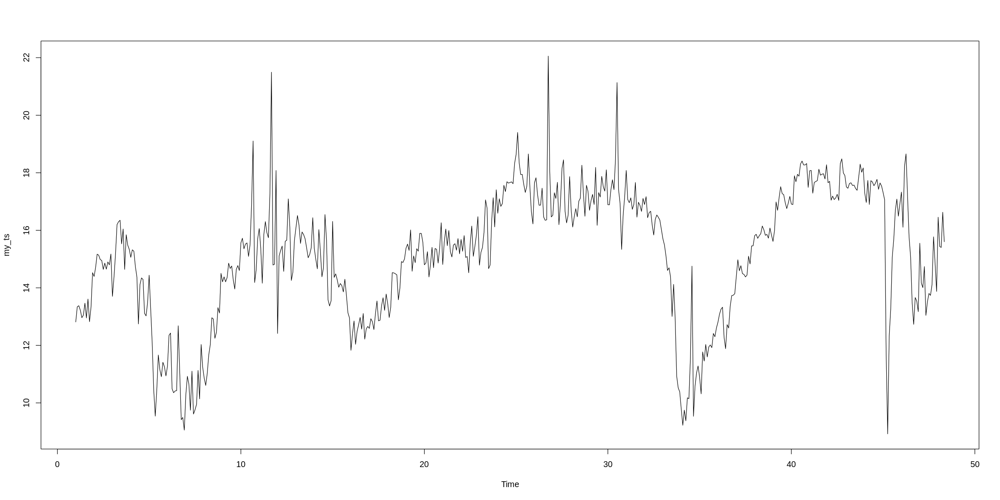

In [82]:
name=n_train
my_ts <- ts(name, frequency = 12)
plot(my_ts)
length(my_ts)

In [83]:
auto.a<- auto.arima(ts(my_ts[-c(550:569)],frequency = 12),trace=TRUE,max.p = 10, max.q = 10,max.d = 5,start.p = 0, start.q = 0)
auto.a


 Fitting models using approximations to speed things up...

 ARIMA(0,1,0)(1,0,1)[12] with drift         : 1584.876
 ARIMA(0,1,0)            with drift         : 1575.538
 ARIMA(1,1,0)(1,0,0)[12] with drift         : 1556.167
 ARIMA(0,1,1)(0,0,1)[12] with drift         : 1519.476
 ARIMA(0,1,0)                               : 1573.523
 ARIMA(0,1,1)            with drift         : 1518.478
 ARIMA(0,1,1)(1,0,0)[12] with drift         : 1527.934
 ARIMA(0,1,1)(1,0,1)[12] with drift         : 1529.561
 ARIMA(1,1,1)            with drift         : 1502.484
 ARIMA(1,1,1)(1,0,0)[12] with drift         : 1510.037
 ARIMA(1,1,1)(0,0,1)[12] with drift         : 1502.12
 ARIMA(1,1,1)(1,0,1)[12] with drift         : 1511.666
 ARIMA(1,1,1)(0,0,2)[12] with drift         : 1501.032
 ARIMA(1,1,1)(1,0,2)[12] with drift         : 1510.938
 ARIMA(0,1,1)(0,0,2)[12] with drift         : 1518.496
 ARIMA(1,1,0)(0,0,2)[12] with drift         : 1546.318
 ARIMA(2,1,1)(0,0,2)[12] with drift         : 1500.768
 ARIM

Series: ts(my_ts[-c(550:569)], frequency = 12) 
ARIMA(0,1,2)(0,0,2)[12] 

Coefficients:
          ma1      ma2    sma1     sma2
      -0.3426  -0.2143  0.0637  -0.0819
s.e.   0.0419   0.0425  0.0438   0.0462

sigma^2 = 0.8856:  log likelihood = -742.54
AIC=1495.08   AICc=1495.19   BIC=1516.61

In [84]:
auto.a<- auto.arima(my_ts,trace=TRUE,max.p = 10, max.q = 10,max.d = 5,start.p = 0, start.q = 0)
auto.a


 Fitting models using approximations to speed things up...

 ARIMA(0,1,0)(1,0,1)[12] with drift         : 1645.981
 ARIMA(0,1,0)            with drift         : 1639.302
 ARIMA(1,1,0)(1,0,0)[12] with drift         : 1613.969
 ARIMA(0,1,1)(0,0,1)[12] with drift         : 1573.774
 ARIMA(0,1,0)                               : 1637.301
 ARIMA(0,1,1)            with drift         : 1573.737
 ARIMA(0,1,1)(1,0,0)[12] with drift         : 1582.331
 ARIMA(0,1,1)(1,0,1)[12] with drift         : 1583.919
 ARIMA(1,1,1)            with drift         : 1558.881
 ARIMA(1,1,1)(1,0,0)[12] with drift         : 1565.334
 ARIMA(1,1,1)(0,0,1)[12] with drift         : 1557.313
 ARIMA(1,1,1)(1,0,1)[12] with drift         : 1567.006
 ARIMA(1,1,1)(0,0,2)[12] with drift         : 1557.778
 ARIMA(1,1,1)(1,0,2)[12] with drift         : 1567.423
 ARIMA(1,1,0)(0,0,1)[12] with drift         : 1604.604
 ARIMA(2,1,1)(0,0,1)[12] with drift         : 1557.563
 ARIMA(1,1,2)(0,0,1)[12] with drift         : 1555.429
 ARI

Series: my_ts 
ARIMA(0,1,2)(0,0,1)[12] 

Coefficients:
          ma1      ma2    sma1
      -0.3465  -0.2101  0.0816
s.e.   0.0416   0.0424  0.0443

sigma^2 = 0.89:  log likelihood = -771.53
AIC=1551.07   AICc=1551.14   BIC=1568.44

In [85]:

a3<- Arima(my_ts, order=c(0,1,2), seasonal = list(order = c(0,0,1), period = 12))
summary(a3)
fit3<- fitted(a3)



Series: my_ts 
ARIMA(0,1,2)(0,0,1)[12] 

Coefficients:
          ma1      ma2    sma1
      -0.3465  -0.2101  0.0816
s.e.   0.0416   0.0424  0.0443

sigma^2 = 0.89:  log likelihood = -771.53
AIC=1551.07   AICc=1551.14   BIC=1568.44

Training set error measures:
                     ME      RMSE      MAE        MPE     MAPE      MASE
Training set 0.01064322 0.9400519 0.606764 -0.2556815 4.203486 0.4647858
                     ACF1
Training set -0.003058197

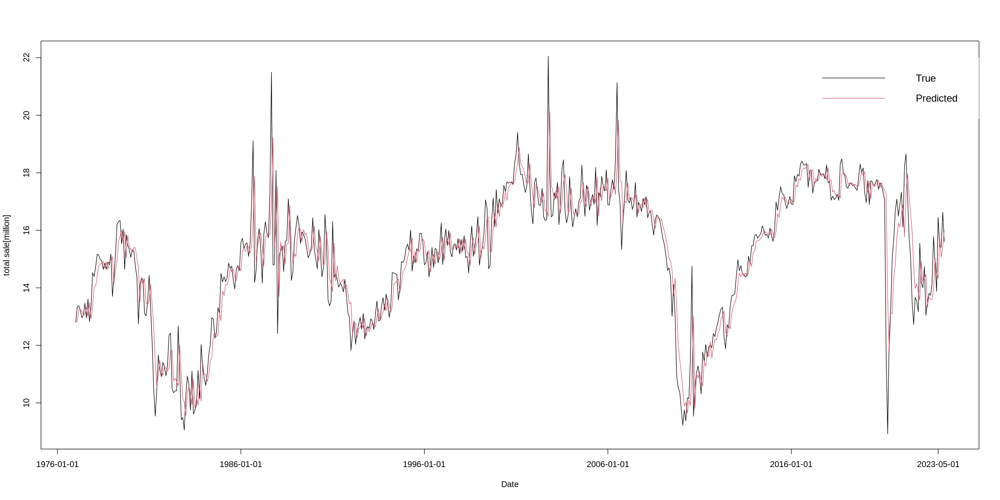

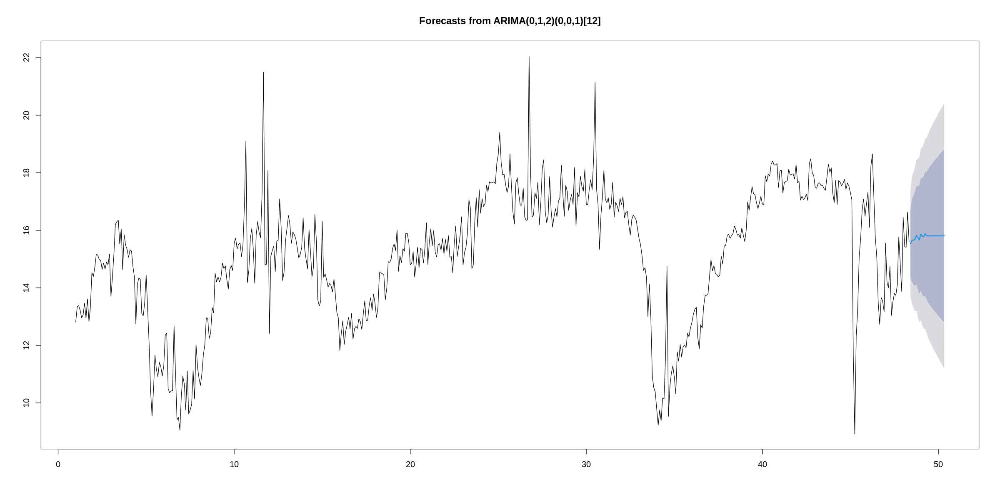

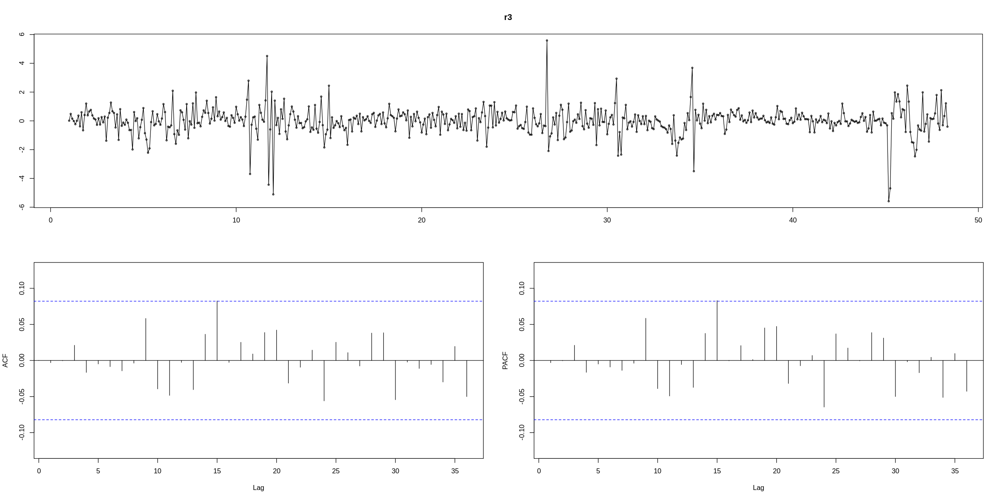

In [86]:
plot(my_ts,ylab="total sale[million]", xlab="Date",xaxt='n')
axis(1, at=c(0,10,20,30,40,48), labels=sail_total$DATE[c(1,121,241,361,481,569)])
lines(fit3, col=2)
legend(40, 22, legend=c("True", "Predicted"),
       col=c(1, 2), lty=1, cex=1.2,box.lty=0)

f3<- forecast(a3)
plot(f3)

r3<- residuals(a3)
tsdisplay(r3)

In [87]:
hold <- window(ts(my_ts), start = 550)
fit_predicted <- arima(ts(my_ts[-c(550:569)]), order =c(0,1,2), seasonal = list(order = c(0,0,2), period = 12))
forecast_pred <- forecast(fit_predicted,h=19)

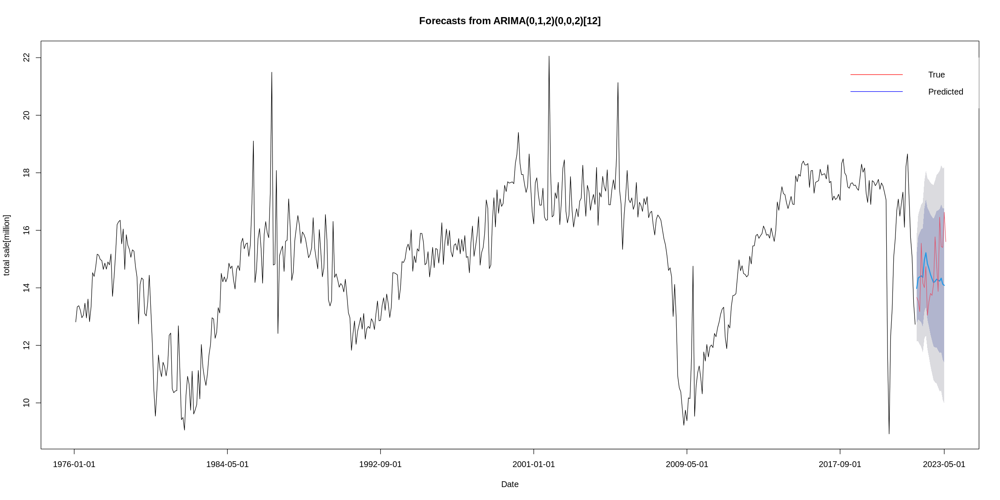

In [88]:
plot(forecast_pred,xaxt='n',ylab="total sale[million]", xlab="Date")
axis(1, at=c(0,100,200,300,400,500,568), labels=sail_total$DATE[c(1,101,201,301,401,501,569)])
legend(490, 22, legend=c("True", "Predicted"),
       col=c('red', 'blue'), lty=1, cex=1,box.lty=0)
lines(hold,col=2)

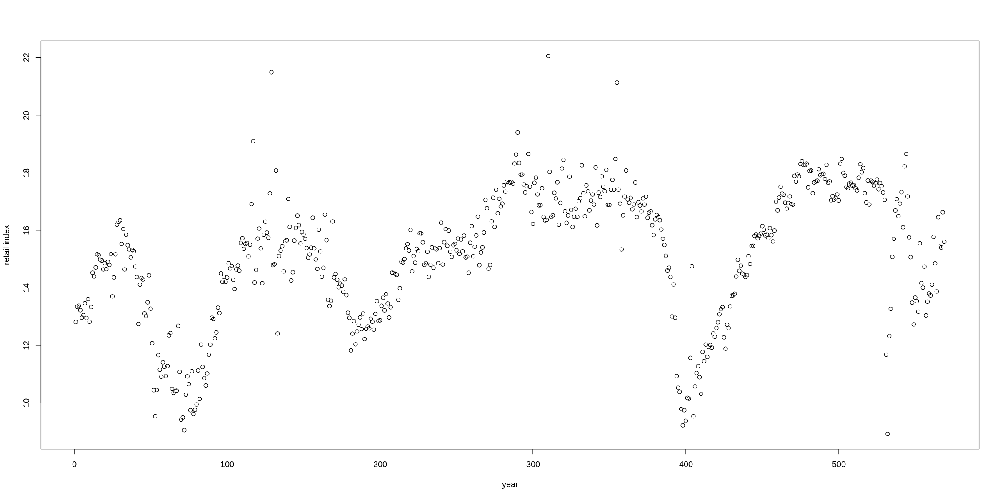

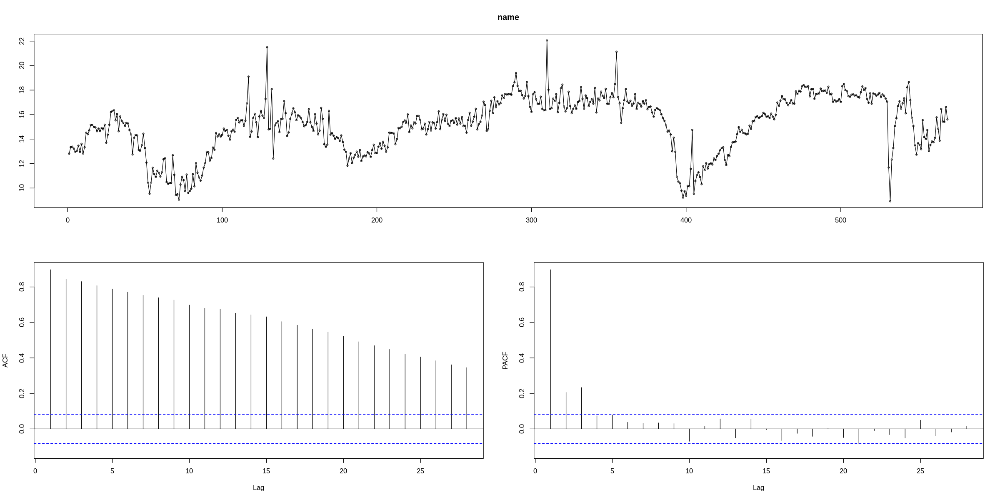

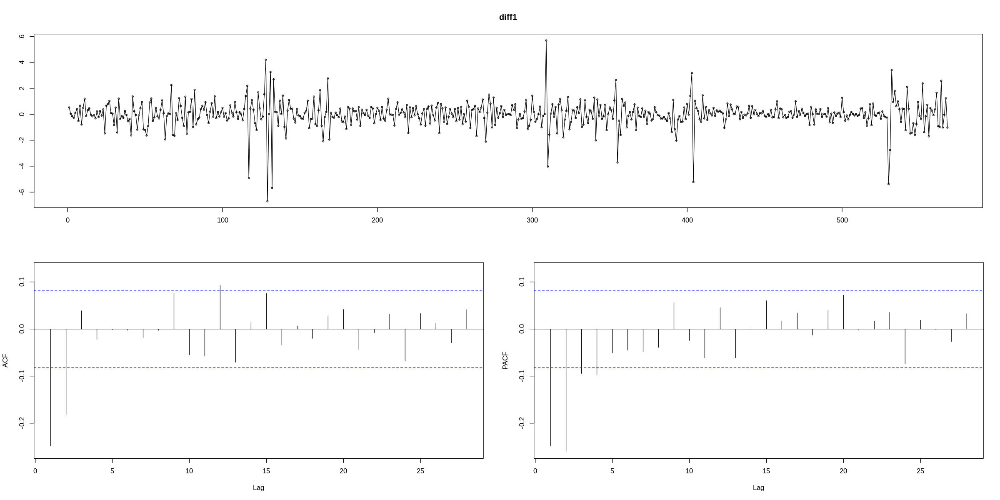

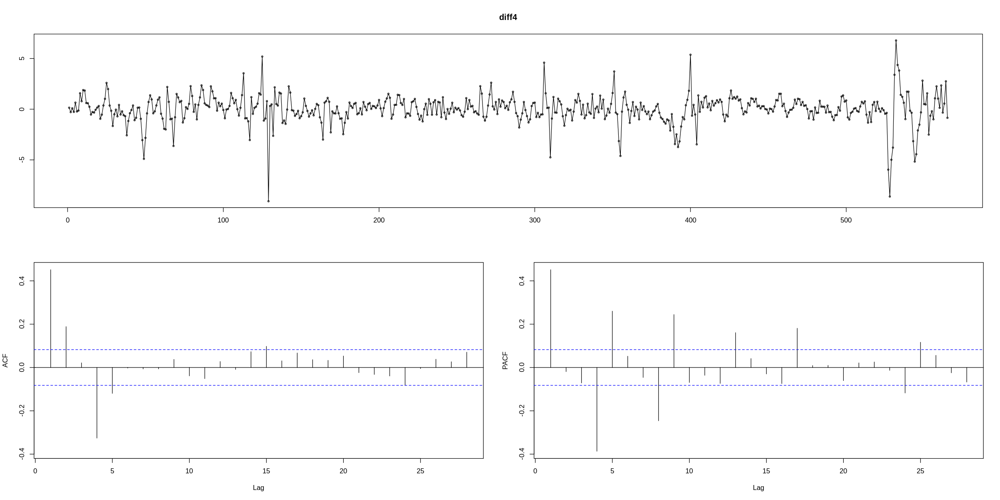

In [89]:
plot(name, ylab="retail index",xlab="year")
tsdisplay(name)

diff1<- diff(name) ##first difference
diff4<- diff(name, lag=4) ###seasonal difference
tsdisplay(diff1)
tsdisplay(diff4)

#foecaste partial

In [90]:
name = n_train_p
name2 = n_train_p[-c(86:96)]

my_ts <- ts(name2, frequency = 12)
my_ts2<-ts(name, frequency = 12)

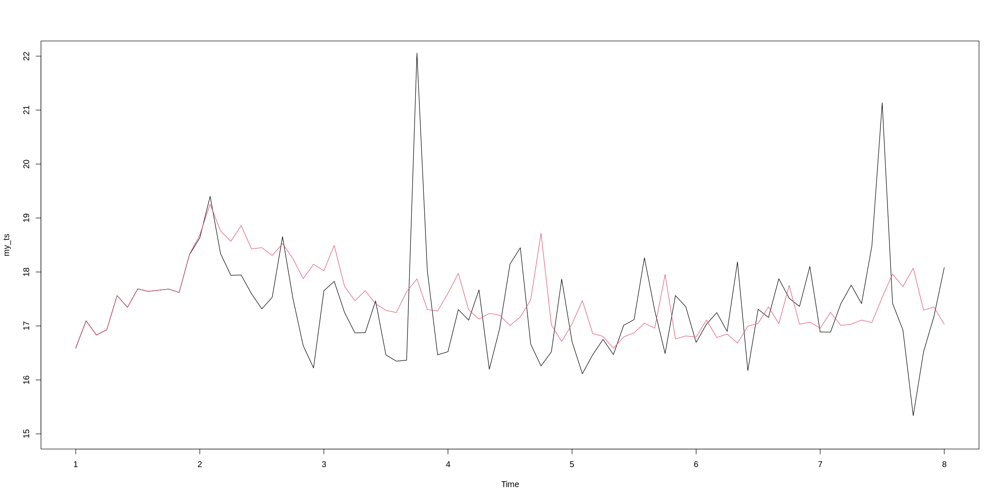

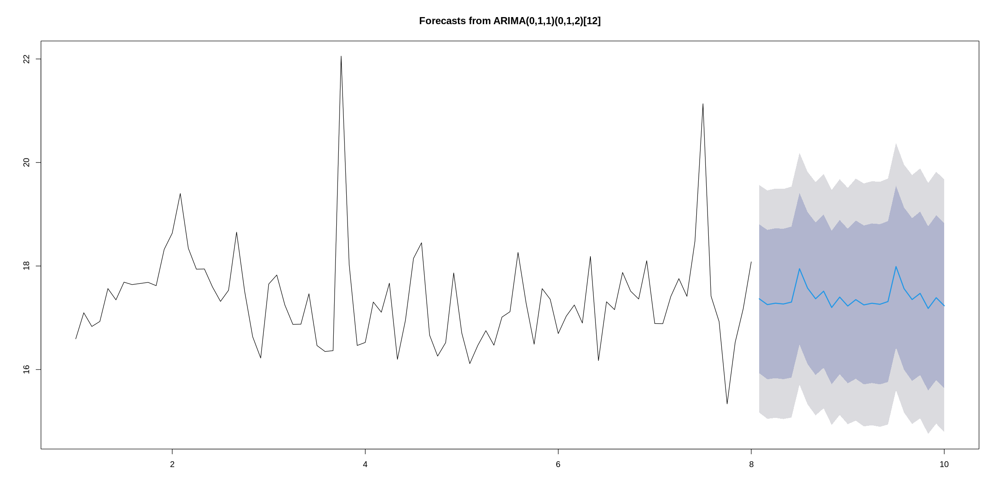

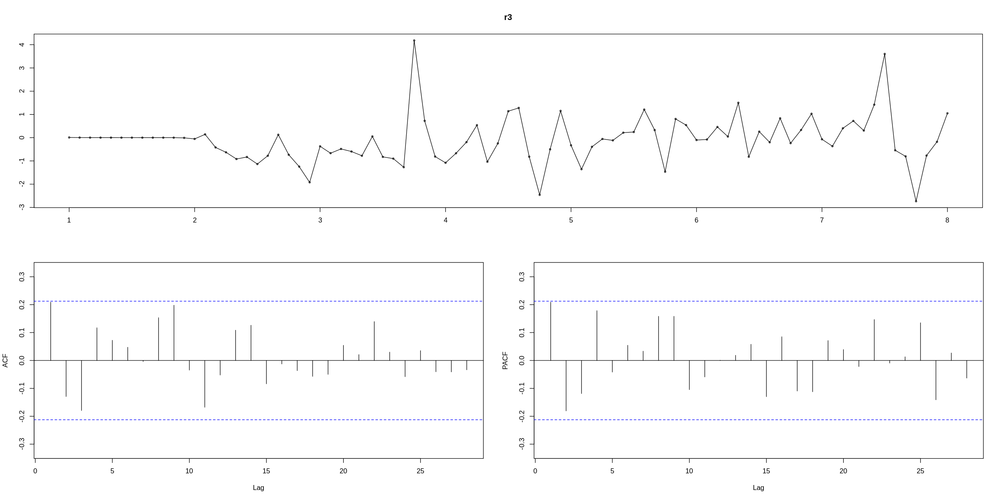

In [91]:
a3 <- arima(my_ts, order =c(0,1,1), seasonal = list(order = c(0,1,2), period = 12))


fit3<- fitted(a3)

plot(my_ts,ylim=c(15,22))
lines(fit3, col=2)

f3<- forecast(a3)
plot(f3)

r3<- residuals(a3)
tsdisplay(r3)

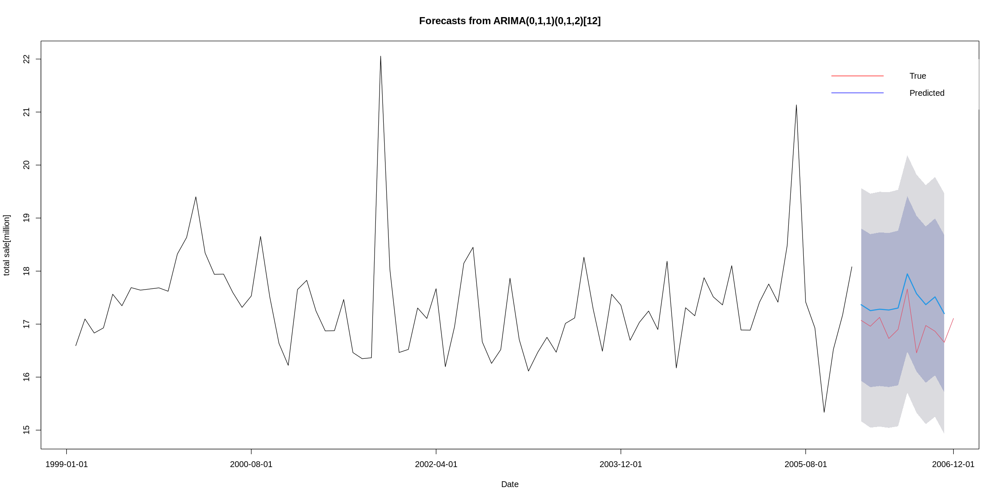

In [92]:
hold <- window(ts(my_ts2), start = 86)
fit_predicted <- arima(ts(my_ts2[-c(86:96)]), order =c(0,1,1), seasonal = list(order = c(0,1,2), period = 12))
forecast_pred <- forecast(fit_predicted,h=10)
plot(forecast_pred,ylab="total sale[million]", xlab="Date",xaxt='n')
axis(1, at=c(0,20,40,60,80,96), labels=train_partial$DATE[c(1,20,40,60,80,96)])
legend(80, 22, legend=c("True", "Predicted"),
       col=c('red', 'blue'), lty=1, cex=1,box.lty=0)
lines(hold,col=2)

In [93]:
summary(fit_predicted)


Call:
arima(x = ts(my_ts2[-c(86:96)]), order = c(0, 1, 1), seasonal = list(order = c(0, 
    1, 2), period = 12))

Coefficients:
          ma1     sma1    sma2
      -0.9144  -0.9013  0.0141
s.e.   0.0791   0.4443  0.1949

sigma^2 estimated as 1.192:  log likelihood = -117.86,  aic = 243.72

Training set error measures:
                      ME     RMSE       MAE        MPE     MAPE      MASE
Training set -0.09760774 1.004931 0.6786084 -0.8000189 3.863877 0.8787283
                  ACF1
Training set 0.2089757

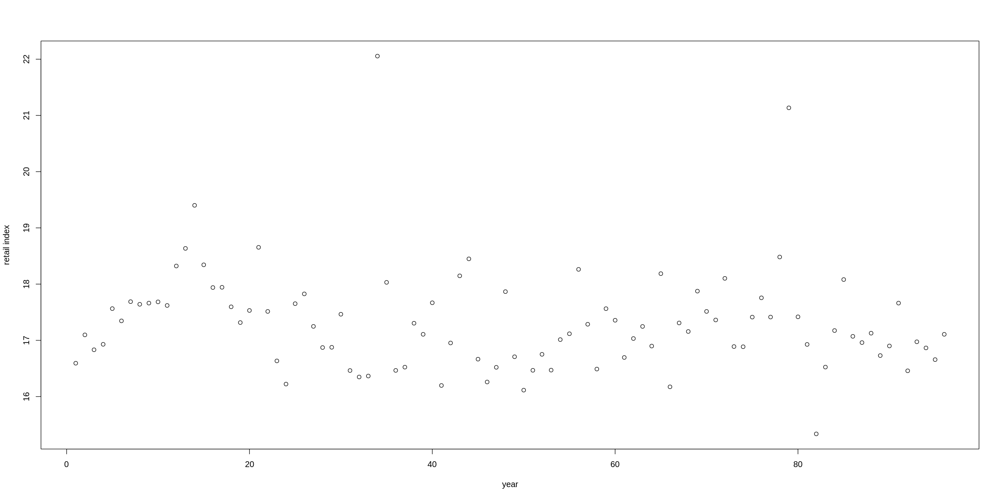

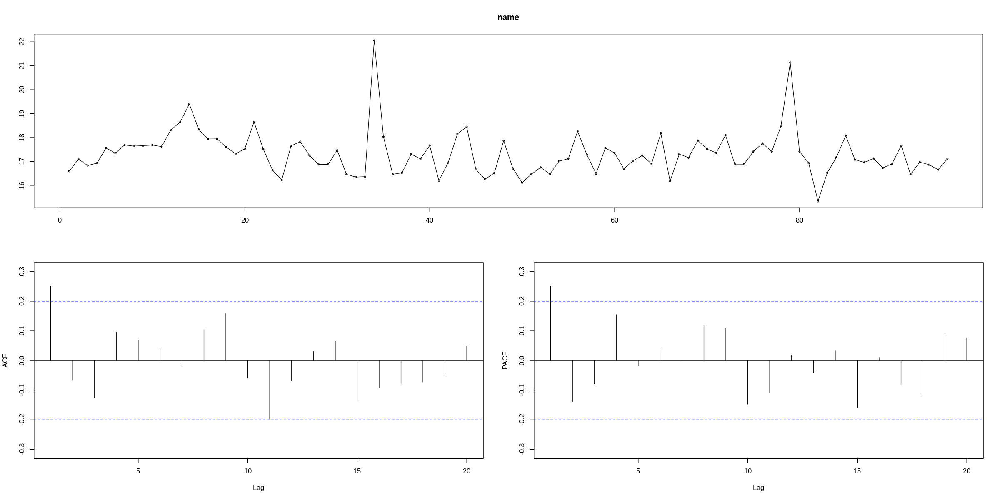

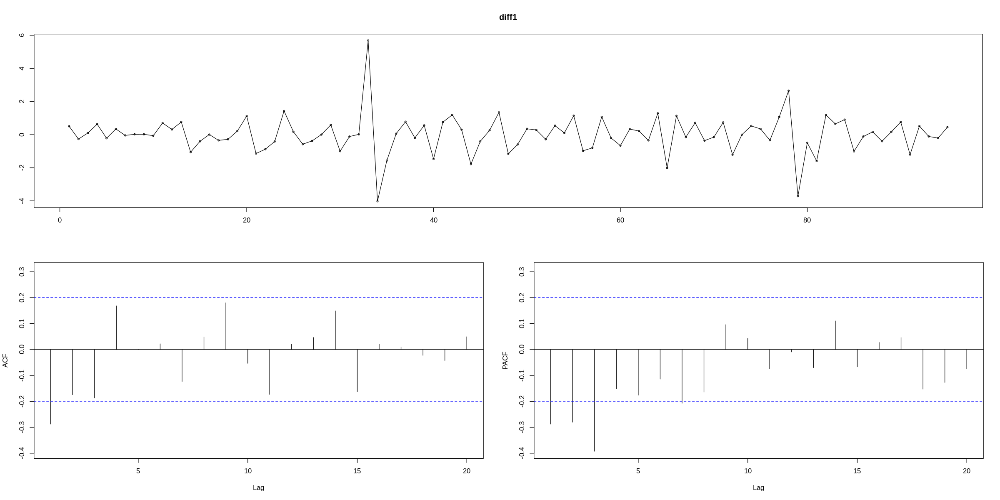

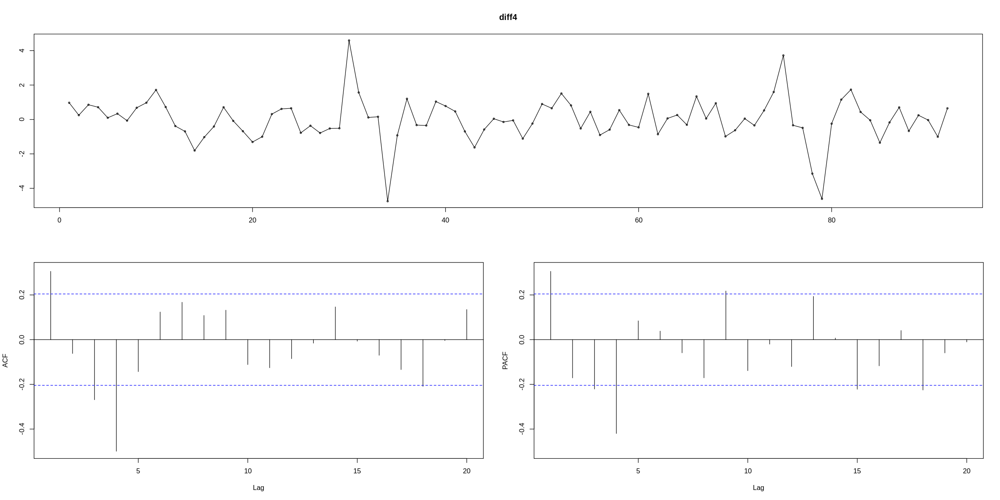

In [94]:
plot(name, ylab="retail index",xlab="year")
tsdisplay(name)

diff1<- diff(name) ##first difference
diff4<- diff(name, lag=4) ###seasonal difference
tsdisplay(diff1)
tsdisplay(diff4)

#foecaste partial2

In [95]:
name = n_train_p2
name2 = n_train_p2[-c(64:74)]


my_ts <- ts(name2, frequency = 12)
my_ts2<-ts(name, frequency = 12)

In [96]:
best <- auto.arima(my_ts,trace=TRUE,max.p = 5, max.q = 5,max.d = 5,start.p = 0, start.q = 0)


 ARIMA(0,1,0)(1,0,1)[12] with drift         : 72.22444
 ARIMA(0,1,0)            with drift         : 69.51319
 ARIMA(1,1,0)(1,0,0)[12] with drift         : 69.98141
 ARIMA(0,1,1)(0,0,1)[12] with drift         : 68.31803
 ARIMA(0,1,0)                               : 67.80636
 ARIMA(0,1,0)(1,0,0)[12] with drift         : 70.45238
 ARIMA(0,1,0)(0,0,1)[12] with drift         : 70.00379
 ARIMA(1,1,0)            with drift         : 69.59966
 ARIMA(0,1,1)            with drift         : 69.162
 ARIMA(1,1,1)            with drift         : Inf

 Best model: ARIMA(0,1,0)                               



In [97]:
best <- auto.arima(ts(my_ts2[-c(64:74)],frequency = 12),trace=TRUE,max.p = 5, max.q = 5,max.d = 5,start.p = 0, start.q = 0)



 ARIMA(0,1,0)(1,0,1)[12] with drift         : 72.22444
 ARIMA(0,1,0)            with drift         : 69.51319
 ARIMA(1,1,0)(1,0,0)[12] with drift         : 69.98141
 ARIMA(0,1,1)(0,0,1)[12] with drift         : 68.31803
 ARIMA(0,1,0)                               : 67.80636
 ARIMA(0,1,0)(1,0,0)[12] with drift         : 70.45238
 ARIMA(0,1,0)(0,0,1)[12] with drift         : 70.00379
 ARIMA(1,1,0)            with drift         : 69.59966
 ARIMA(0,1,1)            with drift         : 69.162
 ARIMA(1,1,1)            with drift         : Inf

 Best model: ARIMA(0,1,0)                               



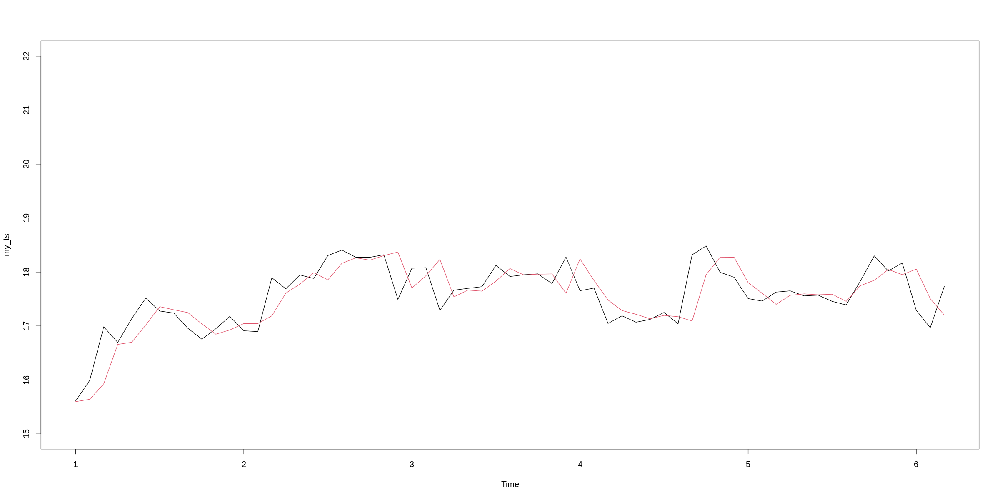

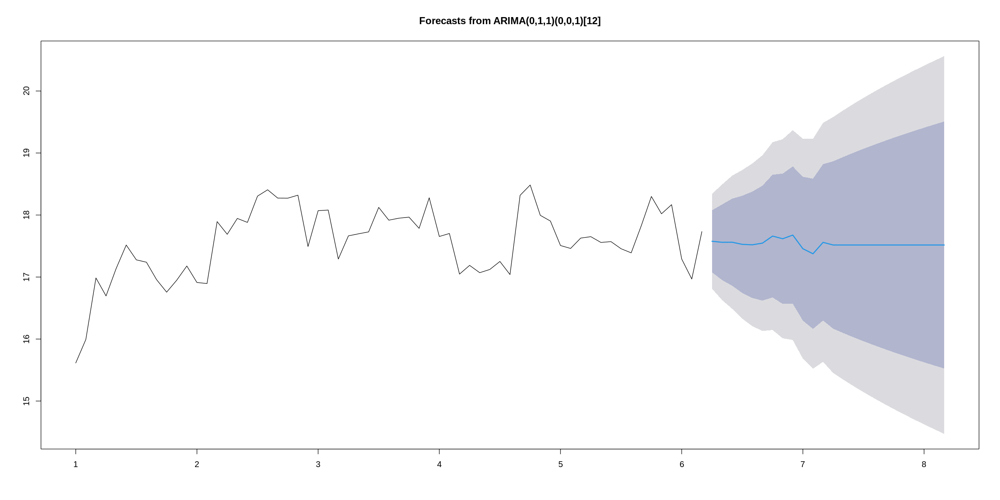

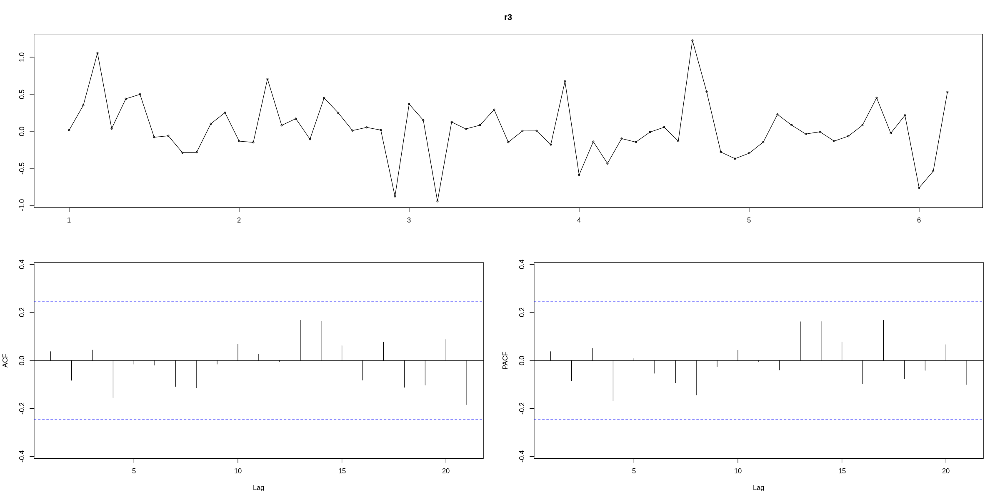

In [98]:
a3 <- arima(my_ts, order =c(0,1,1), seasonal = list(order = c(0,0,1), period = 12))


fit3<- fitted(a3)

plot(my_ts,ylim=c(15,22))
lines(fit3, col=2)

f3<- forecast(a3)
plot(f3)

r3<- residuals(a3)
tsdisplay(r3)

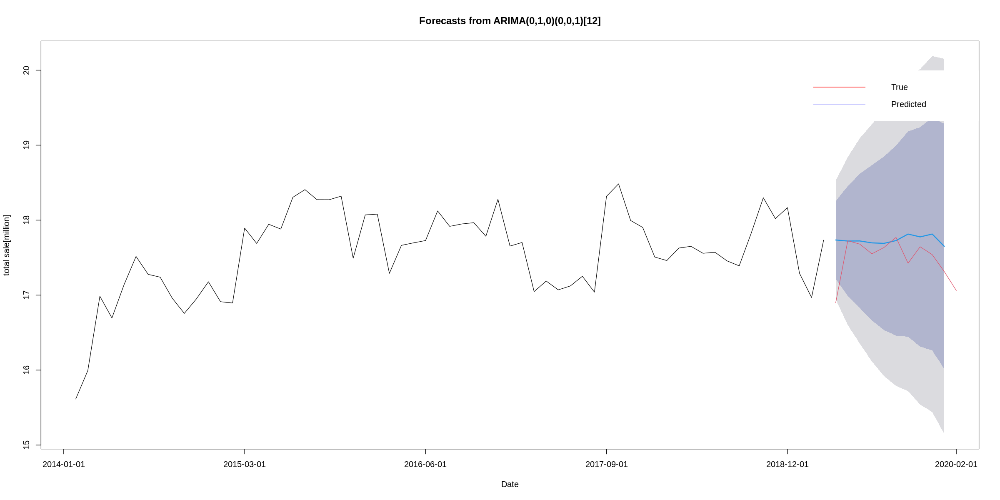

In [99]:
hold <- window(ts(my_ts2), start = 64)
fit_predicted <- arima(ts(my_ts2[-c(64:74)]), order =c(0,1,0), seasonal = list(order = c(0,0,1), period = 12))
forecast_pred <- forecast(fit_predicted,h=10)
plot(forecast_pred,ylab="total sale[million]", xlab="Date",xaxt='n')
axis(1, at=c(0,15,30,45,60,74), labels=train_partial2$DATE[c(1,15,30,45,60,74)])
legend(60, 20, legend=c("True", "Predicted"),
       col=c('red', 'blue'), lty=1, cex=1,box.lty=0)
lines(hold,col=2)

In [32]:
summary(fit_predicted)


Call:
arima(x = ts(my_ts2[-c(64:74)]), order = c(0, 1, 0), seasonal = list(order = c(0, 
    0, 1), period = 12))

Coefficients:
        sma1
      0.1980
s.e.  0.1349

sigma^2 estimated as 0.163:  log likelihood = -31.97,  aic = 67.94

Training set error measures:
                     ME      RMSE       MAE       MPE     MAPE      MASE
Training set 0.02801678 0.4004632 0.2825232 0.1431185 1.607133 0.9535868
                   ACF1
Training set -0.2016273

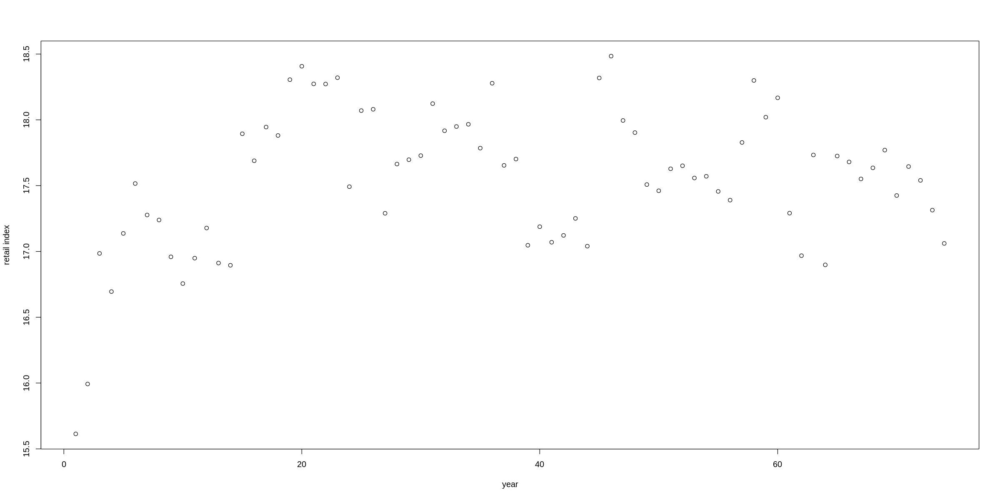

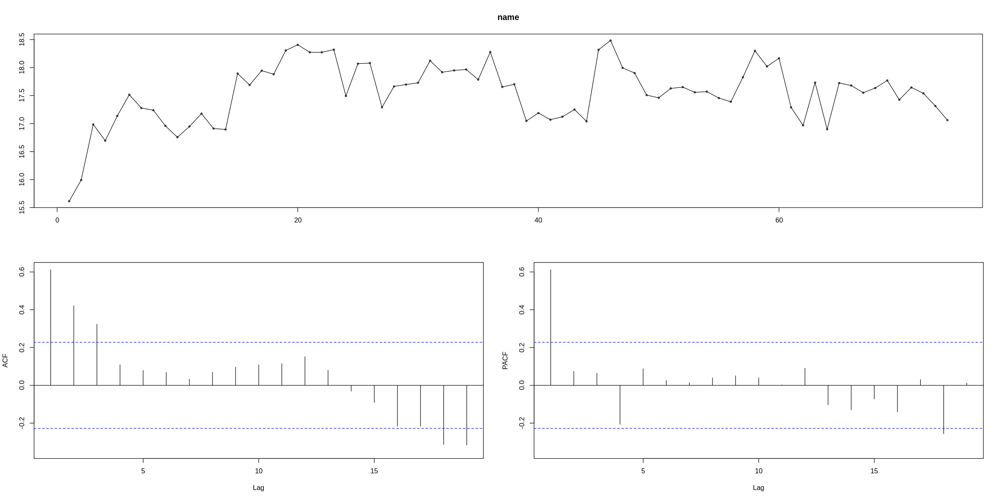

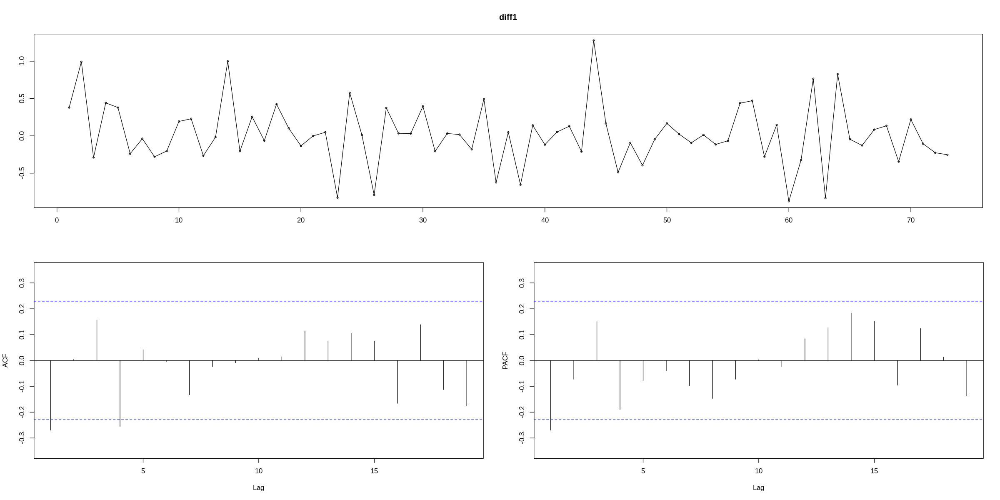

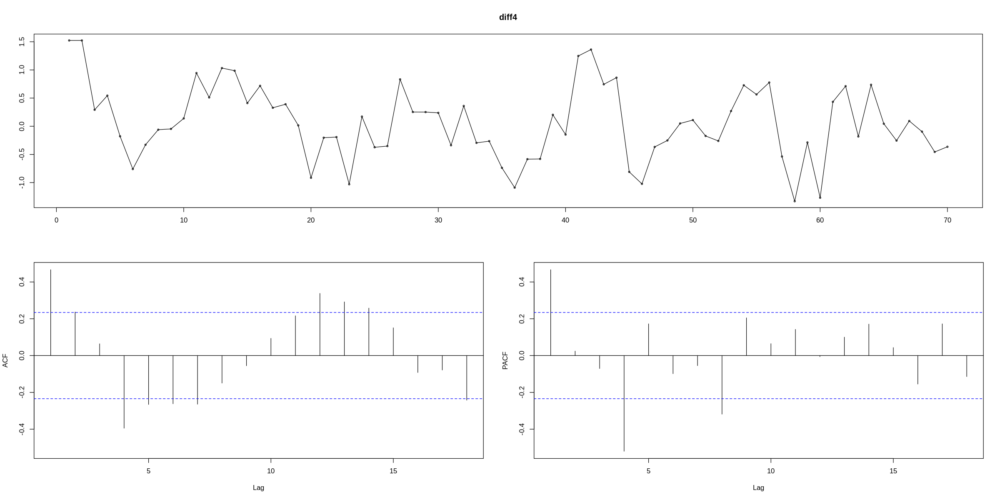

In [33]:
plot(name, ylab="retail index",xlab="year")
tsdisplay(name)

diff1<- diff(name) ##first difference
diff4<- diff(name, lag=4) ###seasonal difference
tsdisplay(diff1)
tsdisplay(diff4)

#local regression

In [ ]:
#Local regression
install.packages("sm")
library(sm)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Package 'sm', version 2.2-5.7: type help(sm) for summary information



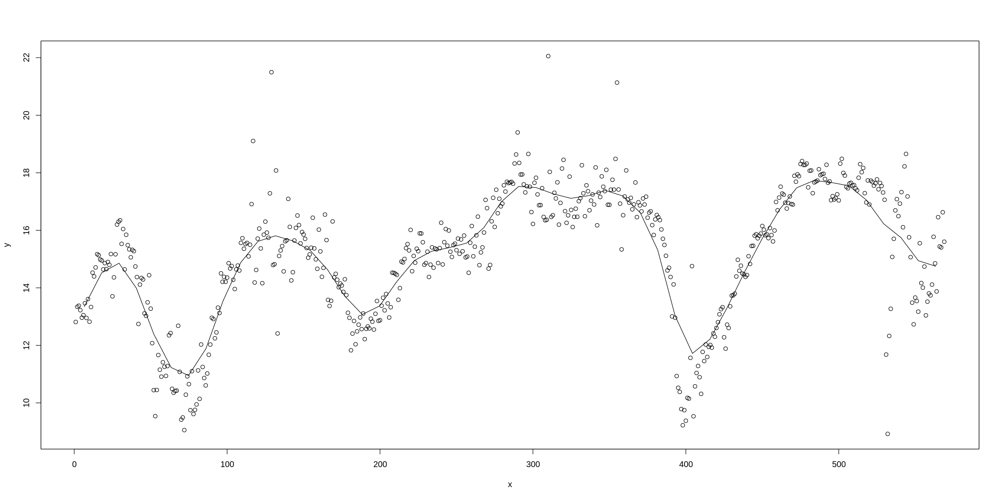

In [ ]:
y<-n_train
x<-t_train
plot(x,y)
p<-sm.regression(x, y,   h = 10, add = T)
# sm.regression(x, y,   h = 10, add = T, ngrid=200, col=2)
# sm_30<-sm.regression(x, y,   h = 30, ngrid=200, col=1)
# sm.regression(x, y,   h = 50, add = T, ngrid=200, col=2)
# p <-sm.regression(x, y,   h = 5,  add = T, ngrid=200, col=3)
# sm.regression(x, y,   h = 1,  add = T, col=7, ngrid=200)

# #We add variability bands
# sm.regression(x, y,   h = 30, ngrid=200, display="se")





In [ ]:
p

$eval.points
 [1]   6.568622  17.933168  29.297714  40.662260  52.026806  63.391352
 [7]  74.755898  86.120444  97.484990 108.849536 120.214082 131.578628
[13] 142.943173 154.307719 165.672265 177.036811 188.401357 199.765903
[19] 211.130449 222.494995 233.859541 245.224087 256.588633 267.953179
[25] 279.317725 290.682270 302.046816 313.411362 324.775908 336.140454
[31] 347.505000 358.869546 370.234092 381.598638 392.963184 404.327730
[37] 415.692276 427.056822 438.421367 449.785913 461.150459 472.515005
[43] 483.879551 495.244097 506.608643 517.973189 529.337735 540.702281
[49] 552.066827 563.431373

$estimate
 [1] 13.34711 14.51924 14.85613 13.98747 12.39366 11.23010 10.95253 11.88307
 [9] 13.56416 14.87618 15.61673 15.80859 15.63401 15.30186 14.63129 13.70395
[17] 13.07499 13.37186 14.22854 14.95104 15.27418 15.39576 15.55424 16.09584
[25] 16.99144 17.52403 17.48495 17.26463 17.11167 17.20209 17.38379 17.19163
[33] 16.60983 15.31494 13.03009 11.72054 12.20894 13.31391 14.55427 15.69

In [ ]:
rmse(y,p$estimate)

Warning message in actual - predicted:
“longer object length is not a multiple of shorter object length”


[1] 2.734914

[1] 569

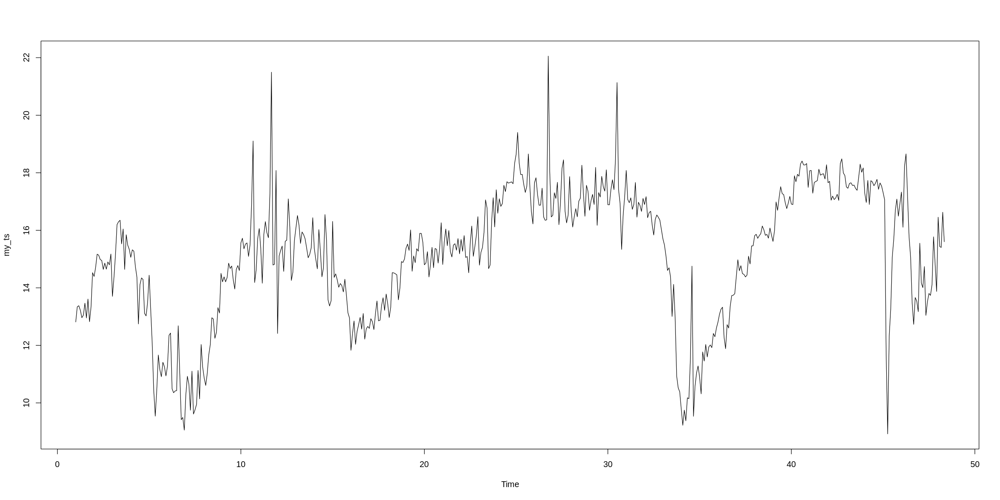

In [ ]:
name=n_train
my_ts <- ts(name, frequency = 12)
plot(my_ts)
length(my_ts)

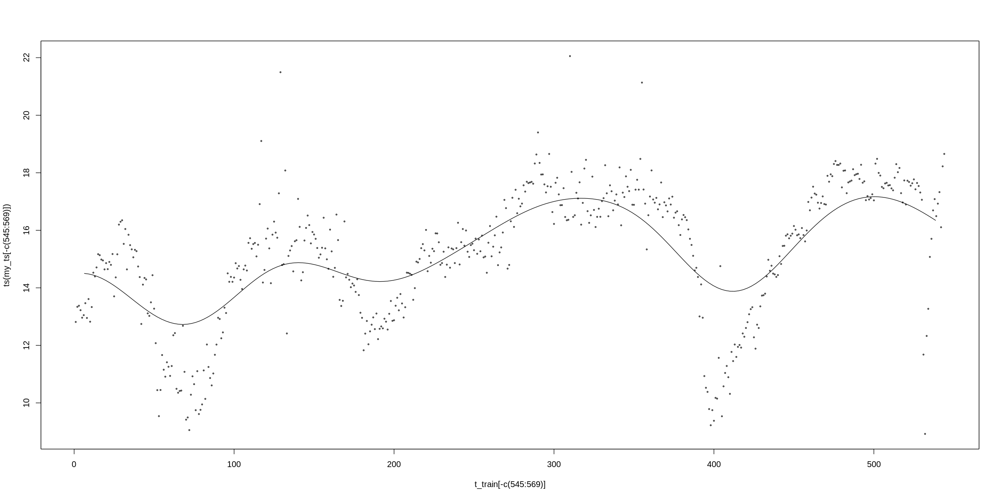

In [ ]:
hold <- window(ts(my_ts), start = 545)
fit_predicted <-sm.regression(t_train[-c(545:569)], ts(my_ts[-c(545:569)]),   h = 30, ngrid=200, col=1)


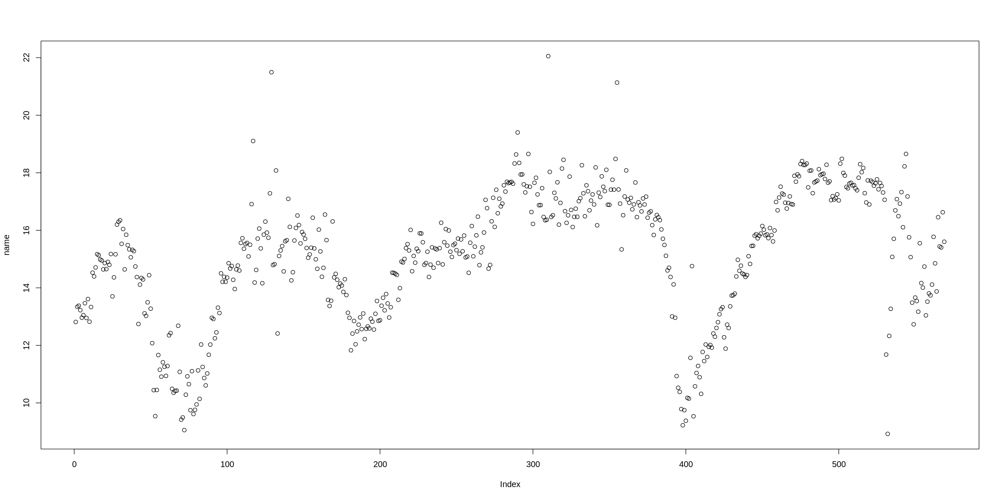

In [ ]:
plot(name)

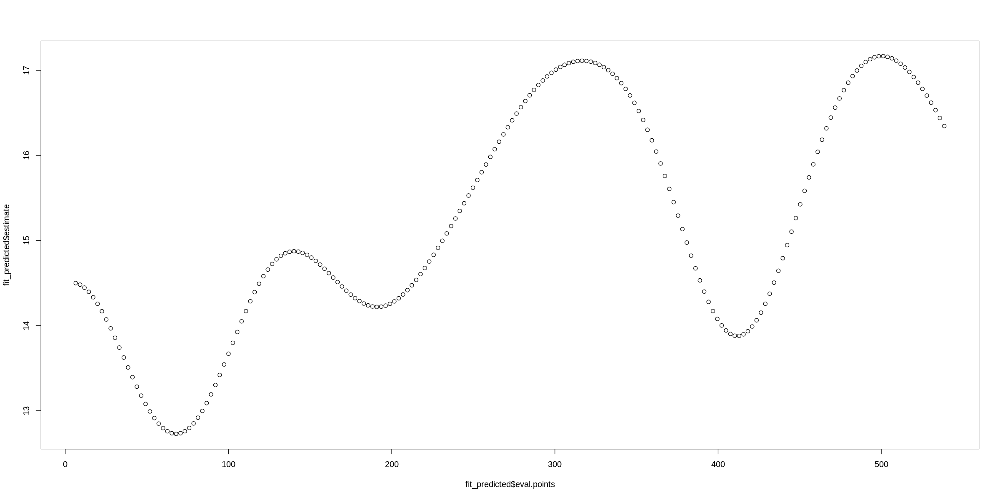

In [ ]:
plot(fit_predicted$eval.points,fit_predicted$estimate)

In [ ]:
forecast_pred[2][1]

ERROR: ignored

In [ ]:
n[3]

In [ ]:
forecast_pred <- forecast(fit_predicted$estimate,h=24)
plot(forecast_pred[2])
# par(new=TRUE)
# plot(name,type='b',col=2)

In [ ]:
# sm_30$estimate
# fit3<- fitted(sm_30)

# plot(y,ylim=c(15,22))
# lines(fit3, col=2)

f3<- forecast(sm_30$estimate)
plot(f3)

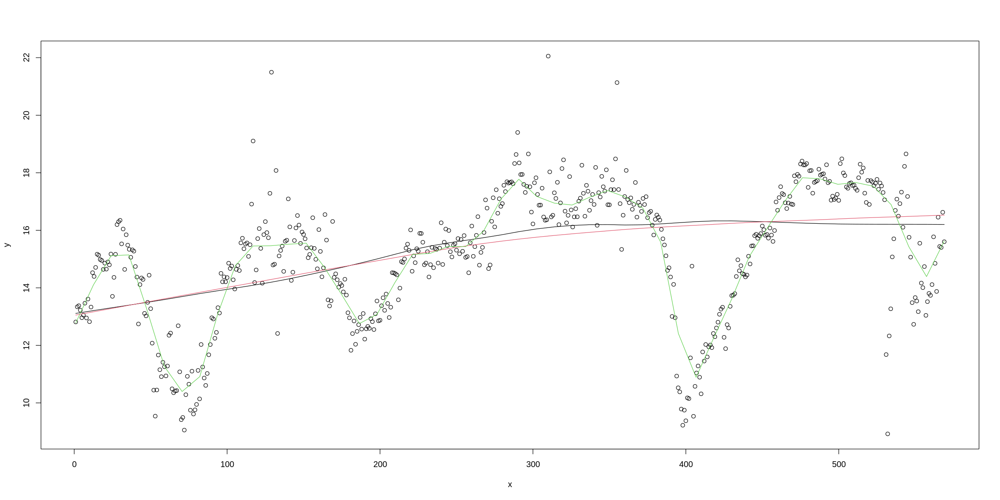

In [ ]:
#########
#Loess (no library required, default tool of R)
plot(x, y)
lo1 <- loess.smooth(x,y)
#default span= 0.75
lines(lo1)
# we try with other smoothing parameters 'span'
lo2 <- loess.smooth(x,y,span=0.9)
lines(lo2,col=2)

lo3 <- loess.smooth(x,y,span=0.05)
lines(lo3,col=3)



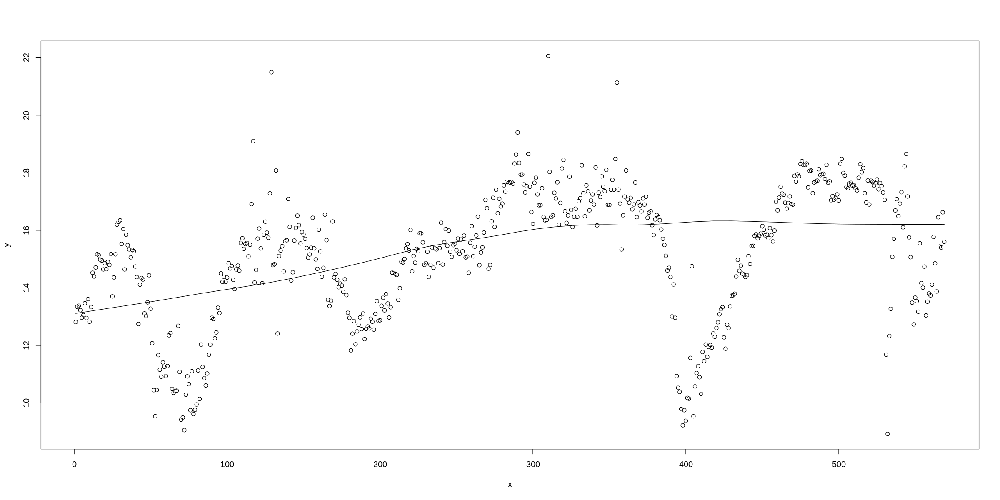

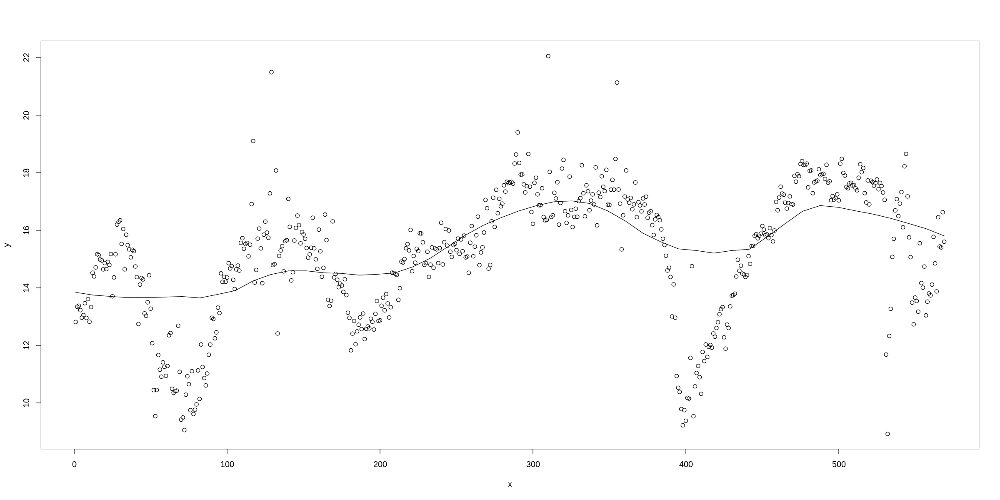

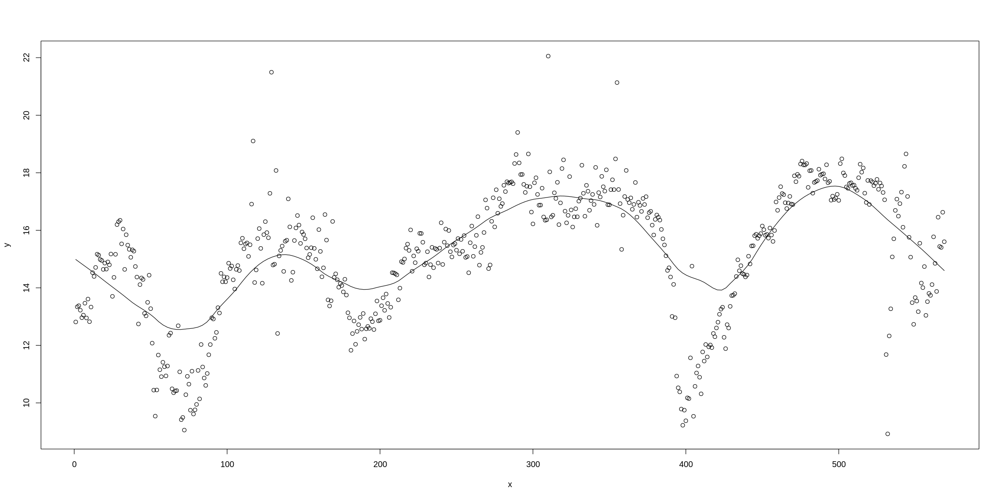

In [ ]:
#another way to perform loess, performs directly the plot
#default span= 2/3

scatter.smooth(x,y)
scatter.smooth(x,y, span=0.3)
scatter.smooth(x,y, span=0.2, evaluation=200)

#spline

In [ ]:
#######Regression splines (cubic splines)
install.packages("splines")
library(splines)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Warning message:
“package ‘splines’ is a base package, and should not be updated”


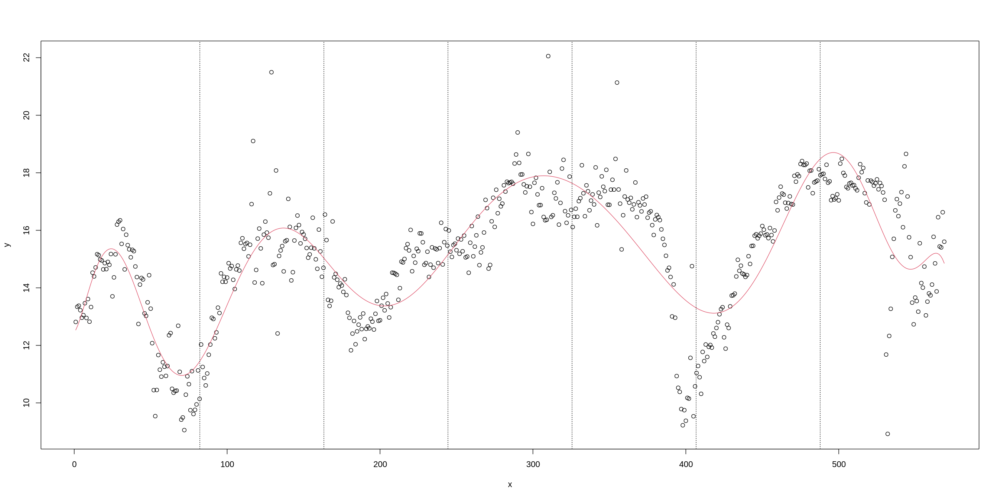

In [ ]:

#we select and identify the knots 'equispaced'
xi<-seq(min(x), max(x), length=8)

#----- Model (2 internal knots)
m1<-lm(y ~ bs(x, knots=xi[2:(length(xi)-1)], degree=7))

###---- for graphical reasons select 200 points where to evaluate the model
xxx<-seq(min(x),max(x),length=500)

#Make predictions by using the 'xxx' points
fit1<-predict(m1, data.frame(x=xxx))

#########
plot(x,y)
lines(xxx,fit1,col=2)

######vertical plots to indicate the knots
abline(v=xi[2], lty=3)
abline(v=xi[3], lty=3)
abline(v=xi[4], lty=3)
abline(v=xi[5], lty=3)
abline(v=xi[6], lty=3)
abline(v=xi[7], lty=3)



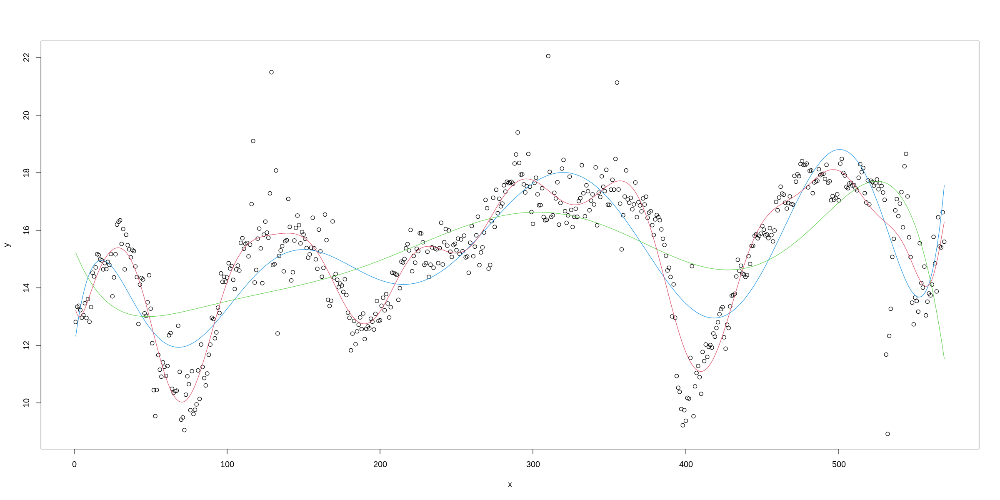

In [ ]:
#we may select the knots by using the degrees of freedom
#
#basic functions b-spline for a cubic spline (degree=3)
#df directly related to the number of knots
#df=length(knots) + degree
#The knots are selected by using the quantiles of 'x' distribution

plot(x,y)

# first model with 2 internal knots
m1<-lm(y~bs(x, df=9, degree=7))
fit1<-predict(m1, data.frame(x=xxx))
lines(xxx,fit1,col=4)
#
# second model with no internal knots
m2 <- lm(y ~ bs(x, df=7, degree=7))
fit2<-predict(m2,data.frame(x=xxx))
#plot(x,y,xlab="engine size", ylab="distance")
lines(xxx,fit2,col=3)
#
# Third model with 17 knots
m3<-lm(y~bs(x,df=24,degree=7))
fit3<-predict(m3,data.frame(x=xxx))
#plot(x,y,xlab="engine size", ylab="distance")
lines(xxx,fit3,col=2)

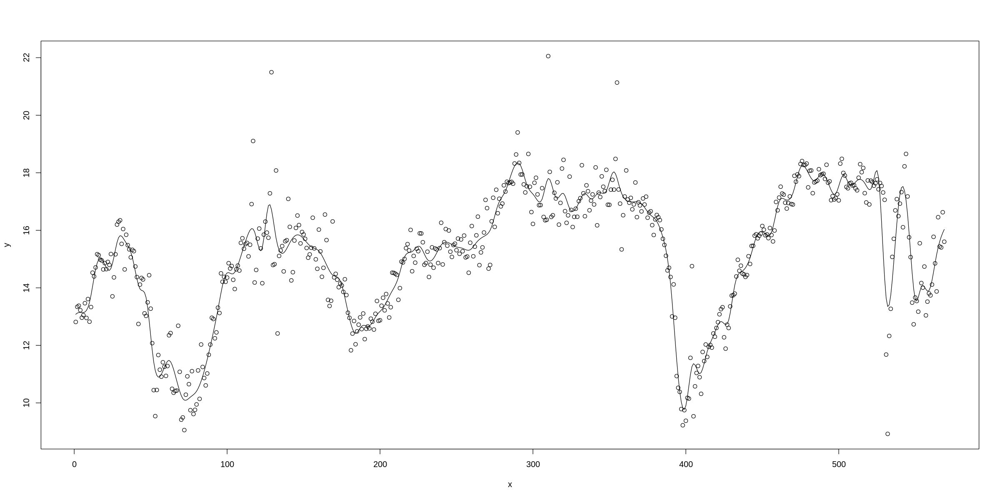

In [ ]:
#Smoothing splines (no library required, default tool)

plot(x,y)
s <- smooth.spline(x,y)
lines(s)


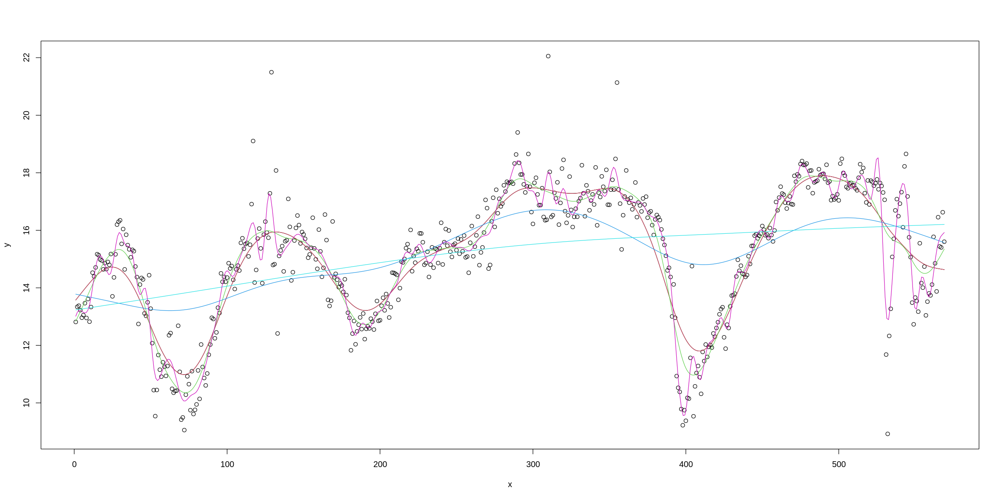

In [ ]:

# Model 1
plot(x,y)
s1 <- smooth.spline(x,y, lambda=0.0001)
lines(s1)
#
p1<- predict(s1, x=xxx)
lines(p1, col=2)
#
# Model 2
s2 <- smooth.spline(x,y, lambda=0.00001)
p2<- predict(s2, x=xxx)
lines(p2, col=3)
#
# Model 3
s3 <- smooth.spline(x,y, lambda=0.01)
p3<- predict(s3, x=xxx)
lines(p3, col=4)

# Model 4
s4 <- smooth.spline(x,y, lambda=1)
p4<- predict(s4, x=xxx)
lines(p4, col=5)

# Model 5
s5 <- smooth.spline(x,y, lambda=0.00000001)
p5<- predict(s5, x=xxx)
lines(p5, col=6)


#GAM

In [ ]:
######Generalized Additive Models#######
########################################

#######Quarterly international arrivals (in thousands) to Australia from Japan, New Zealand, UK and the US. 1981Q1 - 2012Q3
install.packages('fpp2')
install.packages('gam')

library(fpp2)
library(gam)



Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘iterators’, ‘foreach’


Loading required package: foreach

Loaded gam 1.22-2




#lab

In [ ]:



################################################################
###ARMAX model
#####5. data on US personal consumption and income
#### we want to extend the ARIMA by combining regression model and ARIMA model to obtain regression with ARIMA errors

uschange
plot(uschange) ##'classical view'
autoplot(uschange) ## 'all the series together'

##if we want to see just the first two series
par(mfrow=c(2,1))
plot(uschange[,1])
plot(uschange[,2])

tsdisplay(uschange[,1])

##to go back to 1 panel
par(mfrow=c(1,1))


##estimate an ARMAX model
armax1<- Arima(uschange[,1], xreg=uschange[,2], order=c(1,0,1))
res1<- residuals(armax1)
Acf(res1)

fitted(armax1)
plot(uschange[,1])
lines(fitted(armax1), col=2)

armax2<- Arima(uschange[,1], xreg=uschange[,2], order=c(1,0,2))
res2<- residuals(armax2)
Acf(res2)

fitted(armax2)
plot(uschange[,1])
lines(fitted(armax2), col=2)
AIC(armax2)
AIC(arima1)
####Note: forecasts are available only if we have future values of 'income'

########procedure also available with auto.arima
auto.arima<- auto.arima(uschange[,1], xreg=uschange[,2])


#######6. Quarterly international arrivals (in thousands) to Australia from Japan, New Zealand, UK and the US. 1981Q1 - 2012Q3
?arrivals
autoplot(arrivals)
autoplot(arrivals[,c(1,2)])

Japan<- arrivals[,1]
NZ<- arrivals[,2]
UK<- arrivals[,3]
US<- arrivals[,4]

####we try with a simple arima model, ARMAX
auto.a<- auto.arima(NZ, xreg=Japan)
AIC(auto.a)

###### we try with a regression model with trend, season and external variable 'Japan'
mod<- tslm(NZ~ trend+season+Japan)
summary(mod)
fitted(mod)
plot(NZ)
lines(fitted(mod), col=2)
plot(residuals(mod))

#####analysis of residuals: autocorrelation?
dw<- dwtest(mod, alt="two.sided")
tsdisplay(residuals(mod))
#####fit an arima model to residuals
aar<- auto.arima(residuals(mod))
fitted(aar)

#######complete the analysis by summing predictions made with linear model and arma on residuals
plot(NZ)
lines(fitted(mod)+fitted(aar), col=3)

######Notice the difference between the two methods: ARMAX and linear regression+ arima on residuals

######Another way of performing the same linear regression

tt<- (1:length(NZ))
seas <- factor(c(rep(1:4,length(NZ)/4),1:3)) #1:3 because there are three observations 'out'
mod2 <- lm(NZ~ tt+seas+Japan)
summary(mod2)
AIC(mod2)
AIC(mod)


####SARMAX refinement for diffusion models, Twitter case
###

library(readxl)
library(DIMORA)


twitter<- read_excel("twitter.xlsx")
length(twitter$twitter)
tw<- (twitter$twitter)


######GGM
GGM_tw<- GGM(tw, prelimestimates=c(4.463368e+04, 0.001, 0.01, 1.923560e-03, 9.142022e-02))
summary(GGM_tw)

pred_GGM_tw<- predict(GGM_tw, newx=c(1:60))
pred_GGM_tw.inst<- make.instantaneous(pred_GGM_tw)

plot(tw, type= "b",xlab="Quarter", ylab="Quarterly revenues",  pch=16, lty=3, cex=0.6, xlim=c(1,60))
lines(pred_GGM_tw.inst, lwd=2, col=2)
lines(pred.insttw, lwd=2, col=3)

###Analysis of residuals
res_GGMtw<- residuals(GGM_tw)
acf<- acf(residuals(GGM_tw))


fit_GGMtw<- fitted(GGM_tw)
fit_GGMtw_inst<- make.instantaneous(fit_GGMtw)




####SARMAX refinement
library(forecast)
####SARMAX model with external covariate 'fit_GGM'
s2 <- Arima(cumsum(tw), order = c(3,0,1), seasonal=list(order=c(3,0,1), period=4),xreg = fit_GGMtw)
summary(s2)
pres2 <- make.instantaneous(fitted(s2))


plot(twitter$twitter, type= "b",xlab="Quarter", ylab="Quarterly revenues",  pch=16, lty=3, xaxt="n", cex=0.6)
axis(1, at=c(1,10,19,28,37,46), labels=twitter$quarter[c(1,10,19,28,37,46)])
lines(fit_GGMtw_inst, lwd=1, lty=2)
lines(pres2, lty=1,lwd=1, col=2)


#lab2

In [ ]:

#-----
#-----

#
#
#-----


########################################
######Generalized Additive Models#######
########################################

#######Quarterly international arrivals (in thousands) to Australia from Japan, New Zealand, UK and the US. 1981Q1 - 2012Q3
library(fpp2)

?arrivals
autoplot(arrivals)
autoplot(arrivals[,c(1,2)])

Japan<- arrivals[,1]
NZ<- arrivals[,2]
UK<- arrivals[,3]
US<- arrivals[,4]



######Another way of performing the same linear regression

tt<- (1:length(NZ))
seas <- factor(c(rep(1:4,length(NZ)/4),1:3))
#####1:3 because there are three observations 'out'
mod2 <- lm(NZ~ tt+seas+Japan)
summary(mod2)
AIC(mod2)


#######we now try with a GAM
library(gam)
?s

#Values for df should be greater than 1, with df=1 implying a linear fit. Default is df=4
g1 <- gam(NZ~s(tt)+seas+s(Japan))
summary(g1)

#######time and Japan have a nonlinear effect (always take care of interpretability!)

par(mfrow=c(2,2))
plot(g1, se=T)
AIC(g1)


####linear model may be also performed with library(gam)
g0 <- gam(NZ~(tt)+seas+(Japan))
summary(g0)
par(mfrow=c(2,2))
plot(g0, se=T)
AIC(g0)

####GAM with splines performs better###


####try another option with loess (lo)
g2<- gam(NZ~lo(tt)+seas+lo(Japan))
summary(g2)
par(mfrow=c(2,2))
plot(g2, se=T)
AIC(g2)


#######perform analysis of residuals
tsdisplay(residuals(g1))
aar1<- auto.arima(residuals(g1))

plot(as.numeric(NZ), type="l")
lines(fitted(aar1)+ fitted(g1), col=4)



######## 'Movies' Dataset- preliminary analysis

data <- read.csv("movies.csv", stringsAsFactors=TRUE)
str(data)
#erase columns of indicator variables
data<-data[,-c(1,2)]

#transform variable release_date in format "data"
data$release_date <- as.Date(data$release_date, "%d/%m/%Y")

str(data)

# Response variable
summary(data$vote_average)
#boxplot(data$vote_average, col="orange", ylim=c(0,10), main="Movies", ylab="Rating")
#
hist(data$vote_average, col="orange", main="Movies", xlab="Rating")
#
#explanatory variables
summary(data)


summary(data[,c(1,2,5,6)])
par(mfrow=c(2,2))
for(i in c(1,2,5,6)){
  hist(data[,i], col="orange", main=paste(colnames(data)[i]), xlab="")
}

#transform quantitative variables in log scale
data$budget <- log(data$budget)
data$popularity <- log(data$popularity)
data$revenue <- log(data$revenue)

summary(data[,c(1,2,5,6)])

par(mfrow=c(2,2))
for(i in c(1,2,5,6)){
  hist(data[,i], col="orange", main=paste(colnames(data)[i]), xlab="")
}
#go back to orginal panel
par(mfrow=c(1,1))

#transform release_date in numeric
data$release_date<-as.numeric(data$release_date)
summary(data$release_date)

# Set train and test
set.seed(1)
train = sample (1:nrow(data), 0.7*nrow(data))
data.train=data[train ,]
data.test=data[-train ,]

# make some variables factor
data.train[,c(3,7, 10:24)]= lapply(data.train[,c(3,7, 10:24)],factor)
data.test[,c(3,7, 10:24)]= lapply(data.test[,c(3,7, 10:24)],factor)

str(data.train)

####Linear Model----------------------

m1 <- lm(vote_average~.-vote_classes, data=data.train)

summary(m1)

# Stepwise Regression
m2 <- step(m1, direction="both")
summary(m2)



#Prediction
p.lm <- predict(m2, newdata=data.test)
dev.lm <- sum((p.lm-data.test$vote_average)^2)
dev.lm

AIC(m2)

######################GAM--------

library(gam)

###################
##Stepwise GAM
#Start with a linear model (df=1)
g3 <- gam(vote_average~.-vote_classes, data=data.train)

#Show the linear effects
par(mfrow=c(3,5))
plot(g3, se=T)

#Perform stepwise selection using gam scope
#Values for df should be greater than 1, with df=1 implying a linear fit

sc = gam.scope(data.train[,-8], response=8, arg=c("df=2","df=3","df=4"))
g4<- step.Gam(g3, scope=sc, trace=T)
summary(g4)

AIC(g4)

par(mfrow=c(3,5))
plot(g4, se=T)

# if we want to see better some plot
par(mfrow=c(1,1))
plot(g4, se=T, ask=T)


#Prediction
data.test[,c(3,7, 10:24)]= lapply(data.test[,c(3,7, 10:24)],factor)
p.gam <- predict(g4,newdata=data.test)
dev.gam <- sum((p.gam-dati.test$vote_average)^2)
dev.gam

